In [ ]:
#import cv2
#import os

#video_path = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/CV-Video/Copy of Garden Video.mp4"
#image_path = "/content/drive/MyDrive/Colab Notebooks/Computer Vision/CV-Video/images"

# Create the image directory if it doesn't exist
# if not os.path.exists(image_path):
 ##   os.makedirs(image_path)

#cap = cv2.VideoCapture(video_path)
#frame_interval = 1  # Extract every frame
##frame_count = 0

#while cap.isOpened():
 #   ret, frame = cap.read()

  #  if not ret:
 #       break

  #  if frame_count % frame_interval == 0:
   #     frame_filename = f"frame_{frame_count}.jpg"
   #     frame_path = os.path.join(image_path, frame_filename)
    #    cv2.imwrite(frame_path, frame)

  #  frame_count += 1

#cap.release()


# Project Materials
Download the video via URL
https://drive.google.com/drive/folders/1pcmDtKW9R6TBs1E3IlWtRe19onVUe1pM?usp=sharing


In [96]:
directory = "crops-grass"

categories = ['cassava','grass', 'maize', 'sugarcane']

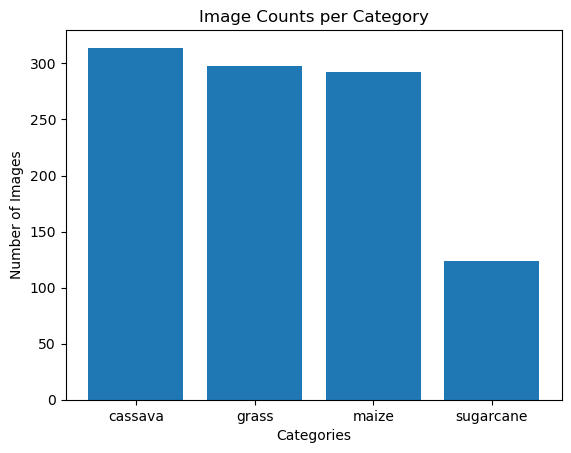

In [100]:
import os
import matplotlib.pyplot as plt
image_counts = []

# Count the number of images per category
for category in categories:
    category_path = os.path.join(directory, category)
    image_count = len(os.listdir(category_path))
    image_counts.append(image_count)

# Plot the count plot
plt.bar(categories, image_counts)
plt.xlabel("Categories")
plt.ylabel("Number of Images")
plt.title("Image Counts per Category")
plt.show()

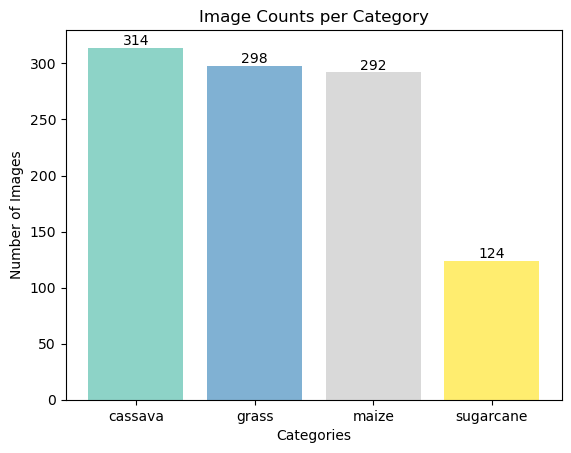

In [101]:
image_counts = []

# Count the number of images per category
for category in categories:
    category_path = os.path.join(directory, category)
    image_count = len(os.listdir(category_path))
    image_counts.append(image_count)

# Generate different colors for each bar
colors = plt.cm.get_cmap('Set3', len(categories))

# Plot the count plot
fig, ax = plt.subplots()
bars = ax.bar(categories, image_counts, color=colors(range(len(categories))))

# Add the total number on each bar
for bar, count in zip(bars, image_counts):
    ax.text(bar.get_x() + bar.get_width() / 2, bar.get_height(), count, ha='center', va='bottom')

# Customize the plot
plt.xlabel("Categories")
plt.ylabel("Number of Images")
plt.title("Image Counts per Category")

# Show the plot
plt.show()

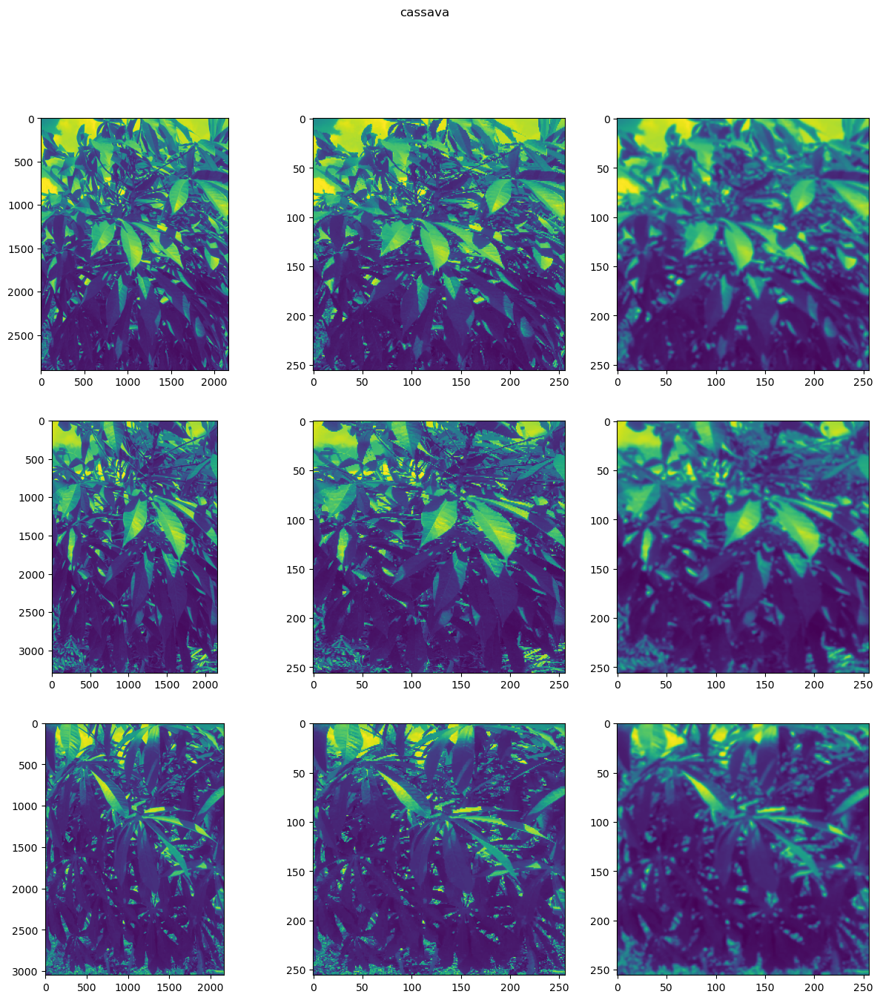

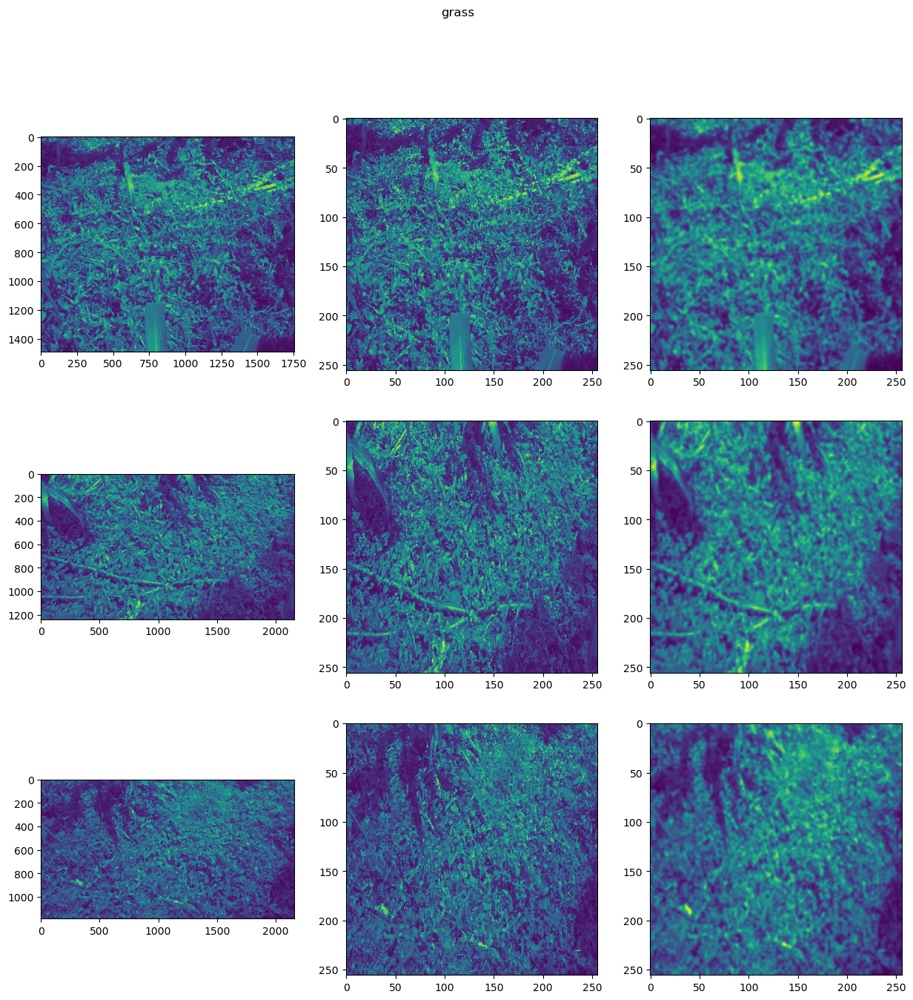

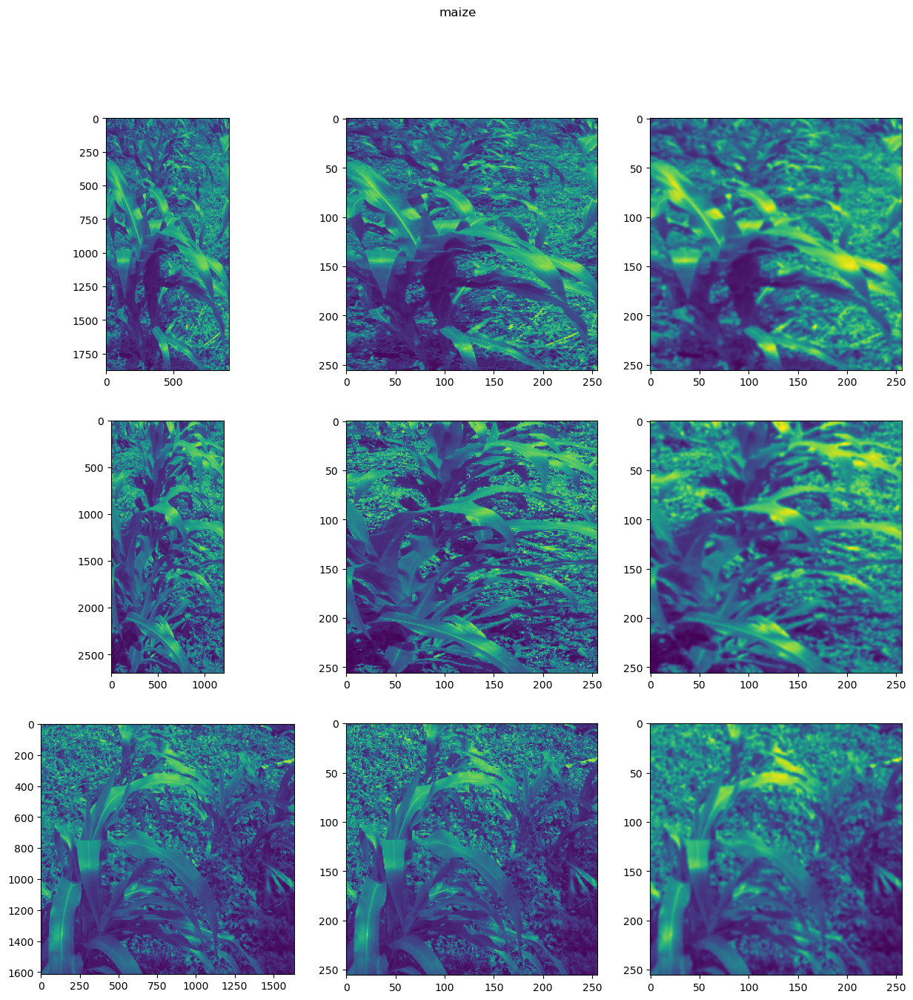

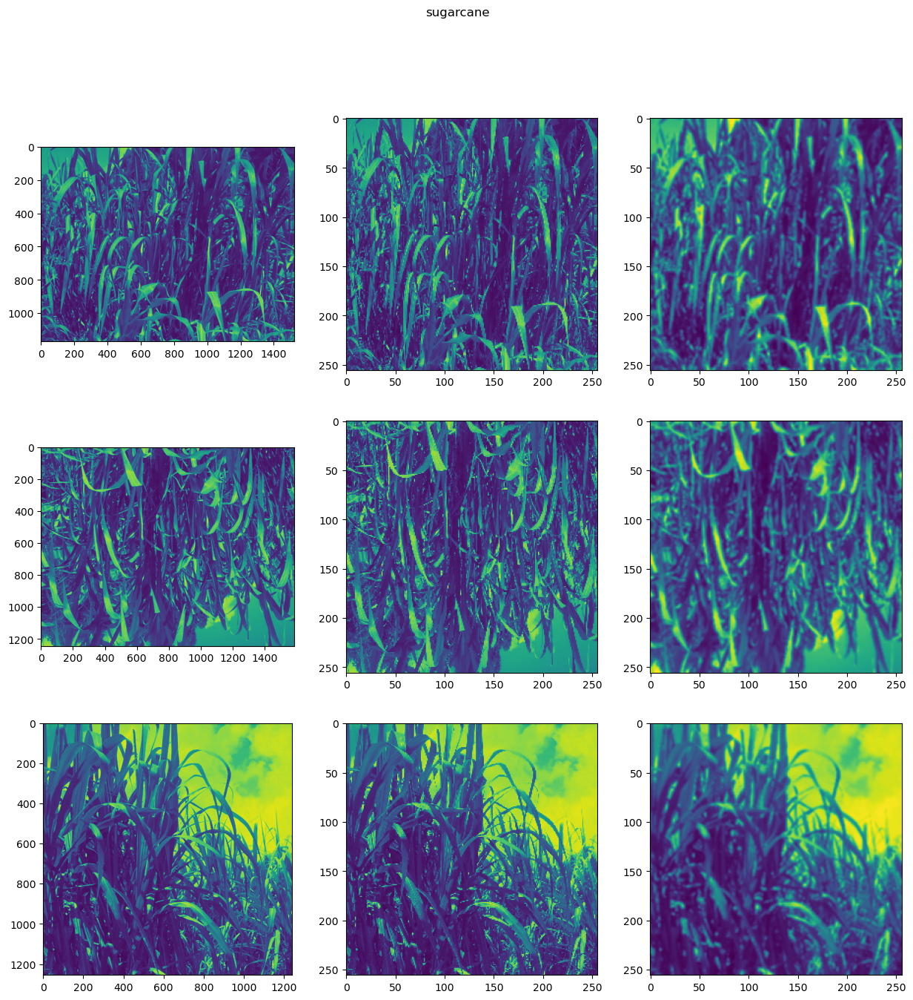

In [105]:
import os
import cv2
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
img_size = 256
for i in categories:
    cnt, samples = 0, 3
    fig, ax = plt.subplots(samples, 3, figsize=(15, 15))
    fig.suptitle(i)

    path = os.path.join(directory, i)
    class_num = categories.index(i)
    for curr_cnt, file in enumerate(os.listdir(path)):
        filepath = os.path.join(path, file)
        img = cv2.imread(filepath, 0)

        img0 = cv2.resize(img, (img_size, img_size))

        img1 = cv2.GaussianBlur(img0, (5, 5), 0)

        ax[cnt, 0].imshow(img)
        ax[cnt, 1].imshow(img0)
        ax[cnt, 2].imshow(img1)
        cnt += 1
        if cnt == samples:
            break

In [98]:
import cv2
import os
import numpy as np
# Compute color histogram for each category
for category in categories:
    category_path = os.path.join(directory, category)
    image_files = os.listdir(category_path)

    for image_file in image_files:
        image_path = os.path.join(category_path, image_file)
        image = cv2.imread(image_path)

        # Convert the image to the HSV color space
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Compute the color histogram using the most accurate method
        histogram = cv2.calcHist([hsv_image], [0, 1, 2], None, [8, 8, 8], [0, 180, 0, 256, 0, 256], cv2.NORM_L2)

        # Flatten the histogram into a 1D array
        histogram = histogram.flatten()

        # Print or store the histogram as per your requirement
        print(f"Category: {category}, Image: {image_file}")
        print(histogram)
        print()



Category: cassava, Image: cassava (1).jpg
[8.23000e+02 3.22700e+03 1.54500e+03 1.15900e+03 1.36200e+03 3.15100e+03
 3.79100e+03 2.54050e+04 8.34000e+02 5.56200e+03 2.88200e+03 2.08600e+03
 1.43600e+03 1.80200e+03 1.89000e+03 2.55900e+03 1.60900e+03 9.69800e+03
 4.75300e+03 2.12100e+03 1.42800e+03 1.26100e+03 1.01400e+03 9.36000e+02
 2.26400e+03 1.77090e+04 4.85200e+03 2.19600e+03 1.42700e+03 8.76000e+02
 4.24000e+02 2.58000e+02 5.30200e+03 1.99060e+04 3.65700e+03 1.77500e+03
 9.35000e+02 2.34000e+02 8.00000e+01 4.40000e+01 6.43900e+03 1.08800e+04
 2.71900e+03 1.62100e+03 5.53000e+02 4.40000e+01 4.30000e+01 7.00000e+00
 4.51800e+03 4.09600e+03 1.26800e+03 1.57900e+03 8.28000e+02 3.00000e+01
 1.50000e+01 0.00000e+00 6.48000e+03 3.13200e+03 6.64000e+02 1.93000e+02
 5.80000e+01 8.00000e+00 0.00000e+00 0.00000e+00 3.63000e+02 8.25800e+03
 3.92900e+03 3.76300e+03 5.76600e+03 1.21090e+04 5.01030e+04 3.53240e+04
 3.27200e+03 2.02410e+04 9.35900e+03 1.01270e+04 1.24870e+04 2.47260e+04
 4.79770e

Category: cassava, Image: cassava (100).jpg
[6.40000e+02 8.47000e+02 2.40000e+02 1.64000e+02 3.41000e+02 1.12700e+03
 2.02500e+03 3.60000e+03 3.68000e+02 1.75600e+03 7.72000e+02 1.12300e+03
 1.36600e+03 1.45700e+03 2.94400e+03 2.56200e+03 1.18800e+03 3.71700e+03
 3.23800e+03 2.66300e+03 3.81200e+03 5.32100e+03 4.57500e+03 1.08300e+03
 2.81900e+03 8.47900e+03 4.75800e+03 5.41300e+03 8.01000e+03 8.27800e+03
 2.32500e+03 1.19000e+02 4.52700e+03 1.23530e+04 5.96200e+03 5.13500e+03
 2.65500e+03 6.21000e+02 4.60000e+01 0.00000e+00 5.15200e+03 1.15910e+04
 4.27400e+03 2.51300e+03 3.79000e+02 4.20000e+01 1.00000e+00 0.00000e+00
 2.77500e+03 6.35300e+03 2.26500e+03 1.18800e+03 4.80000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 5.13200e+03 4.78600e+03 1.16900e+03 4.34000e+02
 3.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.50000e+02 2.21600e+03
 1.21500e+03 1.73900e+03 2.70000e+03 6.72600e+03 2.01040e+04 2.40900e+04
 6.06100e+03 1.25930e+04 5.70000e+03 6.51000e+03 8.12200e+03 1.41060e+04
 2.3292

Category: cassava, Image: cassava (103).jpg
[2.67000e+02 1.32000e+03 5.12000e+02 3.40000e+02 4.68000e+02 6.04000e+02
 2.44300e+03 9.28600e+03 3.60000e+02 2.23300e+03 1.77100e+03 1.69400e+03
 1.79100e+03 1.84800e+03 2.42400e+03 2.36000e+03 8.32000e+02 4.98600e+03
 5.05200e+03 5.06900e+03 6.64100e+03 1.07840e+04 6.33200e+03 1.45300e+03
 1.43000e+03 1.07900e+04 8.91200e+03 1.16180e+04 2.31690e+04 2.66460e+04
 2.89800e+03 1.31000e+02 3.35800e+03 1.29810e+04 1.00160e+04 1.12080e+04
 6.06700e+03 1.20100e+03 6.40000e+01 0.00000e+00 3.71000e+03 1.23160e+04
 8.10900e+03 3.47600e+03 5.77000e+02 1.64000e+02 2.00000e+00 0.00000e+00
 2.49600e+03 7.51300e+03 4.43500e+03 1.20400e+03 6.78000e+02 2.10000e+01
 0.00000e+00 0.00000e+00 6.25700e+03 6.82300e+03 1.85400e+03 2.32000e+02
 9.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.04000e+02 2.98000e+03
 1.73200e+03 1.02700e+03 2.08500e+03 4.48000e+03 1.95730e+04 1.73530e+04
 3.40200e+03 1.12170e+04 1.10360e+04 7.20300e+03 9.45900e+03 1.65220e+04
 2.9708

Category: cassava, Image: cassava (107).jpg
[6.46000e+02 7.53000e+02 7.29000e+02 5.28000e+02 7.21000e+02 1.56800e+03
 2.98800e+03 1.31540e+04 4.98000e+02 1.99000e+03 1.95500e+03 2.45400e+03
 2.35400e+03 2.31900e+03 2.43200e+03 1.71600e+03 1.51100e+03 4.47000e+03
 6.12200e+03 9.61100e+03 9.33500e+03 4.68800e+03 2.22800e+03 6.47000e+02
 1.88300e+03 8.89200e+03 1.09660e+04 2.53080e+04 2.03440e+04 4.42300e+03
 7.40000e+02 1.30000e+02 2.65700e+03 1.04170e+04 1.24770e+04 1.25500e+04
 3.42900e+03 6.12000e+02 8.80000e+01 6.00000e+00 3.42600e+03 9.42800e+03
 6.69100e+03 2.30700e+03 3.40200e+03 5.80000e+01 7.00000e+00 0.00000e+00
 2.77600e+03 6.13800e+03 2.63600e+03 8.49000e+02 1.80000e+03 2.00000e+00
 0.00000e+00 0.00000e+00 7.86800e+03 6.43700e+03 1.16400e+03 1.24000e+02
 1.30000e+01 0.00000e+00 0.00000e+00 0.00000e+00 5.18000e+02 1.23300e+03
 1.52200e+03 1.20600e+03 2.08300e+03 4.90600e+03 1.00060e+04 6.30600e+03
 3.67600e+03 8.42200e+03 6.97000e+03 7.61500e+03 8.11400e+03 1.28670e+04
 1.6469

Category: cassava, Image: cassava (11).jpg
[2.96600e+03 2.03700e+03 9.90000e+02 7.31000e+02 1.01900e+03 1.82000e+03
 4.37100e+03 1.26250e+04 3.01600e+03 4.54000e+03 2.54600e+03 1.78400e+03
 1.85100e+03 2.14700e+03 3.11400e+03 5.35800e+03 5.24500e+03 1.09080e+04
 5.12600e+03 3.14700e+03 2.90600e+03 3.31000e+03 4.78400e+03 3.83900e+03
 8.44200e+03 2.25420e+04 7.93400e+03 4.97300e+03 3.68100e+03 3.81900e+03
 3.42700e+03 7.15000e+02 1.24750e+04 2.54250e+04 8.36000e+03 4.68600e+03
 2.64500e+03 1.27700e+03 3.03000e+02 1.50000e+01 1.19090e+04 1.92690e+04
 6.16000e+03 5.97400e+03 7.15000e+02 9.50000e+01 2.00000e+00 0.00000e+00
 7.45800e+03 1.11550e+04 3.57200e+03 2.06300e+03 1.52000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 1.01870e+04 8.67100e+03 1.81600e+03 3.10000e+02
 2.60000e+01 0.00000e+00 0.00000e+00 0.00000e+00 1.19000e+03 2.75400e+03
 2.56200e+03 2.82600e+03 4.24900e+03 1.17830e+04 6.81500e+04 3.27930e+04
 9.26200e+03 1.86970e+04 9.54300e+03 7.80900e+03 9.20000e+03 2.37270e+04
 3.60210

Category: cassava, Image: cassava (112).jpg
[9.43000e+02 2.49000e+02 4.37000e+02 9.42000e+02 1.08800e+03 1.20900e+03
 1.84100e+03 7.70000e+02 1.40100e+03 2.13000e+03 3.90500e+03 5.00800e+03
 4.76900e+03 4.55400e+03 4.24900e+03 3.15100e+03 3.36800e+03 8.45900e+03
 1.42280e+04 1.65490e+04 1.89050e+04 1.70920e+04 1.14110e+04 4.28700e+03
 5.64300e+03 1.82330e+04 3.13480e+04 5.69050e+04 4.47590e+04 2.46300e+04
 4.16000e+03 3.31000e+02 8.32700e+03 2.46120e+04 4.54550e+04 5.17460e+04
 2.25330e+04 4.96100e+03 1.42000e+02 2.80000e+01 8.64100e+03 2.55280e+04
 3.02590e+04 1.40840e+04 1.50000e+03 1.40000e+02 1.10000e+01 0.00000e+00
 7.18600e+03 2.15470e+04 1.42480e+04 1.64200e+03 5.60000e+01 4.00000e+00
 0.00000e+00 0.00000e+00 2.86620e+04 3.83860e+04 6.61600e+03 1.61000e+02
 3.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.55000e+02 2.34900e+03
 6.54800e+03 9.28900e+03 1.49860e+04 1.93740e+04 3.48080e+04 2.52500e+03
 1.42620e+04 2.13230e+04 2.02860e+04 2.50340e+04 2.60810e+04 3.37250e+04
 3.3179

Category: cassava, Image: cassava (116).jpg
[4.57200e+03 3.19500e+03 5.62400e+03 5.93700e+03 8.09300e+03 2.34610e+04
 1.26200e+04 4.22500e+03 3.01100e+03 4.06300e+03 4.45500e+03 5.73300e+03
 3.84400e+03 3.41200e+03 4.66500e+03 3.12100e+03 9.20700e+03 1.09350e+04
 7.04200e+03 4.12200e+03 2.85700e+03 2.03100e+03 2.27400e+03 1.20100e+03
 2.06340e+04 1.91930e+04 7.51400e+03 4.54900e+03 2.21600e+03 2.13800e+03
 1.01300e+03 3.38000e+02 3.40560e+04 2.83970e+04 7.22700e+03 4.89700e+03
 2.47500e+03 8.83000e+02 5.76000e+02 4.70000e+01 2.58910e+04 3.24820e+04
 7.13800e+03 5.78300e+03 1.72600e+03 2.69000e+02 5.50000e+01 0.00000e+00
 1.74060e+04 1.80080e+04 8.33500e+03 7.58100e+03 3.51200e+03 1.30000e+01
 0.00000e+00 0.00000e+00 1.66350e+04 1.32340e+04 4.93600e+03 4.05100e+03
 3.41100e+03 4.00000e+00 0.00000e+00 0.00000e+00 1.38500e+03 4.49200e+03
 1.63930e+04 2.46360e+04 1.93620e+04 4.93890e+04 6.86170e+04 8.05400e+03
 1.28540e+04 1.87320e+04 1.64650e+04 1.70050e+04 1.60130e+04 2.86200e+04
 1.6296

Category: cassava, Image: cassava (119).jpg
[7.46400e+03 2.65600e+03 9.66700e+03 4.72500e+03 7.16500e+03 1.10130e+04
 7.86400e+03 4.83400e+03 4.31400e+03 5.77800e+03 4.91700e+03 4.12500e+03
 2.52400e+03 3.02600e+03 5.03700e+03 5.85100e+03 1.53870e+04 1.18960e+04
 7.63700e+03 3.26400e+03 2.49100e+03 2.26000e+03 2.01400e+03 1.39100e+03
 2.79070e+04 2.02030e+04 7.68300e+03 4.21000e+03 2.15300e+03 1.51200e+03
 8.90000e+02 2.63000e+02 4.04860e+04 2.77290e+04 8.02700e+03 3.87800e+03
 1.65300e+03 9.20000e+02 7.21000e+02 8.90000e+01 2.58460e+04 2.99460e+04
 7.81000e+03 4.66200e+03 1.84200e+03 4.28000e+02 4.80000e+01 0.00000e+00
 1.57120e+04 1.76060e+04 6.33900e+03 8.80600e+03 2.06000e+03 1.17000e+02
 0.00000e+00 0.00000e+00 1.62410e+04 1.28980e+04 3.17900e+03 3.12000e+03
 6.31000e+02 2.90000e+01 0.00000e+00 0.00000e+00 2.14500e+03 5.04300e+03
 1.43960e+04 1.45950e+04 1.25880e+04 2.82060e+04 5.51300e+04 7.89100e+03
 2.02140e+04 2.01820e+04 1.65620e+04 1.58760e+04 1.65090e+04 2.94490e+04
 1.7753

Category: cassava, Image: cassava (121).jpg
[6.42900e+03 2.08000e+03 2.09800e+03 2.28400e+03 2.41000e+03 8.82200e+03
 5.50200e+03 3.71900e+03 5.26100e+03 5.27700e+03 4.11600e+03 4.17200e+03
 3.10700e+03 3.11700e+03 5.97400e+03 6.99600e+03 1.75910e+04 1.11990e+04
 7.37700e+03 4.36700e+03 3.02900e+03 2.57400e+03 1.73400e+03 9.64000e+02
 2.76060e+04 1.89440e+04 9.46800e+03 4.96800e+03 2.69400e+03 1.42500e+03
 4.53000e+02 3.39000e+02 4.67180e+04 2.37380e+04 8.85000e+03 4.46000e+03
 1.64100e+03 5.81000e+02 2.61000e+02 6.20000e+01 3.20450e+04 2.41240e+04
 8.85700e+03 4.97200e+03 2.35100e+03 3.32000e+02 1.90000e+01 0.00000e+00
 2.19440e+04 1.63190e+04 6.74500e+03 6.92900e+03 3.68800e+03 2.32000e+02
 0.00000e+00 0.00000e+00 2.00850e+04 1.43430e+04 5.44700e+03 6.13800e+03
 1.72500e+03 0.00000e+00 0.00000e+00 0.00000e+00 2.08800e+03 5.20200e+03
 8.17900e+03 7.42100e+03 8.05200e+03 2.04990e+04 6.00050e+04 7.46300e+03
 2.08610e+04 1.84580e+04 1.49070e+04 1.34200e+04 1.42670e+04 2.54560e+04
 2.1318

Category: cassava, Image: cassava (124).jpg
[8.73200e+03 1.99500e+03 1.63300e+03 2.41000e+03 1.87300e+03 6.08200e+03
 4.43300e+03 5.07100e+03 6.21700e+03 5.20700e+03 3.66300e+03 3.53200e+03
 2.71700e+03 2.91700e+03 4.88400e+03 3.34500e+03 1.70830e+04 1.12640e+04
 7.50900e+03 3.49000e+03 2.62300e+03 2.05500e+03 1.90700e+03 1.01200e+03
 2.46680e+04 1.61390e+04 9.92800e+03 3.83300e+03 2.04800e+03 1.01400e+03
 6.79000e+02 3.49000e+02 3.64270e+04 1.67410e+04 7.63200e+03 3.85700e+03
 1.70600e+03 4.73000e+02 1.94000e+02 9.00000e+01 2.70720e+04 1.52500e+04
 6.31700e+03 4.36700e+03 2.81200e+03 3.40000e+02 4.30000e+01 1.10000e+01
 1.66660e+04 1.03500e+04 4.50500e+03 4.67400e+03 6.09500e+03 1.36000e+02
 2.00000e+00 0.00000e+00 1.67860e+04 1.04630e+04 3.76000e+03 2.97200e+03
 1.11400e+03 0.00000e+00 0.00000e+00 0.00000e+00 3.28600e+03 4.06400e+03
 4.27500e+03 5.20800e+03 1.06130e+04 4.24340e+04 5.43410e+04 1.40090e+04
 2.06530e+04 1.85180e+04 1.28110e+04 1.37130e+04 1.31880e+04 2.75230e+04
 2.2513

Category: cassava, Image: cassava (127).jpg
[7.66500e+03 2.56000e+03 1.72100e+03 2.25000e+03 4.29200e+03 5.78900e+03
 6.50700e+03 6.72500e+03 1.04780e+04 5.55800e+03 3.73500e+03 3.33300e+03
 3.23100e+03 2.96800e+03 3.45900e+03 1.45900e+03 1.15260e+04 1.08100e+04
 6.51400e+03 3.64700e+03 2.31300e+03 1.79700e+03 1.26100e+03 3.84000e+02
 1.75180e+04 1.61330e+04 7.29300e+03 3.96800e+03 1.94900e+03 9.92000e+02
 3.94000e+02 5.70000e+01 2.06270e+04 1.29810e+04 7.55100e+03 3.77800e+03
 1.79300e+03 5.86000e+02 3.60000e+02 0.00000e+00 1.56690e+04 1.15840e+04
 6.85100e+03 4.84800e+03 2.65400e+03 5.09000e+02 2.70000e+01 0.00000e+00
 1.20240e+04 9.20700e+03 3.40400e+03 3.49000e+03 6.40600e+03 7.30000e+01
 0.00000e+00 0.00000e+00 1.87420e+04 9.00100e+03 2.87900e+03 1.25700e+03
 7.20000e+02 9.00000e+00 0.00000e+00 0.00000e+00 1.65100e+03 4.71100e+03
 5.68900e+03 5.92600e+03 9.43900e+03 2.95100e+04 5.72540e+04 1.56420e+04
 1.62420e+04 1.89050e+04 1.45780e+04 1.29170e+04 1.49850e+04 3.79120e+04
 1.9248

Category: cassava, Image: cassava (13).jpg
[2.90800e+03 2.36000e+03 8.71000e+02 9.19000e+02 1.25400e+03 1.61500e+03
 3.34200e+03 1.03300e+04 3.71800e+03 5.36100e+03 2.71100e+03 2.22600e+03
 2.08300e+03 2.41300e+03 3.39500e+03 5.86800e+03 5.63500e+03 1.16650e+04
 5.53200e+03 4.08700e+03 3.70700e+03 4.34900e+03 5.56500e+03 4.67300e+03
 8.70300e+03 2.31230e+04 9.51800e+03 8.74900e+03 5.62600e+03 4.45700e+03
 3.06900e+03 7.12000e+02 1.38660e+04 2.78930e+04 9.82200e+03 7.52600e+03
 3.32700e+03 1.50400e+03 3.97000e+02 9.00000e+00 1.24080e+04 2.05060e+04
 8.17600e+03 5.55600e+03 2.49300e+03 1.41000e+02 1.02000e+02 6.00000e+00
 7.86400e+03 1.09180e+04 5.00600e+03 1.89300e+03 5.92000e+02 1.20000e+01
 8.90000e+01 3.00000e+00 1.03040e+04 9.57600e+03 2.69600e+03 2.68000e+02
 1.12000e+02 0.00000e+00 0.00000e+00 0.00000e+00 1.44000e+03 2.95300e+03
 2.38900e+03 2.32200e+03 3.75800e+03 1.02100e+04 5.79720e+04 2.64630e+04
 1.34880e+04 1.82500e+04 9.31200e+03 7.02300e+03 8.60300e+03 2.18470e+04
 3.56620

Category: cassava, Image: cassava (132).jpg
[1.77900e+03 9.18000e+02 7.80000e+02 1.02800e+03 1.24000e+03 2.09000e+03
 4.88500e+03 2.73100e+03 5.39600e+03 3.99700e+03 3.30800e+03 3.47900e+03
 2.58500e+03 2.83900e+03 7.59100e+03 3.41600e+03 8.30400e+03 9.88200e+03
 8.83100e+03 6.83700e+03 5.14800e+03 3.88500e+03 3.69100e+03 2.16400e+03
 1.47470e+04 1.86470e+04 1.09290e+04 9.62400e+03 6.27400e+03 3.07100e+03
 1.16700e+03 3.52000e+02 1.94820e+04 2.33370e+04 1.09710e+04 6.58100e+03
 2.94600e+03 1.16100e+03 4.27000e+02 1.70000e+01 1.50430e+04 1.91750e+04
 1.12720e+04 6.21100e+03 2.67000e+03 4.87000e+02 4.00000e+00 0.00000e+00
 8.32000e+03 1.13170e+04 1.03260e+04 7.32300e+03 8.11000e+03 7.83000e+02
 3.00000e+00 0.00000e+00 1.23700e+04 1.07380e+04 6.27100e+03 2.53100e+03
 5.56900e+03 1.49900e+03 0.00000e+00 0.00000e+00 1.03600e+03 2.34700e+03
 3.06600e+03 4.09400e+03 6.35600e+03 1.42320e+04 4.03950e+04 1.11310e+04
 1.14750e+04 1.21030e+04 1.21340e+04 1.18100e+04 1.25500e+04 1.96740e+04
 2.8664

Category: cassava, Image: cassava (136).jpg
[1.10700e+03 7.88000e+02 5.48000e+02 6.44000e+02 1.09900e+03 2.24000e+03
 4.73300e+03 1.74500e+03 1.26200e+03 2.29900e+03 3.26100e+03 3.76900e+03
 3.15000e+03 3.20100e+03 3.68500e+03 1.86500e+03 3.91600e+03 8.25900e+03
 1.23330e+04 9.58300e+03 6.20600e+03 3.11400e+03 1.74300e+03 7.21000e+02
 7.15600e+03 1.76500e+04 1.98390e+04 1.24240e+04 5.52400e+03 1.76900e+03
 4.55000e+02 7.20000e+01 1.20020e+04 1.89160e+04 1.42730e+04 6.87100e+03
 2.40100e+03 9.45000e+02 2.50000e+01 0.00000e+00 1.16280e+04 1.61380e+04
 7.94500e+03 3.00800e+03 8.01000e+02 1.10000e+02 1.00000e+00 0.00000e+00
 1.00830e+04 1.16300e+04 4.35500e+03 1.87600e+03 2.18000e+02 1.10000e+02
 0.00000e+00 0.00000e+00 1.92180e+04 1.12320e+04 2.26400e+03 5.38100e+03
 3.07000e+02 9.02000e+02 2.00000e+00 0.00000e+00 6.77000e+02 2.00800e+03
 3.16700e+03 5.51800e+03 7.18600e+03 1.74980e+04 3.83060e+04 8.81800e+03
 9.13200e+03 1.49740e+04 1.51470e+04 1.43180e+04 1.42190e+04 2.36930e+04
 2.4614

Category: cassava, Image: cassava (139).jpg
[3.46200e+03 8.13100e+03 2.77100e+03 7.59000e+02 1.10900e+03 2.94800e+03
 7.91100e+03 2.84100e+03 3.30500e+03 4.02100e+03 4.80500e+03 5.70100e+03
 4.34900e+03 4.03400e+03 6.05100e+03 3.21700e+03 8.74600e+03 1.17280e+04
 1.51220e+04 1.24030e+04 1.01620e+04 7.00000e+03 4.41900e+03 2.31200e+03
 1.53610e+04 2.47240e+04 2.18020e+04 2.20370e+04 1.02500e+04 4.82600e+03
 2.28700e+03 4.59000e+02 3.11990e+04 3.57150e+04 2.10400e+04 1.24120e+04
 4.37500e+03 4.14300e+03 1.26200e+03 2.90000e+01 2.59300e+04 3.60970e+04
 1.38880e+04 7.34400e+03 2.86100e+03 1.27600e+03 7.30000e+01 6.00000e+00
 1.49030e+04 1.99140e+04 1.22290e+04 6.01700e+03 2.46700e+03 3.01000e+02
 3.10000e+01 0.00000e+00 2.04580e+04 1.62820e+04 3.96600e+03 2.37600e+03
 1.32000e+03 4.76000e+02 1.27000e+02 1.00000e+00 6.27000e+02 3.91800e+03
 3.04700e+03 2.50200e+03 5.33500e+03 1.66310e+04 5.59490e+04 1.19670e+04
 7.87400e+03 1.81540e+04 1.56860e+04 1.29290e+04 1.34810e+04 2.17620e+04
 3.4389

[1.31800e+03 2.94800e+03 2.59400e+03 1.89700e+03 1.61300e+03 3.30100e+03
 8.04500e+03 4.52400e+03 3.60800e+03 1.35310e+04 1.15830e+04 7.02300e+03
 6.01900e+03 6.22100e+03 7.49900e+03 3.89400e+03 8.52200e+03 1.62600e+04
 1.62980e+04 1.62160e+04 1.17800e+04 8.31800e+03 6.06800e+03 3.68400e+03
 1.97530e+04 2.65180e+04 2.89280e+04 2.71210e+04 1.37160e+04 7.24800e+03
 2.88300e+03 7.37000e+02 3.56730e+04 3.91860e+04 2.54990e+04 1.44960e+04
 6.60100e+03 3.75700e+03 1.28200e+03 4.30000e+01 3.35750e+04 4.09540e+04
 1.74050e+04 8.18500e+03 2.98900e+03 1.24400e+03 1.49000e+02 1.90000e+01
 2.01790e+04 2.47360e+04 1.29940e+04 6.55000e+03 3.29600e+03 6.29000e+02
 7.10000e+01 9.00000e+00 2.50910e+04 1.93580e+04 4.66700e+03 2.83400e+03
 2.90800e+03 6.27000e+02 1.13000e+02 0.00000e+00 1.29500e+03 6.43500e+03
 3.07100e+03 2.86700e+03 5.42000e+03 1.59590e+04 4.98830e+04 1.06610e+04
 1.00790e+04 2.06130e+04 1.76120e+04 1.34340e+04 1.45680e+04 2.16160e+04
 3.29030e+04 6.35600e+03 3.77080e+04 3.82260e+04 3.

Category: cassava, Image: cassava (143).jpg
[1.05500e+03 6.92000e+02 3.05100e+03 2.92000e+03 2.55000e+03 3.84200e+03
 9.85800e+03 6.95900e+03 3.73700e+03 6.88700e+03 1.73380e+04 1.67790e+04
 9.77800e+03 9.94700e+03 1.12310e+04 8.37900e+03 8.55600e+03 2.16120e+04
 2.51830e+04 2.79410e+04 2.41900e+04 1.94400e+04 1.62820e+04 9.22900e+03
 1.38670e+04 4.64070e+04 3.76870e+04 5.37030e+04 2.73660e+04 1.48120e+04
 6.56000e+03 2.13100e+03 2.20130e+04 7.16660e+04 4.06670e+04 2.33830e+04
 9.99000e+03 5.33700e+03 2.44200e+03 4.73000e+02 1.55780e+04 6.70710e+04
 3.14290e+04 1.39320e+04 5.61700e+03 1.99200e+03 4.50000e+02 3.70000e+01
 7.53500e+03 2.95640e+04 1.92580e+04 1.16890e+04 7.12200e+03 4.07200e+03
 1.90000e+02 4.70000e+01 1.76530e+04 2.42600e+04 8.37400e+03 1.18830e+04
 5.52600e+03 2.60300e+03 6.70000e+01 1.00000e+01 9.03000e+02 2.56200e+03
 3.73000e+03 4.06200e+03 7.17200e+03 2.15720e+04 6.44760e+04 3.32390e+04
 8.29100e+03 1.54030e+04 1.66920e+04 1.53910e+04 1.64630e+04 2.65870e+04
 4.7054

Category: cassava, Image: cassava (146).jpg
[1.06000e+03 2.27000e+03 2.68200e+03 3.88200e+03 3.89200e+03 4.20500e+03
 9.54000e+03 5.37700e+03 2.93400e+03 4.92800e+03 1.59460e+04 1.43390e+04
 9.59700e+03 9.81600e+03 1.13690e+04 8.54400e+03 6.70900e+03 1.95910e+04
 2.57320e+04 2.51060e+04 1.99170e+04 1.57510e+04 1.26640e+04 7.23700e+03
 1.36190e+04 4.86970e+04 4.04200e+04 4.28850e+04 2.25620e+04 1.27580e+04
 6.81500e+03 2.72600e+03 2.38540e+04 7.59900e+04 3.72650e+04 2.43190e+04
 1.16740e+04 5.56700e+03 2.42100e+03 1.63000e+02 2.78450e+04 7.58930e+04
 2.84590e+04 1.41050e+04 7.10500e+03 2.77800e+03 3.34000e+02 5.00000e+00
 1.32720e+04 4.28070e+04 2.15120e+04 1.50470e+04 9.43800e+03 4.45300e+03
 1.89000e+02 1.00000e+00 2.14110e+04 3.32550e+04 1.54110e+04 1.49650e+04
 1.43220e+04 5.83200e+03 1.18000e+02 1.00000e+00 7.30000e+02 3.30400e+03
 4.47900e+03 4.63700e+03 6.61800e+03 1.70880e+04 4.79050e+04 2.11700e+04
 7.01600e+03 1.85160e+04 2.32430e+04 2.47630e+04 1.78490e+04 3.53640e+04
 6.2902

Category: cassava, Image: cassava (149).jpg
[1.97700e+03 1.93100e+03 7.16800e+03 3.79200e+03 3.00200e+03 4.22200e+03
 5.72000e+03 3.87900e+03 4.53300e+03 6.86000e+03 1.64520e+04 7.27800e+03
 7.63500e+03 7.43300e+03 9.07700e+03 9.93400e+03 7.00400e+03 1.45350e+04
 1.53660e+04 1.48820e+04 1.33380e+04 1.19120e+04 1.28210e+04 6.17400e+03
 1.72360e+04 3.09740e+04 2.20720e+04 2.22380e+04 1.60150e+04 1.10610e+04
 7.27300e+03 2.01200e+03 2.44740e+04 5.33630e+04 2.45270e+04 1.79480e+04
 8.89800e+03 4.64400e+03 2.54200e+03 2.29000e+02 2.64130e+04 6.09100e+04
 2.34560e+04 1.32320e+04 5.87800e+03 1.83400e+03 2.89000e+02 1.00000e+00
 1.31860e+04 3.70750e+04 2.02120e+04 1.43130e+04 9.63800e+03 4.24200e+03
 2.27000e+02 0.00000e+00 1.71180e+04 3.23090e+04 1.10620e+04 1.72430e+04
 1.52650e+04 9.13800e+03 1.41000e+02 0.00000e+00 1.28700e+03 3.89500e+03
 7.47200e+03 3.90600e+03 6.69300e+03 1.79230e+04 3.53270e+04 1.57180e+04
 9.02100e+03 2.29950e+04 2.23440e+04 1.68090e+04 1.46710e+04 3.40720e+04
 6.8149

Category: cassava, Image: cassava (151).jpg
[3.11500e+03 1.92700e+03 5.26700e+03 3.67600e+03 4.74900e+03 4.76000e+03
 5.95900e+03 4.28100e+03 2.49500e+03 2.75900e+03 6.86200e+03 6.59300e+03
 6.13400e+03 6.81000e+03 8.04400e+03 7.48700e+03 3.30700e+03 9.11900e+03
 1.18710e+04 1.14580e+04 1.11840e+04 1.25850e+04 1.08230e+04 4.50200e+03
 6.93600e+03 2.26130e+04 1.75000e+04 1.90070e+04 1.75980e+04 1.23410e+04
 5.96600e+03 1.35700e+03 1.29860e+04 3.37790e+04 1.98100e+04 1.67850e+04
 8.20900e+03 3.42500e+03 1.50600e+03 1.67000e+02 1.33520e+04 3.21980e+04
 1.68520e+04 9.85300e+03 4.27700e+03 1.99100e+03 5.01000e+02 2.80000e+01
 8.75800e+03 2.07150e+04 1.31650e+04 8.04500e+03 7.35100e+03 3.69200e+03
 4.61000e+02 3.00000e+00 1.70000e+04 2.18080e+04 7.92900e+03 5.30900e+03
 7.04300e+03 1.01200e+04 1.66000e+02 0.00000e+00 8.10000e+02 6.51900e+03
 8.48500e+03 7.56900e+03 6.11200e+03 1.24810e+04 3.71670e+04 1.52800e+04
 1.08650e+04 2.84420e+04 1.63240e+04 1.25290e+04 1.38720e+04 3.28540e+04
 6.6648

Category: cassava, Image: cassava (154).jpg
[9.85000e+02 1.00600e+03 1.73800e+03 1.13000e+03 1.53400e+03 1.76600e+03
 3.87400e+03 3.30200e+03 2.01200e+03 3.21400e+03 4.79800e+03 5.63200e+03
 5.85200e+03 7.07800e+03 1.02200e+04 7.07300e+03 3.73300e+03 1.07000e+04
 1.40810e+04 1.36080e+04 1.63880e+04 1.78070e+04 1.58750e+04 5.31200e+03
 5.61700e+03 2.31640e+04 2.04730e+04 2.48850e+04 2.31640e+04 1.78260e+04
 6.63200e+03 4.24000e+02 8.55300e+03 2.80300e+04 2.31290e+04 2.07320e+04
 9.59300e+03 2.46500e+03 3.88000e+02 2.30000e+01 7.89400e+03 2.45380e+04
 1.73160e+04 8.62900e+03 2.36900e+03 9.62000e+02 1.49000e+02 0.00000e+00
 6.50800e+03 1.67970e+04 9.09900e+03 3.85800e+03 3.14700e+03 2.50500e+03
 2.43000e+02 0.00000e+00 1.85690e+04 2.13610e+04 5.59600e+03 4.43900e+03
 3.90400e+03 2.69200e+03 1.39000e+02 0.00000e+00 8.44000e+02 3.91700e+03
 1.02240e+04 6.43300e+03 7.67700e+03 1.22870e+04 3.45350e+04 1.60030e+04
 7.78600e+03 1.77760e+04 1.74400e+04 1.49600e+04 1.58460e+04 3.57940e+04
 5.6260

Category: cassava, Image: cassava (158).jpg
[8.03000e+02 1.46400e+03 9.06000e+02 1.12100e+03 1.90400e+03 3.22200e+03
 7.56900e+03 4.22800e+03 1.42300e+03 3.81900e+03 3.99400e+03 5.52000e+03
 5.83100e+03 7.11500e+03 7.86000e+03 5.08400e+03 2.61300e+03 9.14600e+03
 1.04250e+04 1.10340e+04 1.42710e+04 1.48600e+04 9.97700e+03 2.27500e+03
 4.10200e+03 1.89770e+04 1.30850e+04 1.97390e+04 1.96380e+04 7.92200e+03
 1.70900e+03 3.48000e+02 7.68100e+03 1.94180e+04 1.39060e+04 1.27500e+04
 2.73300e+03 8.96000e+02 2.32000e+02 7.00000e+00 6.11800e+03 1.48360e+04
 1.00770e+04 4.79700e+03 1.37400e+03 1.79000e+02 2.00000e+01 0.00000e+00
 3.37100e+03 7.77300e+03 4.22600e+03 3.77000e+03 3.41700e+03 4.40000e+01
 0.00000e+00 0.00000e+00 1.02420e+04 7.24100e+03 2.13700e+03 1.57500e+03
 1.55200e+03 0.00000e+00 0.00000e+00 0.00000e+00 4.45000e+02 2.03700e+03
 3.48600e+03 6.82800e+03 1.18610e+04 1.59080e+04 2.57640e+04 1.06230e+04
 6.60100e+03 2.06800e+04 1.31630e+04 1.25770e+04 1.46510e+04 2.57610e+04
 4.1086

Category: cassava, Image: cassava (161).jpg
[4.7700e+02 2.8800e+02 8.1500e+02 1.2560e+03 2.9190e+03 3.0640e+03
 1.1550e+03 3.8100e+02 5.8100e+02 1.3790e+03 2.2920e+03 3.5500e+03
 3.2840e+03 2.6010e+03 1.8100e+03 7.6800e+02 1.4850e+03 5.5930e+03
 8.7360e+03 6.1090e+03 4.1000e+03 2.0370e+03 1.2900e+03 3.0600e+02
 3.0600e+03 1.2410e+04 1.2619e+04 8.2800e+03 3.0940e+03 1.2880e+03
 5.5100e+02 7.2000e+01 5.3650e+03 1.3933e+04 1.2867e+04 4.8270e+03
 1.4980e+03 2.4300e+02 2.6000e+01 1.0000e+00 6.5940e+03 1.2894e+04
 6.2150e+03 1.5890e+03 4.0300e+02 4.5000e+01 0.0000e+00 0.0000e+00
 4.7930e+03 7.8280e+03 2.7590e+03 3.0000e+02 4.3000e+01 1.0000e+00
 0.0000e+00 0.0000e+00 1.2078e+04 7.7230e+03 1.0120e+03 1.0800e+02
 6.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 4.0000e+02 1.3150e+03
 3.6220e+03 4.8090e+03 6.9830e+03 1.1664e+04 1.6205e+04 6.1380e+03
 3.4080e+03 9.6960e+03 1.7230e+04 2.0128e+04 2.3472e+04 4.1506e+04
 2.9933e+04 7.6130e+03 1.7947e+04 3.2553e+04 3.8664e+04 4.4034e+04
 4.2394e+04 3.7740

Category: cassava, Image: cassava (166).jpg
[8.83000e+02 2.50100e+03 1.09900e+03 1.04900e+03 1.76300e+03 2.36800e+03
 2.23300e+03 5.44000e+03 5.70000e+02 4.08300e+03 2.60600e+03 1.59200e+03
 1.29700e+03 1.19300e+03 1.84000e+03 2.35700e+03 1.78100e+03 1.16430e+04
 5.39300e+03 2.05600e+03 1.36900e+03 1.38800e+03 1.61100e+03 1.14800e+03
 3.66700e+03 2.29130e+04 6.13300e+03 2.14000e+03 1.32700e+03 1.04100e+03
 8.11000e+02 2.50000e+02 8.06600e+03 2.31990e+04 5.23000e+03 1.78900e+03
 8.87000e+02 2.67000e+02 1.84000e+02 2.60000e+01 8.87400e+03 1.43930e+04
 2.89000e+03 2.59400e+03 2.61000e+02 6.60000e+01 2.40000e+01 0.00000e+00
 6.05700e+03 5.31400e+03 1.37200e+03 1.48600e+03 2.08000e+02 2.40000e+01
 2.00000e+00 0.00000e+00 8.91700e+03 3.07400e+03 7.64000e+02 7.70000e+01
 3.10000e+01 8.00000e+00 0.00000e+00 0.00000e+00 5.09000e+02 4.32800e+03
 3.12100e+03 2.67900e+03 4.40900e+03 1.25820e+04 3.77570e+04 2.78170e+04
 4.57600e+03 1.87600e+04 1.09090e+04 8.47600e+03 9.29800e+03 2.13860e+04
 4.1348

Category: cassava, Image: cassava (169).jpg
[1.24000e+02 3.40000e+01 8.43000e+02 1.65700e+03 5.99000e+02 4.28000e+02
 1.02200e+03 1.94700e+03 1.06000e+02 5.03000e+02 5.04300e+03 5.70600e+03
 1.90000e+03 1.14100e+03 1.41100e+03 4.39000e+02 5.81000e+02 3.35000e+03
 1.03840e+04 6.46700e+03 4.06500e+03 3.58100e+03 3.05100e+03 4.42000e+02
 2.05600e+03 9.75000e+03 1.33090e+04 2.00620e+04 1.25180e+04 5.52900e+03
 8.83400e+03 8.11700e+03 9.50600e+03 2.00380e+04 2.69640e+04 2.96550e+04
 1.07200e+04 6.61200e+03 1.18300e+03 8.80000e+01 1.63860e+04 3.28400e+04
 2.17140e+04 7.66700e+03 4.53900e+03 2.33400e+03 1.85000e+02 0.00000e+00
 1.10910e+04 1.98470e+04 1.91090e+04 1.59100e+03 5.15000e+02 2.12000e+02
 0.00000e+00 0.00000e+00 1.17100e+04 1.08590e+04 2.20800e+03 9.10000e+01
 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.02000e+02 3.88000e+02
 4.04100e+03 2.44120e+04 1.41400e+04 1.92590e+04 3.85090e+04 2.81700e+04
 3.45300e+03 4.09200e+03 9.33500e+03 3.58260e+04 2.85400e+04 5.22860e+04
 2.2889

Category: cassava, Image: cassava (171).jpg
[8.80000e+01 1.40000e+01 6.75000e+02 1.51100e+03 5.27000e+02 3.21000e+02
 5.96000e+02 8.20000e+01 1.17000e+02 3.80000e+02 5.76900e+03 5.99300e+03
 1.52100e+03 8.27000e+02 1.24200e+03 2.86000e+02 7.74000e+02 3.38100e+03
 1.07730e+04 6.07500e+03 3.75500e+03 3.60400e+03 2.50600e+03 3.92000e+02
 2.39300e+03 9.06300e+03 1.26310e+04 1.90950e+04 1.23470e+04 4.93100e+03
 5.95700e+03 8.18600e+03 9.16600e+03 2.02510e+04 2.68390e+04 3.04360e+04
 1.12280e+04 5.03000e+03 1.13100e+03 1.04000e+02 1.68410e+04 3.12390e+04
 2.24850e+04 8.10500e+03 3.53600e+03 2.09100e+03 1.54000e+02 0.00000e+00
 1.08190e+04 2.01700e+04 2.03030e+04 1.93800e+03 4.76000e+02 2.25000e+02
 0.00000e+00 0.00000e+00 1.11100e+04 1.06670e+04 2.09200e+03 7.80000e+01
 2.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.15000e+02 1.45000e+02
 3.80200e+03 2.43360e+04 1.26950e+04 1.95220e+04 3.47930e+04 1.44700e+03
 2.64500e+03 3.28500e+03 8.23100e+03 3.71240e+04 2.84670e+04 4.81990e+04
 2.1105

Category: cassava, Image: cassava (175).jpg
[4.64470e+04 4.18700e+03 6.20900e+03 6.81100e+03 8.31500e+03 1.09650e+04
 1.68230e+04 1.87730e+04 1.51940e+04 2.65780e+04 3.32660e+04 2.91150e+04
 2.29330e+04 2.01850e+04 2.12600e+04 1.36440e+04 3.60520e+04 7.41380e+04
 7.30900e+04 4.02650e+04 2.20310e+04 1.09950e+04 7.63300e+03 2.91700e+03
 4.03520e+04 1.27903e+05 5.95660e+04 2.94770e+04 1.11450e+04 3.50400e+03
 1.55300e+03 4.84000e+02 4.88970e+04 1.16667e+05 3.17250e+04 9.68800e+03
 3.13700e+03 1.47500e+03 8.58000e+02 3.23000e+02 3.78240e+04 6.41680e+04
 1.69190e+04 5.38500e+03 2.64400e+03 1.28100e+03 5.11000e+02 9.00000e+00
 2.07290e+04 2.51330e+04 9.09700e+03 5.07600e+03 4.71600e+03 2.66400e+03
 8.30000e+01 0.00000e+00 4.52580e+04 1.92100e+04 5.32600e+03 4.79400e+03
 5.55000e+03 4.69500e+03 1.30000e+01 0.00000e+00 7.43600e+03 1.49120e+04
 1.64680e+04 1.43130e+04 1.60120e+04 2.10840e+04 3.93510e+04 3.16340e+04
 8.27040e+04 7.91890e+04 4.23040e+04 2.71860e+04 2.22340e+04 2.70850e+04
 3.2628

Category: cassava, Image: cassava (178).jpg
[2.47900e+03 7.05000e+02 6.44000e+02 1.01800e+03 1.26700e+03 2.17800e+03
 3.64500e+03 4.03000e+03 1.65500e+03 2.96600e+03 4.06100e+03 5.10600e+03
 5.08800e+03 4.19700e+03 3.32500e+03 2.01400e+03 5.12000e+03 9.49100e+03
 1.11500e+04 1.20350e+04 7.39500e+03 2.69800e+03 7.69000e+02 2.24000e+02
 8.16700e+03 2.35330e+04 1.79550e+04 1.48460e+04 2.82900e+03 4.62000e+02
 2.02000e+02 5.90000e+01 1.80680e+04 3.52800e+04 1.46570e+04 4.46500e+03
 7.79000e+02 2.09000e+02 9.40000e+01 1.00000e+01 1.77460e+04 2.57530e+04
 7.30100e+03 3.07100e+03 1.33800e+03 2.19000e+02 2.40000e+01 0.00000e+00
 9.71400e+03 1.28200e+04 6.69400e+03 6.42400e+03 4.11100e+03 2.43000e+02
 0.00000e+00 0.00000e+00 1.83240e+04 1.29470e+04 7.91500e+03 9.22600e+03
 7.48100e+03 6.41000e+02 0.00000e+00 0.00000e+00 7.65000e+02 1.93200e+03
 2.75700e+03 3.18900e+03 4.27900e+03 7.21000e+03 1.57900e+04 7.77500e+03
 8.18000e+03 1.13720e+04 9.32500e+03 8.59000e+03 8.59900e+03 1.00490e+04
 7.7830

Category: cassava, Image: cassava (181).jpg
[7.33500e+03 2.05200e+03 1.49300e+03 1.46400e+03 1.67200e+03 3.37000e+03
 9.87400e+03 9.35000e+03 8.88200e+03 2.69700e+03 2.75000e+03 3.10900e+03
 3.26100e+03 4.17000e+03 7.32700e+03 4.70400e+03 8.86400e+03 1.06920e+04
 9.95300e+03 4.71000e+03 3.78200e+03 3.76600e+03 5.71900e+03 2.39000e+03
 1.83630e+04 4.24310e+04 1.92630e+04 5.60300e+03 4.82300e+03 4.34700e+03
 3.10100e+03 7.59000e+02 4.45100e+04 6.93590e+04 1.50810e+04 7.06000e+03
 4.87000e+03 3.62200e+03 1.77900e+03 1.10200e+03 5.91190e+04 6.69110e+04
 1.42790e+04 7.87100e+03 4.96000e+03 2.87800e+03 1.22100e+03 6.60000e+02
 3.59410e+04 3.61130e+04 1.60770e+04 1.31990e+04 6.89800e+03 1.55200e+03
 2.49000e+02 1.00000e+00 2.78030e+04 2.68630e+04 1.43780e+04 1.59590e+04
 1.25740e+04 2.67600e+03 0.00000e+00 0.00000e+00 1.15500e+03 2.38600e+03
 3.35700e+03 3.34500e+03 7.44100e+03 2.22020e+04 6.79840e+04 4.01930e+04
 9.98300e+03 9.86900e+03 1.14980e+04 1.24010e+04 1.77640e+04 4.27500e+04
 6.9494

Category: cassava, Image: cassava (184).jpg
[4.94700e+03 2.53500e+03 1.68200e+03 2.06100e+03 2.29300e+03 5.03500e+03
 1.23350e+04 8.87700e+03 1.03110e+04 5.00500e+03 4.88900e+03 5.13700e+03
 5.69700e+03 6.64500e+03 9.09300e+03 4.70800e+03 8.45000e+03 1.80600e+04
 2.01220e+04 1.26470e+04 6.67500e+03 6.27000e+03 7.48600e+03 2.30200e+03
 2.00390e+04 4.84940e+04 5.32390e+04 1.85680e+04 5.51700e+03 4.49500e+03
 4.71000e+03 6.47000e+02 4.23540e+04 7.90110e+04 3.81070e+04 8.57100e+03
 5.57700e+03 3.06500e+03 2.29000e+03 8.07000e+02 6.33440e+04 8.08250e+04
 1.84230e+04 8.86300e+03 5.12100e+03 3.32000e+03 1.97800e+03 5.33000e+02
 4.63480e+04 4.48170e+04 2.15240e+04 1.57770e+04 6.64900e+03 9.73000e+02
 7.60000e+01 0.00000e+00 3.96690e+04 3.29860e+04 1.99960e+04 1.92250e+04
 8.94200e+03 3.00000e+02 0.00000e+00 0.00000e+00 9.91000e+02 2.84200e+03
 5.57700e+03 4.80300e+03 7.08100e+03 1.96840e+04 6.23010e+04 2.64160e+04
 1.25910e+04 1.60780e+04 1.54300e+04 1.70640e+04 2.08150e+04 4.54760e+04
 6.8728

Category: cassava, Image: cassava (189).jpg
[1.60700e+03 3.79000e+02 6.21000e+02 8.53000e+02 1.05900e+03 1.57200e+03
 2.12100e+03 1.26400e+03 1.36600e+03 2.76700e+03 4.87200e+03 6.41100e+03
 6.14300e+03 5.29700e+03 4.02300e+03 1.74000e+03 4.52000e+03 9.13600e+03
 1.47970e+04 1.48410e+04 1.09940e+04 6.28300e+03 2.65000e+03 5.80000e+02
 6.57600e+03 1.67540e+04 2.26580e+04 2.43620e+04 9.01100e+03 1.97400e+03
 2.17000e+02 8.00000e+00 9.67400e+03 2.02600e+04 2.17320e+04 1.30260e+04
 1.85700e+03 1.00000e+02 1.70000e+01 4.00000e+00 9.38400e+03 1.86870e+04
 1.13900e+04 2.51500e+03 3.23000e+02 9.10000e+01 6.20000e+01 2.50000e+01
 8.09000e+03 1.31650e+04 4.66500e+03 1.47500e+03 4.77000e+02 7.60000e+01
 2.10000e+01 0.00000e+00 2.48000e+04 1.73230e+04 3.05300e+03 1.53700e+03
 4.32000e+02 3.00000e+00 0.00000e+00 0.00000e+00 1.03900e+03 3.05800e+03
 4.06500e+03 4.46400e+03 5.81400e+03 1.21360e+04 1.76880e+04 5.79100e+03
 1.39830e+04 1.72510e+04 1.55440e+04 1.65430e+04 1.73860e+04 2.40120e+04
 1.7533

Category: cassava, Image: cassava (192).jpg
[1.38400e+03 6.80000e+02 6.22000e+02 8.36000e+02 1.12700e+03 1.70100e+03
 3.38500e+03 2.86100e+03 1.62700e+03 2.43100e+03 3.31100e+03 4.59500e+03
 4.94300e+03 4.77100e+03 5.12800e+03 3.08500e+03 3.49200e+03 7.20200e+03
 9.10800e+03 1.05050e+04 1.14090e+04 8.12200e+03 4.64300e+03 1.62200e+03
 6.18000e+03 1.37890e+04 1.42060e+04 2.03630e+04 1.45080e+04 4.46500e+03
 8.15000e+02 7.40000e+01 9.52400e+03 1.84570e+04 1.71460e+04 1.51840e+04
 4.94100e+03 5.65000e+02 5.00000e+01 5.00000e+00 1.00270e+04 1.99240e+04
 1.25100e+04 5.28300e+03 7.69000e+02 9.90000e+01 8.00000e+00 0.00000e+00
 8.43100e+03 1.49270e+04 6.63000e+03 2.82700e+03 1.09300e+03 7.70000e+01
 0.00000e+00 0.00000e+00 2.24580e+04 2.10000e+04 4.16900e+03 3.21700e+03
 1.66300e+03 2.30000e+01 0.00000e+00 0.00000e+00 9.53000e+02 2.28200e+03
 3.33900e+03 3.96900e+03 6.18800e+03 1.35460e+04 2.59720e+04 8.14900e+03
 9.55100e+03 1.38160e+04 1.36290e+04 1.45920e+04 1.61450e+04 2.36620e+04
 2.2988

Category: cassava, Image: cassava (196).jpg
[5.03700e+03 1.00600e+03 9.11000e+02 1.56900e+03 4.10900e+03 5.17600e+03
 8.10100e+03 6.04700e+03 5.60100e+03 4.05900e+03 6.46900e+03 8.17400e+03
 9.15600e+03 8.16100e+03 8.78200e+03 8.15600e+03 1.19260e+04 1.45460e+04
 1.59870e+04 1.67110e+04 1.79730e+04 1.66110e+04 1.40690e+04 7.24000e+03
 1.66130e+04 3.10020e+04 2.60440e+04 3.33680e+04 3.03730e+04 2.19170e+04
 8.38800e+03 1.21100e+03 2.67900e+04 4.27510e+04 3.35170e+04 3.48010e+04
 2.56720e+04 5.44600e+03 3.17000e+02 2.30000e+01 2.58330e+04 3.53850e+04
 2.65510e+04 1.78530e+04 3.64600e+03 4.10000e+02 4.20000e+01 0.00000e+00
 1.58210e+04 2.57980e+04 1.52520e+04 5.66400e+03 1.71800e+03 4.92000e+02
 5.00000e+00 0.00000e+00 4.65540e+04 4.17520e+04 1.04030e+04 2.02500e+03
 9.46000e+02 1.35000e+02 1.00000e+00 0.00000e+00 1.13300e+03 3.91200e+03
 4.79800e+03 4.75400e+03 7.40800e+03 1.62320e+04 3.41710e+04 1.49080e+04
 1.89050e+04 2.07520e+04 1.45160e+04 1.68120e+04 1.75490e+04 2.66550e+04
 2.0686

Category: cassava, Image: cassava (2).jpg
[1.11700e+03 5.24700e+03 1.55000e+03 1.39400e+03 2.39900e+03 5.11600e+03
 5.76700e+03 2.37250e+04 6.22000e+02 4.74100e+03 2.83600e+03 1.94500e+03
 1.51900e+03 1.53700e+03 1.90800e+03 2.99500e+03 1.54400e+03 9.72000e+03
 5.59800e+03 1.87700e+03 1.53300e+03 1.18000e+03 1.16000e+03 9.75000e+02
 2.37600e+03 1.77950e+04 4.62000e+03 1.99800e+03 1.31500e+03 8.44000e+02
 5.71000e+02 1.41000e+02 4.33700e+03 1.98190e+04 3.63500e+03 1.70500e+03
 1.08500e+03 2.43000e+02 4.90000e+01 2.70000e+01 5.94800e+03 1.05220e+04
 2.72800e+03 2.21800e+03 4.86000e+02 3.60000e+01 2.30000e+01 1.20000e+01
 3.87100e+03 4.32300e+03 1.36200e+03 1.45400e+03 1.45400e+03 1.90000e+01
 1.40000e+01 0.00000e+00 5.56600e+03 3.02800e+03 6.17000e+02 6.10000e+01
 3.90000e+01 7.00000e+00 0.00000e+00 0.00000e+00 5.04000e+02 7.32500e+03
 3.60700e+03 3.39000e+03 4.85000e+03 1.30770e+04 4.52960e+04 3.56700e+04
 2.96100e+03 2.35330e+04 9.69600e+03 8.78200e+03 1.09890e+04 2.12930e+04
 4.42800e

Category: cassava, Image: cassava (202).jpg
[4.57770e+04 8.34000e+02 3.62900e+03 4.83200e+03 4.65000e+03 3.57800e+03
 3.55000e+03 4.55100e+03 1.50000e+03 2.16600e+03 3.03100e+03 2.78100e+03
 1.72900e+03 1.30900e+03 2.39100e+03 8.98000e+02 4.22400e+03 4.35600e+03
 4.86600e+03 2.63900e+03 1.42600e+03 1.12900e+03 1.07700e+03 4.70000e+02
 7.24600e+03 6.80200e+03 5.04100e+03 3.09300e+03 1.36100e+03 1.81500e+03
 5.01000e+02 5.70000e+01 1.11930e+04 7.61400e+03 4.74700e+03 2.09100e+03
 1.13400e+03 5.26000e+02 5.30000e+01 0.00000e+00 7.59700e+03 6.17400e+03
 2.79200e+03 1.41100e+03 3.44000e+02 1.49000e+02 2.00000e+00 0.00000e+00
 4.17700e+03 3.61700e+03 1.32800e+03 7.82000e+02 2.98000e+02 3.60000e+01
 0.00000e+00 0.00000e+00 1.03820e+04 3.65300e+03 6.12000e+02 1.45000e+02
 2.30000e+01 0.00000e+00 0.00000e+00 0.00000e+00 8.08000e+02 4.84500e+03
 1.29910e+04 2.23790e+04 2.09490e+04 3.68670e+04 5.29350e+04 4.17300e+03
 1.42660e+04 1.66240e+04 1.45160e+04 1.07410e+04 1.19570e+04 2.72820e+04
 1.2614

Category: cassava, Image: cassava (206).jpg
[5.505500e+04 2.986000e+03 8.983000e+03 3.056000e+03 8.591000e+03
 1.089500e+04 5.305000e+03 5.847000e+03 9.104000e+03 5.252000e+03
 5.085000e+03 5.036000e+03 3.770000e+03 2.785000e+03 2.118000e+03
 8.020000e+02 1.845100e+04 1.167500e+04 7.907000e+03 3.656000e+03
 2.492000e+03 2.075000e+03 2.730000e+03 8.190000e+02 3.642400e+04
 2.039900e+04 7.957000e+03 3.507000e+03 2.519000e+03 2.420000e+03
 1.391000e+03 2.940000e+02 4.318300e+04 2.479300e+04 6.577000e+03
 3.367000e+03 1.692000e+03 1.323000e+03 4.200000e+02 1.200000e+01
 2.639500e+04 2.117300e+04 5.226000e+03 3.336000e+03 1.732000e+03
 5.260000e+02 1.520000e+02 0.000000e+00 1.268100e+04 1.034900e+04
 3.611000e+03 4.826000e+03 3.936000e+03 2.500000e+01 0.000000e+00
 0.000000e+00 1.779800e+04 7.447000e+03 2.249000e+03 1.825000e+03
 1.503000e+03 0.000000e+00 0.000000e+00 0.000000e+00 8.970000e+02
 6.651000e+03 1.599500e+04 1.368200e+04 1.515700e+04 3.555800e+04
 6.225500e+04 8.473000e+03 1.807

Category: cassava, Image: cassava (209).jpg
[7.27100e+03 2.54200e+03 4.15000e+03 9.95900e+03 1.29770e+04 1.58370e+04
 9.40000e+03 2.75900e+03 2.91200e+03 4.76000e+03 6.16800e+03 5.37200e+03
 3.75400e+03 2.98300e+03 1.79100e+03 1.13500e+03 8.83500e+03 1.06550e+04
 1.01710e+04 4.08400e+03 1.94800e+03 1.34800e+03 1.47400e+03 7.18000e+02
 2.27340e+04 1.96070e+04 8.54300e+03 3.06400e+03 1.50400e+03 1.25100e+03
 1.00800e+03 2.69000e+02 3.78660e+04 2.85630e+04 6.19500e+03 2.58000e+03
 1.75800e+03 1.27500e+03 1.82000e+02 1.80000e+01 3.00480e+04 2.43250e+04
 5.61000e+03 3.67500e+03 1.90500e+03 1.71000e+02 1.80000e+01 0.00000e+00
 1.73610e+04 1.18930e+04 5.87000e+03 4.28100e+03 3.70000e+03 1.20000e+01
 0.00000e+00 0.00000e+00 2.05920e+04 7.88000e+03 3.06000e+03 3.10900e+03
 3.90500e+03 8.00000e+00 0.00000e+00 0.00000e+00 1.02200e+03 7.00800e+03
 1.23930e+04 2.57400e+04 1.87020e+04 3.69230e+04 4.19050e+04 7.38300e+03
 1.76050e+04 2.59740e+04 2.43280e+04 1.74820e+04 1.63570e+04 2.67060e+04
 1.9166

Category: cassava, Image: cassava (211).jpg
[2.93700e+03 2.71800e+03 3.37500e+03 9.72600e+03 9.25500e+03 2.71300e+04
 1.25950e+04 2.72800e+03 3.59500e+03 4.36600e+03 5.56900e+03 5.63300e+03
 3.86200e+03 3.11600e+03 4.79800e+03 2.33700e+03 9.12600e+03 1.07440e+04
 7.45000e+03 4.50000e+03 3.14400e+03 2.09400e+03 2.01500e+03 8.96000e+02
 2.07090e+04 1.79450e+04 7.01900e+03 5.03500e+03 2.94900e+03 2.35400e+03
 8.90000e+02 2.07000e+02 3.34310e+04 2.45540e+04 6.57900e+03 4.63500e+03
 2.89600e+03 1.47700e+03 4.06000e+02 2.80000e+01 2.64490e+04 2.69200e+04
 6.93700e+03 5.12200e+03 3.39500e+03 3.76000e+02 1.40000e+01 0.00000e+00
 1.32990e+04 1.40100e+04 5.63200e+03 4.87200e+03 6.62700e+03 5.60000e+01
 0.00000e+00 0.00000e+00 1.75460e+04 1.07980e+04 3.56500e+03 3.46900e+03
 3.62000e+03 5.00000e+00 0.00000e+00 0.00000e+00 9.12000e+02 5.11400e+03
 1.03640e+04 2.44890e+04 3.19030e+04 5.68170e+04 7.30050e+04 6.88800e+03
 1.28130e+04 2.14890e+04 1.98940e+04 1.65030e+04 1.79050e+04 3.21830e+04
 1.8057

Category: cassava, Image: cassava (214).jpg
[3.40900e+03 4.77500e+03 7.03500e+03 2.84600e+03 7.04300e+03 1.06300e+04
 9.29200e+03 4.49600e+03 3.49700e+03 5.05700e+03 4.63900e+03 4.20900e+03
 4.00000e+03 3.51200e+03 3.35800e+03 5.04600e+03 9.65100e+03 1.19840e+04
 7.84800e+03 3.23000e+03 2.22500e+03 1.96200e+03 1.97000e+03 1.71700e+03
 2.22040e+04 2.22750e+04 7.51300e+03 3.93000e+03 2.46900e+03 1.67900e+03
 1.15100e+03 4.33000e+02 3.62000e+04 2.95210e+04 7.43400e+03 4.28700e+03
 2.33000e+03 1.13800e+03 4.76000e+02 1.05000e+02 2.65770e+04 3.32230e+04
 8.04000e+03 5.55400e+03 2.87900e+03 5.65000e+02 8.90000e+01 0.00000e+00
 1.43740e+04 1.94780e+04 6.88800e+03 8.77000e+03 2.46400e+03 2.07000e+02
 0.00000e+00 0.00000e+00 1.54690e+04 1.38880e+04 3.47300e+03 3.95100e+03
 1.78100e+03 1.00000e+01 0.00000e+00 0.00000e+00 1.52000e+03 5.93800e+03
 2.15860e+04 1.80080e+04 1.62390e+04 3.12340e+04 6.50110e+04 7.06000e+03
 1.60980e+04 2.24790e+04 2.00230e+04 1.66220e+04 1.70390e+04 3.36970e+04
 1.9081

Category: cassava, Image: cassava (217).jpg
[7.48400e+03 2.67300e+03 2.75900e+03 2.95100e+03 2.63800e+03 9.02900e+03
 6.52900e+03 4.51200e+03 5.27100e+03 6.15500e+03 4.38800e+03 4.37800e+03
 3.21100e+03 3.18500e+03 6.01600e+03 7.00900e+03 1.79970e+04 1.14880e+04
 7.69700e+03 4.80900e+03 3.07600e+03 2.64800e+03 1.66600e+03 9.08000e+02
 2.75740e+04 1.96830e+04 9.70400e+03 5.49500e+03 2.84900e+03 1.40500e+03
 4.76000e+02 3.37000e+02 4.67800e+04 2.43620e+04 9.62400e+03 4.75100e+03
 2.22400e+03 6.57000e+02 2.73000e+02 5.50000e+01 3.20790e+04 2.42120e+04
 9.56900e+03 5.47100e+03 3.99100e+03 3.48000e+02 2.30000e+01 0.00000e+00
 2.18090e+04 1.65230e+04 6.94600e+03 7.25400e+03 5.56000e+03 2.72000e+02
 1.00000e+00 0.00000e+00 2.05750e+04 1.43470e+04 5.66200e+03 6.29600e+03
 1.67000e+03 1.00000e+00 0.00000e+00 0.00000e+00 1.97200e+03 5.73100e+03
 8.52200e+03 7.83100e+03 8.63000e+03 2.18250e+04 6.05780e+04 8.26900e+03
 2.35660e+04 2.08520e+04 1.61500e+04 1.41280e+04 1.47220e+04 2.57590e+04
 2.1605

Category: cassava, Image: cassava (220).jpg
[8.99800e+03 2.42000e+03 1.92500e+03 2.46000e+03 2.06700e+03 6.33500e+03
 4.80100e+03 5.43000e+03 6.37200e+03 5.48400e+03 3.89200e+03 3.64700e+03
 2.79100e+03 2.94300e+03 4.92400e+03 3.21200e+03 1.65440e+04 1.17040e+04
 7.50700e+03 3.63800e+03 2.56900e+03 2.07100e+03 1.93500e+03 1.03200e+03
 2.46090e+04 1.67450e+04 1.03360e+04 4.03900e+03 2.02700e+03 1.02000e+03
 6.73000e+02 3.28000e+02 3.61460e+04 1.67370e+04 7.98500e+03 4.01400e+03
 1.78500e+03 4.79000e+02 2.01000e+02 8.90000e+01 2.68710e+04 1.52230e+04
 6.59900e+03 4.58400e+03 2.91800e+03 3.48000e+02 4.50000e+01 1.30000e+01
 1.68350e+04 1.06700e+04 4.79100e+03 4.78700e+03 6.23400e+03 1.37000e+02
 6.00000e+00 0.00000e+00 1.68060e+04 1.04450e+04 3.81500e+03 2.90400e+03
 1.18000e+03 0.00000e+00 0.00000e+00 0.00000e+00 3.34800e+03 4.36100e+03
 4.73200e+03 5.88300e+03 1.09910e+04 4.36100e+04 5.55460e+04 1.44400e+04
 2.05460e+04 1.93010e+04 1.36460e+04 1.46910e+04 1.33820e+04 2.78590e+04
 2.2641

Category: cassava, Image: cassava (223).jpg
[7.87700e+03 2.85000e+03 1.78100e+03 2.32100e+03 4.26000e+03 5.81400e+03
 6.84800e+03 7.21300e+03 1.04030e+04 5.56900e+03 3.80600e+03 3.30600e+03
 3.26000e+03 2.96000e+03 3.42000e+03 1.44400e+03 1.13610e+04 1.08220e+04
 6.52700e+03 3.65700e+03 2.31800e+03 1.79300e+03 1.33200e+03 3.59000e+02
 1.77860e+04 1.57620e+04 7.54500e+03 3.95900e+03 1.95900e+03 9.95000e+02
 4.28000e+02 5.60000e+01 2.09350e+04 1.26830e+04 7.63000e+03 3.86100e+03
 1.81400e+03 5.81000e+02 3.48000e+02 0.00000e+00 1.54210e+04 1.17050e+04
 6.86800e+03 4.84500e+03 2.72200e+03 4.87000e+02 3.10000e+01 0.00000e+00
 1.20590e+04 9.06500e+03 3.41300e+03 3.42700e+03 6.37000e+03 8.80000e+01
 0.00000e+00 0.00000e+00 1.89070e+04 9.01300e+03 2.94900e+03 1.24200e+03
 6.70000e+02 1.40000e+01 0.00000e+00 0.00000e+00 1.80900e+03 4.95600e+03
 5.80200e+03 6.13800e+03 9.75900e+03 2.96400e+04 5.65970e+04 1.57740e+04
 1.67150e+04 1.85950e+04 1.48490e+04 1.28540e+04 1.52240e+04 3.77870e+04
 1.9649

Category: cassava, Image: cassava (226).jpg
[1.37010e+04 4.98900e+03 3.47800e+03 2.67300e+03 2.77100e+03 5.43100e+03
 9.48000e+03 7.52400e+03 2.10400e+03 6.08600e+03 3.84800e+03 2.48800e+03
 1.64300e+03 1.58400e+03 1.24100e+03 9.71000e+02 7.29000e+03 9.53100e+03
 5.70800e+03 2.57600e+03 1.75600e+03 8.24000e+02 6.34000e+02 3.31000e+02
 1.30040e+04 1.65630e+04 6.68400e+03 3.91400e+03 1.27900e+03 6.11000e+02
 6.13000e+02 1.10000e+02 1.69770e+04 1.24320e+04 7.29400e+03 3.81000e+03
 1.19000e+03 3.98000e+02 1.10000e+02 0.00000e+00 1.17470e+04 1.03730e+04
 7.41800e+03 4.32700e+03 1.52000e+03 3.14000e+02 1.07000e+02 0.00000e+00
 8.63800e+03 7.04900e+03 3.59400e+03 3.73800e+03 4.21300e+03 2.80000e+01
 3.00000e+00 0.00000e+00 1.50370e+04 7.47200e+03 1.81700e+03 9.38000e+02
 2.80000e+02 4.00000e+00 0.00000e+00 0.00000e+00 2.72100e+03 6.11100e+03
 6.61200e+03 7.95900e+03 8.15900e+03 2.08230e+04 5.47000e+04 1.73070e+04
 1.34320e+04 1.93760e+04 1.30640e+04 1.13130e+04 1.17790e+04 2.16680e+04
 1.1158

Category: cassava, Image: cassava (229).jpg
[2.81900e+03 1.45800e+03 1.32000e+03 1.57300e+03 1.64600e+03 3.29100e+03
 7.57900e+03 4.82400e+03 1.96100e+03 3.88200e+03 3.93900e+03 2.49700e+03
 2.06500e+03 2.55900e+03 4.47300e+03 3.19000e+03 5.50000e+03 1.09370e+04
 7.40800e+03 3.94000e+03 3.31400e+03 3.00900e+03 2.97200e+03 1.72700e+03
 1.14340e+04 2.59540e+04 8.91500e+03 6.72500e+03 5.08500e+03 4.21100e+03
 1.94400e+03 1.98000e+02 1.48720e+04 3.10900e+04 9.63900e+03 7.05500e+03
 4.75900e+03 3.36000e+03 4.78000e+02 5.40000e+01 1.14690e+04 2.11140e+04
 8.67900e+03 7.56600e+03 4.03200e+03 3.30100e+03 8.00000e+01 0.00000e+00
 6.53900e+03 1.22580e+04 7.06400e+03 8.43500e+03 4.99000e+03 1.87900e+03
 1.30000e+01 0.00000e+00 9.23700e+03 1.15670e+04 5.18400e+03 3.70700e+03
 8.25500e+03 9.60000e+02 0.00000e+00 0.00000e+00 7.88000e+02 2.70600e+03
 4.65100e+03 4.64800e+03 5.64200e+03 1.64640e+04 5.60990e+04 1.99610e+04
 1.04310e+04 1.41800e+04 1.05500e+04 1.11490e+04 1.13200e+04 2.05820e+04
 2.0577

Category: cassava, Image: cassava (231).jpg
[3.24200e+03 2.08900e+03 1.93200e+03 1.68400e+03 1.68200e+03 3.48500e+03
 6.46000e+03 3.34800e+03 3.16700e+03 4.34200e+03 3.01200e+03 2.88100e+03
 2.54600e+03 2.51100e+03 6.10400e+03 3.07500e+03 9.16300e+03 1.06840e+04
 8.37000e+03 5.12900e+03 3.60100e+03 3.07200e+03 3.17600e+03 1.80000e+03
 1.38580e+04 2.42950e+04 1.47750e+04 7.79100e+03 4.95500e+03 3.72100e+03
 2.41200e+03 8.77000e+02 1.79090e+04 3.11180e+04 1.25040e+04 8.59400e+03
 4.31300e+03 2.68500e+03 1.07100e+03 1.21000e+02 1.19680e+04 2.59460e+04
 9.54000e+03 5.98400e+03 4.35400e+03 3.15000e+03 1.11000e+02 5.00000e+00
 6.46400e+03 1.56330e+04 8.35600e+03 6.56700e+03 4.40500e+03 1.56900e+03
 1.30000e+01 0.00000e+00 1.09220e+04 1.33420e+04 6.63800e+03 2.94400e+03
 8.48800e+03 1.05400e+03 0.00000e+00 0.00000e+00 9.73000e+02 3.11900e+03
 4.53500e+03 3.48200e+03 4.63700e+03 1.25990e+04 4.03370e+04 8.91800e+03
 1.23550e+04 1.32190e+04 1.05170e+04 1.01310e+04 1.10300e+04 2.21530e+04
 2.1575

Category: cassava, Image: cassava (234).jpg
[4.02400e+03 1.41400e+03 1.43200e+03 1.10400e+03 1.32100e+03 1.82100e+03
 3.52600e+03 2.48000e+03 4.23300e+03 3.56200e+03 3.29800e+03 2.86400e+03
 2.28400e+03 2.07900e+03 8.27600e+03 3.14600e+03 9.29700e+03 9.31400e+03
 9.29000e+03 6.62300e+03 4.65700e+03 3.00400e+03 2.68400e+03 1.73700e+03
 1.64970e+04 2.07260e+04 1.42890e+04 1.13780e+04 5.66800e+03 2.90800e+03
 1.38500e+03 4.50000e+02 2.47390e+04 3.05300e+04 1.25300e+04 7.03900e+03
 4.03000e+03 1.15500e+03 4.95000e+02 3.10000e+01 1.97840e+04 2.92590e+04
 9.33800e+03 6.37500e+03 4.30900e+03 1.54100e+03 8.40000e+01 1.20000e+01
 1.08860e+04 1.59600e+04 1.00230e+04 6.96900e+03 5.80600e+03 1.14700e+03
 9.00000e+00 0.00000e+00 1.37170e+04 1.42340e+04 7.05000e+03 3.74400e+03
 8.18000e+03 6.25000e+02 0.00000e+00 0.00000e+00 1.48900e+03 3.09700e+03
 4.90700e+03 3.52000e+03 4.78400e+03 1.06030e+04 3.55010e+04 8.13500e+03
 9.59600e+03 1.18220e+04 1.45910e+04 1.06910e+04 1.11780e+04 1.84440e+04
 1.8662

Category: cassava, Image: cassava (238).jpg
[1.54500e+03 5.47000e+02 5.64000e+02 5.98000e+02 1.12300e+03 1.71300e+03
 3.71000e+03 2.62000e+03 4.14600e+03 2.82100e+03 2.65100e+03 2.97100e+03
 2.74100e+03 3.54000e+03 7.07800e+03 2.83300e+03 6.06100e+03 7.15100e+03
 9.10100e+03 8.14700e+03 6.14400e+03 4.06700e+03 3.66400e+03 1.39100e+03
 1.04690e+04 1.45120e+04 1.39500e+04 1.15430e+04 6.22600e+03 2.36200e+03
 1.17600e+03 2.44000e+02 1.54720e+04 1.82460e+04 1.15380e+04 6.04300e+03
 2.06400e+03 7.82000e+02 2.55000e+02 1.40000e+01 1.25350e+04 1.61880e+04
 7.99800e+03 2.61300e+03 6.00000e+02 1.16000e+02 1.00000e+01 0.00000e+00
 7.98500e+03 1.02130e+04 5.31800e+03 1.98500e+03 1.12000e+03 3.10000e+01
 0.00000e+00 0.00000e+00 1.39650e+04 9.76800e+03 2.67200e+03 1.07900e+03
 4.52500e+03 5.40000e+01 0.00000e+00 0.00000e+00 5.88000e+02 1.52300e+03
 2.43400e+03 3.76200e+03 4.77800e+03 1.21640e+04 3.86880e+04 9.00600e+03
 9.10400e+03 1.08120e+04 1.16780e+04 1.16950e+04 1.28560e+04 2.11710e+04
 3.0369

Category: cassava, Image: cassava (241).jpg
[1.32000e+03 8.04000e+02 4.28000e+02 5.54000e+02 9.28000e+02 1.78000e+03
 4.43100e+03 1.61700e+03 1.43700e+03 2.36100e+03 3.31800e+03 3.63700e+03
 3.14700e+03 3.15900e+03 3.71300e+03 1.87600e+03 3.70100e+03 8.31200e+03
 1.22770e+04 9.44400e+03 6.17500e+03 3.11100e+03 1.79200e+03 7.35000e+02
 7.31800e+03 1.77430e+04 1.95530e+04 1.22180e+04 5.58200e+03 1.76400e+03
 3.96000e+02 7.70000e+01 1.21260e+04 1.85100e+04 1.37340e+04 6.91400e+03
 2.47300e+03 9.18000e+02 4.10000e+01 0.00000e+00 1.15380e+04 1.58120e+04
 7.54700e+03 2.96200e+03 7.93000e+02 1.27000e+02 4.00000e+00 0.00000e+00
 9.98600e+03 1.13020e+04 3.18700e+03 9.66000e+02 2.53000e+02 1.02000e+02
 2.00000e+00 0.00000e+00 1.91090e+04 1.11130e+04 1.82800e+03 2.23100e+03
 2.55000e+02 9.08000e+02 0.00000e+00 0.00000e+00 6.23000e+02 1.82200e+03
 2.90100e+03 4.91200e+03 6.01500e+03 1.55620e+04 3.69440e+04 8.24200e+03
 8.81200e+03 1.47950e+04 1.44750e+04 1.27850e+04 1.27720e+04 2.15180e+04
 2.3550

Category: cassava, Image: cassava (244).jpg
[3.39200e+03 8.15800e+03 2.76500e+03 6.79000e+02 1.08300e+03 2.85800e+03
 7.87800e+03 2.79500e+03 3.45300e+03 4.28700e+03 4.76900e+03 5.81500e+03
 4.41700e+03 4.07300e+03 6.19000e+03 3.22400e+03 8.39700e+03 1.17080e+04
 1.51650e+04 1.23040e+04 1.00540e+04 7.00700e+03 4.32000e+03 2.32300e+03
 1.55920e+04 2.51770e+04 2.15540e+04 2.20130e+04 1.01760e+04 4.83300e+03
 2.32500e+03 4.88000e+02 3.10430e+04 3.52500e+04 2.08590e+04 1.25760e+04
 4.37100e+03 4.20100e+03 1.22200e+03 4.30000e+01 2.52910e+04 3.61780e+04
 1.38010e+04 7.28300e+03 2.80300e+03 1.25900e+03 7.00000e+01 6.00000e+00
 1.49350e+04 1.96170e+04 1.22050e+04 6.08500e+03 2.35800e+03 3.20000e+02
 3.50000e+01 0.00000e+00 2.04110e+04 1.62420e+04 4.10900e+03 2.32100e+03
 1.35200e+03 5.04000e+02 1.26000e+02 2.00000e+00 7.50000e+02 3.86500e+03
 3.08500e+03 2.55100e+03 5.30100e+03 1.66360e+04 5.54230e+04 1.19290e+04
 8.31700e+03 1.80880e+04 1.58240e+04 1.28550e+04 1.31720e+04 2.17370e+04
 3.4489

Category: cassava, Image: cassava (247).jpg
[1.05400e+03 5.65000e+02 2.92300e+03 2.68500e+03 2.56300e+03 3.66300e+03
 9.35900e+03 6.73500e+03 3.79900e+03 6.98900e+03 1.72110e+04 1.69160e+04
 9.51200e+03 9.67800e+03 1.11860e+04 8.29400e+03 8.32200e+03 2.10510e+04
 2.48750e+04 2.78420e+04 2.40130e+04 1.94180e+04 1.61150e+04 9.29200e+03
 1.42000e+04 4.67220e+04 3.82450e+04 5.31690e+04 2.72930e+04 1.48120e+04
 6.49700e+03 2.15800e+03 2.18530e+04 7.23630e+04 4.00040e+04 2.33970e+04
 9.91500e+03 5.30800e+03 2.34300e+03 4.66000e+02 1.54510e+04 6.71560e+04
 3.14150e+04 1.35120e+04 5.58900e+03 2.04400e+03 3.67000e+02 3.20000e+01
 7.49100e+03 2.89860e+04 1.89170e+04 1.15560e+04 7.06400e+03 3.97800e+03
 2.04000e+02 3.60000e+01 1.74070e+04 2.34470e+04 8.23700e+03 1.19230e+04
 5.52500e+03 2.61600e+03 5.30000e+01 1.70000e+01 8.28000e+02 2.06800e+03
 3.38700e+03 3.36100e+03 5.28000e+03 1.77800e+04 6.30470e+04 3.32800e+04
 8.26400e+03 1.50910e+04 1.62550e+04 1.47920e+04 1.57530e+04 2.57470e+04
 4.6380

Category: cassava, Image: cassava (25).jpg
[2.00700e+03 1.06300e+03 3.22000e+02 3.20000e+02 4.42000e+02 1.17400e+03
 2.80200e+03 7.90700e+03 1.93000e+03 3.28500e+03 1.24100e+03 1.12600e+03
 1.26400e+03 1.76200e+03 2.61000e+03 5.17700e+03 5.28800e+03 9.74000e+03
 4.06600e+03 2.53800e+03 2.73400e+03 3.12300e+03 5.44800e+03 5.67400e+03
 1.08610e+04 2.56680e+04 6.93100e+03 3.71900e+03 3.87400e+03 3.15700e+03
 2.09800e+03 3.82000e+02 1.89100e+04 3.47110e+04 8.72100e+03 3.83600e+03
 2.53000e+03 8.41000e+02 2.85000e+02 1.40000e+01 1.83480e+04 2.43350e+04
 6.42700e+03 3.22000e+03 8.85000e+02 2.53000e+02 1.58000e+02 5.00000e+00
 1.04630e+04 1.06260e+04 3.93700e+03 2.72100e+03 7.69000e+02 1.84000e+02
 1.75000e+02 0.00000e+00 9.49800e+03 6.41000e+03 2.12800e+03 2.78000e+02
 1.99000e+02 2.50000e+01 3.00000e+00 0.00000e+00 1.18000e+03 2.42400e+03
 1.74400e+03 1.89500e+03 3.06200e+03 7.46800e+03 3.53730e+04 2.97950e+04
 6.71000e+03 1.36980e+04 5.81800e+03 5.54000e+03 6.81900e+03 1.68270e+04
 4.00910

Category: cassava, Image: cassava (252).jpg
[2.19400e+03 1.21400e+03 3.23900e+03 4.03900e+03 2.77500e+03 3.66600e+03
 7.61100e+03 4.74600e+03 3.91200e+03 6.79900e+03 2.41250e+04 1.10950e+04
 7.06700e+03 8.70800e+03 9.82600e+03 9.73000e+03 1.07530e+04 1.82120e+04
 1.92490e+04 1.77350e+04 1.55650e+04 1.41720e+04 1.32190e+04 7.38800e+03
 1.26720e+04 4.16200e+04 2.99150e+04 2.97500e+04 2.12490e+04 1.25620e+04
 6.31100e+03 2.79800e+03 3.07240e+04 7.11640e+04 3.18170e+04 2.27550e+04
 1.13470e+04 5.06000e+03 2.22600e+03 1.69000e+02 2.54390e+04 7.89970e+04
 2.90590e+04 1.51140e+04 6.52200e+03 2.61300e+03 3.59000e+02 9.00000e+00
 1.27190e+04 4.11380e+04 2.15140e+04 1.67320e+04 1.16800e+04 5.67300e+03
 2.73000e+02 0.00000e+00 1.95170e+04 3.63210e+04 1.43330e+04 1.76580e+04
 2.04160e+04 8.21600e+03 9.80000e+01 0.00000e+00 1.14800e+03 1.48100e+03
 3.34500e+03 3.69400e+03 6.52600e+03 1.68970e+04 2.99700e+04 1.43650e+04
 8.28900e+03 1.73610e+04 2.24390e+04 2.00160e+04 1.49410e+04 3.19420e+04
 6.3667

Category: cassava, Image: cassava (255).jpg
[2.98200e+03 1.61200e+03 5.25200e+03 3.47900e+03 4.51300e+03 4.61800e+03
 6.25900e+03 4.26700e+03 1.99300e+03 3.07100e+03 6.74500e+03 6.54800e+03
 6.16200e+03 6.80000e+03 7.94500e+03 7.31800e+03 3.38900e+03 8.98600e+03
 1.18230e+04 1.14470e+04 1.12350e+04 1.25250e+04 1.09070e+04 4.43100e+03
 6.88600e+03 2.25360e+04 1.73870e+04 1.93250e+04 1.79180e+04 1.23610e+04
 5.90700e+03 1.31500e+03 1.35500e+04 3.42350e+04 1.97260e+04 1.68020e+04
 8.03500e+03 3.38800e+03 1.57200e+03 1.66000e+02 1.28490e+04 3.26570e+04
 1.67730e+04 9.84700e+03 4.27100e+03 1.94000e+03 4.95000e+02 2.70000e+01
 8.99400e+03 2.12520e+04 1.31720e+04 7.95900e+03 7.41800e+03 3.76400e+03
 4.79000e+02 1.00000e+00 1.68710e+04 2.10430e+04 7.99400e+03 5.38600e+03
 6.95900e+03 1.01960e+04 1.63000e+02 0.00000e+00 9.49000e+02 6.71300e+03
 8.86300e+03 7.58000e+03 6.29800e+03 1.23400e+04 3.69160e+04 1.56870e+04
 1.11970e+04 2.81740e+04 1.59020e+04 1.26910e+04 1.41150e+04 3.32820e+04
 6.7153

Category: cassava, Image: cassava (259).jpg
[2.64000e+02 1.00200e+03 8.15000e+02 1.23500e+03 1.76600e+03 1.96600e+03
 3.34300e+03 3.64400e+03 3.77000e+02 2.94100e+03 3.24800e+03 4.77200e+03
 5.14400e+03 6.45600e+03 9.47100e+03 1.20240e+04 1.66100e+03 7.15200e+03
 7.82200e+03 9.09700e+03 1.09340e+04 1.21030e+04 1.13620e+04 5.51900e+03
 2.53300e+03 2.93260e+04 1.65920e+04 1.26930e+04 1.29650e+04 9.41400e+03
 3.96200e+03 2.48000e+03 3.79800e+03 4.22420e+04 5.36900e+04 1.11620e+04
 4.46400e+03 1.99700e+03 3.65600e+03 2.32000e+02 3.99100e+03 2.58640e+04
 5.63100e+04 3.33450e+04 2.77500e+03 2.61500e+03 2.87500e+03 9.00000e+01
 3.24200e+03 1.18210e+04 3.30310e+04 1.50450e+04 6.77700e+03 4.93200e+03
 1.75800e+03 5.00000e+00 1.20440e+04 1.22130e+04 3.87400e+03 5.77300e+03
 4.14300e+03 5.33000e+02 2.10000e+01 0.00000e+00 2.30000e+02 1.84600e+03
 1.86300e+03 4.40400e+03 6.82400e+03 8.56300e+03 1.96870e+04 9.32400e+03
 5.50300e+03 1.09210e+04 9.04200e+03 1.35850e+04 1.52680e+04 2.90090e+04
 4.6757

Category: cassava, Image: cassava (261).jpg
[5.62000e+02 7.90000e+02 8.20000e+02 1.35200e+03 1.96300e+03 2.36400e+03
 4.57500e+03 5.37300e+03 1.31200e+03 4.29100e+03 6.72400e+03 8.56900e+03
 8.47000e+03 9.30500e+03 1.26600e+04 1.46330e+04 4.21900e+03 1.46050e+04
 1.68420e+04 1.45840e+04 1.60230e+04 1.63390e+04 1.33130e+04 7.50700e+03
 9.06500e+03 5.65180e+04 2.50640e+04 1.75740e+04 1.47010e+04 7.59900e+03
 4.96000e+03 9.09000e+02 1.50380e+04 7.52850e+04 4.59240e+04 1.12260e+04
 4.13800e+03 2.05000e+03 2.74400e+03 7.80000e+01 1.30490e+04 3.34490e+04
 6.19750e+04 1.53130e+04 2.34700e+03 1.67600e+03 1.38900e+03 1.00000e+00
 9.35900e+03 1.35290e+04 1.93050e+04 8.80500e+03 3.95800e+03 1.36000e+03
 3.64000e+02 0.00000e+00 2.48800e+04 1.30780e+04 2.74900e+03 2.24900e+03
 1.67900e+03 6.50000e+01 0.00000e+00 0.00000e+00 4.41000e+02 2.12300e+03
 2.31900e+03 3.83800e+03 5.19300e+03 8.58800e+03 1.84520e+04 1.01400e+04
 6.03900e+03 1.68780e+04 1.41380e+04 1.66220e+04 1.70700e+04 3.03990e+04
 4.2024

Category: cassava, Image: cassava (265).jpg
[1.23800e+03 1.54900e+03 1.07700e+03 1.52400e+03 2.88000e+03 4.05800e+03
 6.32900e+03 4.28600e+03 2.52300e+03 4.50000e+03 6.58500e+03 8.26800e+03
 7.48700e+03 8.13000e+03 9.44900e+03 8.30300e+03 4.58400e+03 1.27530e+04
 1.57670e+04 1.39040e+04 1.49320e+04 1.52940e+04 8.81900e+03 2.78200e+03
 5.61100e+03 4.29180e+04 1.79570e+04 2.10830e+04 1.66970e+04 6.49400e+03
 1.66200e+03 1.97000e+02 1.03550e+04 4.55540e+04 1.55830e+04 1.18330e+04
 2.84700e+03 8.34000e+02 2.36000e+02 1.80000e+01 7.71300e+03 2.55210e+04
 1.49390e+04 4.58000e+03 1.19000e+03 1.74000e+02 4.00000e+01 2.00000e+00
 4.52300e+03 1.14000e+04 5.71100e+03 2.98000e+03 2.42400e+03 1.30000e+01
 0.00000e+00 0.00000e+00 1.35950e+04 9.77500e+03 2.52000e+03 1.23000e+03
 1.38800e+03 0.00000e+00 0.00000e+00 0.00000e+00 6.32000e+02 2.48700e+03
 3.78700e+03 8.58100e+03 9.94200e+03 1.28940e+04 1.97250e+04 9.70100e+03
 9.50700e+03 2.48450e+04 1.53590e+04 1.63260e+04 1.55940e+04 2.79320e+04
 3.6767

[9.17000e+02 1.61500e+03 1.05700e+03 1.20100e+03 2.04500e+03 3.37700e+03
 6.42600e+03 3.49100e+03 2.34300e+03 3.90400e+03 4.20700e+03 5.18200e+03
 5.11000e+03 5.66400e+03 6.24300e+03 5.08700e+03 4.66100e+03 8.95900e+03
 8.61900e+03 8.60600e+03 9.56200e+03 8.98500e+03 6.33200e+03 2.26600e+03
 5.13000e+03 1.71420e+04 9.33600e+03 1.03300e+04 8.59200e+03 4.08800e+03
 1.19100e+03 3.50000e+02 9.33200e+03 1.86480e+04 9.45600e+03 6.54900e+03
 1.96100e+03 8.62000e+02 2.33000e+02 9.00000e+00 7.01900e+03 1.36210e+04
 7.13500e+03 4.32000e+03 1.34900e+03 1.71000e+02 2.10000e+01 0.00000e+00
 3.74700e+03 6.72400e+03 3.59500e+03 3.84100e+03 3.39800e+03 4.60000e+01
 0.00000e+00 0.00000e+00 1.08420e+04 5.94400e+03 1.93400e+03 1.53300e+03
 1.67600e+03 0.00000e+00 0.00000e+00 0.00000e+00 3.76000e+02 2.08400e+03
 3.46700e+03 6.69400e+03 1.17770e+04 1.53780e+04 2.35530e+04 7.40900e+03
 6.12600e+03 1.66720e+04 1.07080e+04 9.70100e+03 1.06420e+04 1.89900e+04
 3.04530e+04 7.98400e+03 2.65890e+04 3.66230e+04 1.

Category: cassava, Image: cassava (272).jpg
[2.2300e+02 2.4700e+02 2.1400e+02 2.0200e+02 2.7900e+02 4.6000e+02
 4.8500e+02 7.1400e+02 1.1900e+02 5.4600e+02 8.0700e+02 7.1300e+02
 5.5100e+02 6.6300e+02 9.1300e+02 8.5800e+02 3.1100e+02 1.6280e+03
 9.3500e+02 5.8700e+02 5.7900e+02 6.2900e+02 5.1600e+02 1.5200e+02
 5.4400e+02 2.2280e+03 8.3800e+02 5.6900e+02 2.5900e+02 1.3000e+02
 2.6000e+01 6.0000e+00 7.6400e+02 1.5520e+03 6.6500e+02 3.7000e+02
 7.6000e+01 1.4000e+01 1.0000e+00 9.0000e+00 5.8000e+02 9.3600e+02
 3.9000e+02 1.5600e+02 2.9000e+01 6.0000e+00 1.5000e+01 1.4000e+01
 4.4900e+02 5.4400e+02 2.2100e+02 4.4000e+01 7.0000e+00 2.5000e+01
 5.0000e+00 0.0000e+00 1.8440e+03 6.5500e+02 1.5200e+02 3.1000e+01
 5.5000e+01 6.0000e+00 0.0000e+00 0.0000e+00 3.6400e+02 1.1520e+03
 1.7120e+03 1.7080e+03 2.4620e+03 4.6600e+03 8.3720e+03 8.8300e+03
 4.1530e+03 6.9780e+03 6.0880e+03 5.9630e+03 6.2010e+03 7.9090e+03
 9.3180e+03 6.5250e+03 1.4664e+04 1.6215e+04 8.9170e+03 7.8300e+03
 7.1930e+03 8.5840

Category: cassava, Image: cassava (277).jpg
[2.2500e+02 5.3000e+01 5.5000e+01 1.2000e+02 1.7700e+02 2.3400e+02
 2.2800e+02 8.9000e+01 1.4600e+02 7.6900e+02 1.8110e+03 2.0590e+03
 1.5780e+03 1.1000e+03 6.6000e+02 1.3500e+02 6.8700e+02 4.6560e+03
 7.3950e+03 3.9150e+03 1.9880e+03 1.0940e+03 5.6300e+02 8.0000e+01
 1.7520e+03 1.2956e+04 1.1466e+04 4.1880e+03 1.3460e+03 4.3900e+02
 5.4000e+01 1.0000e+00 3.6520e+03 1.4497e+04 8.3400e+03 1.8510e+03
 4.2300e+02 5.2000e+01 0.0000e+00 0.0000e+00 3.8900e+03 9.9960e+03
 2.7380e+03 6.6000e+02 8.1000e+01 2.0000e+00 0.0000e+00 0.0000e+00
 4.3370e+03 5.6620e+03 9.4200e+02 9.8000e+01 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 9.9690e+03 4.3440e+03 5.2800e+02 1.0000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.6300e+02 4.4100e+02
 5.3100e+02 6.8800e+02 1.1340e+03 3.5990e+03 5.0530e+03 1.4170e+03
 1.3860e+03 3.5860e+03 9.3590e+03 7.3470e+03 8.2480e+03 1.3618e+04
 1.0040e+04 1.5860e+03 5.0240e+03 1.6558e+04 1.9465e+04 1.8660e+04
 1.8740e+04 1.4495

Category: cassava, Image: cassava (281).jpg
[4.0400e+02 2.6800e+02 7.4000e+02 1.1820e+03 2.9270e+03 3.1520e+03
 1.1440e+03 3.1900e+02 5.7700e+02 1.3030e+03 2.3540e+03 3.5310e+03
 3.3710e+03 2.4150e+03 1.4330e+03 6.7400e+02 1.3300e+03 5.4970e+03
 9.6860e+03 6.0680e+03 3.6310e+03 1.8200e+03 1.1660e+03 2.8600e+02
 2.9290e+03 1.5651e+04 1.4940e+04 7.1870e+03 2.5320e+03 1.1420e+03
 4.7500e+02 7.1000e+01 5.5640e+03 1.8347e+04 1.1909e+04 3.9170e+03
 1.3300e+03 2.4000e+02 2.8000e+01 2.0000e+00 7.1620e+03 1.4128e+04
 5.4960e+03 1.3420e+03 3.8200e+02 4.6000e+01 0.0000e+00 0.0000e+00
 5.5240e+03 8.3190e+03 2.4410e+03 3.0100e+02 2.9000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 1.2824e+04 7.7560e+03 9.2500e+02 1.0000e+02
 8.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.9200e+02 1.1710e+03
 3.3730e+03 4.5240e+03 6.5990e+03 1.1029e+04 1.3184e+04 4.1610e+03
 2.8810e+03 8.6860e+03 1.5872e+04 1.7352e+04 1.9580e+04 3.2003e+04
 1.8576e+04 4.0330e+03 1.6387e+04 2.8960e+04 3.1863e+04 3.4240e+04
 2.9472e+04 2.4420

Category: cassava, Image: cassava (286).jpg
[4.24000e+02 3.01000e+02 9.55000e+02 9.32000e+02 2.43500e+03 4.63700e+03
 2.00900e+03 7.39000e+02 9.29000e+02 2.83100e+03 5.55100e+03 6.81800e+03
 7.34200e+03 4.34300e+03 3.07300e+03 9.86000e+02 3.05000e+03 1.18610e+04
 1.94930e+04 1.30970e+04 6.87100e+03 3.33000e+03 1.92000e+03 5.77000e+02
 5.81800e+03 2.55930e+04 2.89730e+04 1.41210e+04 4.80800e+03 2.15100e+03
 9.94000e+02 2.09000e+02 1.11090e+04 2.90900e+04 2.17590e+04 6.43100e+03
 2.22100e+03 6.66000e+02 1.19000e+02 3.00000e+00 1.25830e+04 2.41510e+04
 9.17600e+03 2.28800e+03 8.39000e+02 1.22000e+02 0.00000e+00 0.00000e+00
 1.02360e+04 1.47150e+04 4.10100e+03 6.54000e+02 1.75000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 2.70880e+04 1.49950e+04 2.33700e+03 1.93000e+02
 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.25000e+02 1.27800e+03
 3.32300e+03 3.89200e+03 8.10500e+03 1.42980e+04 3.37770e+04 8.23800e+03
 4.32800e+03 1.18780e+04 2.24600e+04 2.80660e+04 2.70290e+04 4.78430e+04
 3.6555

Category: cassava, Image: cassava (29).jpg
[2.68300e+03 9.04000e+02 3.44000e+02 4.41000e+02 6.97000e+02 1.17400e+03
 2.22200e+03 3.65400e+03 2.38100e+03 3.99300e+03 1.44200e+03 1.68600e+03
 1.84600e+03 1.76900e+03 2.70600e+03 4.60000e+03 6.02700e+03 1.23610e+04
 5.43200e+03 3.57900e+03 3.73400e+03 4.52000e+03 6.98700e+03 5.47800e+03
 1.37440e+04 3.17250e+04 9.14200e+03 6.72300e+03 6.81400e+03 4.44200e+03
 2.25900e+03 4.03000e+02 2.03080e+04 3.81100e+04 1.04090e+04 6.23600e+03
 3.56400e+03 7.69000e+02 2.71000e+02 1.40000e+01 1.85950e+04 2.80190e+04
 6.52700e+03 3.03100e+03 9.80000e+02 5.43000e+02 1.12000e+02 4.00000e+00
 9.82500e+03 1.19360e+04 3.59600e+03 1.65200e+03 6.98000e+02 3.06000e+02
 2.70000e+01 0.00000e+00 7.97100e+03 7.24300e+03 2.52500e+03 3.82000e+02
 2.48000e+02 7.20000e+01 0.00000e+00 0.00000e+00 9.07000e+02 1.56900e+03
 1.59400e+03 1.82100e+03 2.85500e+03 8.03000e+03 3.59620e+04 2.36190e+04
 7.81300e+03 1.14590e+04 5.96300e+03 5.58200e+03 7.31100e+03 1.50310e+04
 2.71720

Category: cassava, Image: cassava (292).jpg
[1.01400e+03 4.97000e+02 1.01100e+03 1.32600e+03 2.87100e+03 4.02200e+03
 1.79900e+03 7.54000e+02 9.35000e+02 2.18300e+03 4.24300e+03 5.10200e+03
 3.76400e+03 2.56700e+03 2.31400e+03 8.53000e+02 2.19800e+03 6.74000e+03
 9.13000e+03 5.66300e+03 3.17300e+03 1.76400e+03 1.28600e+03 4.77000e+02
 4.08000e+03 1.30290e+04 1.13770e+04 6.72700e+03 2.43100e+03 1.49900e+03
 4.89000e+02 1.01000e+02 7.73000e+03 1.39790e+04 8.84800e+03 3.44800e+03
 1.80100e+03 4.68000e+02 4.00000e+01 3.00000e+00 8.35300e+03 1.30250e+04
 5.36800e+03 2.24300e+03 8.72000e+02 3.10000e+01 0.00000e+00 0.00000e+00
 6.36000e+03 9.25800e+03 3.28200e+03 6.55000e+02 3.70000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 1.57530e+04 8.66600e+03 1.67800e+03 8.80000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.18000e+02 2.02100e+03
 5.97000e+03 5.57500e+03 7.12600e+03 1.34680e+04 2.45480e+04 7.17900e+03
 6.15200e+03 1.34440e+04 2.75790e+04 2.53070e+04 2.27580e+04 4.56090e+04
 3.3475

Category: cassava, Image: cassava (296).jpg
[1.14300e+03 8.84000e+02 1.86100e+03 3.13900e+03 3.26700e+03 2.64500e+03
 1.88400e+03 6.00000e+02 1.37100e+03 3.30900e+03 6.32500e+03 6.23600e+03
 5.04500e+03 3.46800e+03 2.53400e+03 7.75000e+02 3.09100e+03 9.46500e+03
 1.18560e+04 8.06300e+03 4.19900e+03 2.33500e+03 1.49600e+03 4.09000e+02
 5.38900e+03 1.70120e+04 1.58950e+04 7.37600e+03 2.86900e+03 1.77200e+03
 5.15000e+02 1.14000e+02 8.99900e+03 1.98840e+04 1.18520e+04 4.18600e+03
 2.16800e+03 8.13000e+02 6.10000e+01 0.00000e+00 1.02560e+04 1.77870e+04
 6.85600e+03 2.86600e+03 1.04500e+03 6.90000e+01 0.00000e+00 0.00000e+00
 9.46300e+03 1.23500e+04 3.49800e+03 8.58000e+02 5.90000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 2.44660e+04 1.23310e+04 2.03200e+03 1.00000e+02
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.20000e+02 4.41100e+03
 6.85200e+03 8.51400e+03 5.99500e+03 1.37200e+04 2.62330e+04 7.92700e+03
 6.43800e+03 1.88300e+04 3.63650e+04 2.50190e+04 2.83450e+04 4.63570e+04
 3.5350

Category: cassava, Image: cassava (3).jpg
[1.01100e+03 1.69800e+03 6.52000e+02 5.37000e+02 7.10000e+02 1.66100e+03
 2.14600e+03 1.56870e+04 5.36000e+02 3.57100e+03 1.55400e+03 1.14700e+03
 1.08900e+03 1.23700e+03 1.84900e+03 3.14200e+03 1.02100e+03 8.23800e+03
 3.53900e+03 1.49700e+03 1.38400e+03 1.46400e+03 1.45900e+03 1.02100e+03
 1.91600e+03 1.64520e+04 4.30500e+03 1.91400e+03 1.37400e+03 1.11400e+03
 5.86000e+02 2.74000e+02 4.14400e+03 1.46020e+04 3.12300e+03 1.67900e+03
 7.08000e+02 3.91000e+02 1.60000e+02 2.40000e+01 3.30800e+03 7.83100e+03
 2.79500e+03 1.25400e+03 4.49000e+02 1.24000e+02 2.80000e+01 4.00000e+00
 1.86400e+03 3.88700e+03 1.55400e+03 2.47400e+03 1.05400e+03 5.00000e+00
 0.00000e+00 0.00000e+00 2.49900e+03 2.92900e+03 9.66000e+02 3.22000e+02
 2.08000e+02 0.00000e+00 0.00000e+00 0.00000e+00 4.34000e+02 3.19400e+03
 2.10800e+03 1.86600e+03 2.98700e+03 8.30000e+03 4.55990e+04 2.67690e+04
 2.33500e+03 1.32700e+04 5.96600e+03 5.10100e+03 7.43900e+03 2.24200e+04
 5.10050e

Category: cassava, Image: cassava (301).jpg
[1.06000e+03 2.27000e+03 2.68200e+03 3.88200e+03 3.89200e+03 4.20500e+03
 9.54000e+03 5.37700e+03 2.93400e+03 4.92800e+03 1.59460e+04 1.43390e+04
 9.59700e+03 9.81600e+03 1.13690e+04 8.54400e+03 6.70900e+03 1.95910e+04
 2.57320e+04 2.51060e+04 1.99170e+04 1.57510e+04 1.26640e+04 7.23700e+03
 1.36190e+04 4.86970e+04 4.04200e+04 4.28850e+04 2.25620e+04 1.27580e+04
 6.81500e+03 2.72600e+03 2.38540e+04 7.59900e+04 3.72650e+04 2.43190e+04
 1.16740e+04 5.56700e+03 2.42100e+03 1.63000e+02 2.78450e+04 7.58930e+04
 2.84590e+04 1.41050e+04 7.10500e+03 2.77800e+03 3.34000e+02 5.00000e+00
 1.32720e+04 4.28070e+04 2.15120e+04 1.50470e+04 9.43800e+03 4.45300e+03
 1.89000e+02 1.00000e+00 2.14110e+04 3.32550e+04 1.54110e+04 1.49650e+04
 1.43220e+04 5.83200e+03 1.18000e+02 1.00000e+00 7.30000e+02 3.30400e+03
 4.47900e+03 4.63700e+03 6.61800e+03 1.70880e+04 4.79050e+04 2.11700e+04
 7.01600e+03 1.85160e+04 2.32430e+04 2.47630e+04 1.78490e+04 3.53640e+04
 6.2902

Category: cassava, Image: cassava (304).jpg
[1.97700e+03 1.93100e+03 7.16800e+03 3.79200e+03 3.00200e+03 4.22200e+03
 5.72000e+03 3.87900e+03 4.53300e+03 6.86000e+03 1.64520e+04 7.27800e+03
 7.63500e+03 7.43300e+03 9.07700e+03 9.93400e+03 7.00400e+03 1.45350e+04
 1.53660e+04 1.48820e+04 1.33380e+04 1.19120e+04 1.28210e+04 6.17400e+03
 1.72360e+04 3.09740e+04 2.20720e+04 2.22380e+04 1.60150e+04 1.10610e+04
 7.27300e+03 2.01200e+03 2.44740e+04 5.33630e+04 2.45270e+04 1.79480e+04
 8.89800e+03 4.64400e+03 2.54200e+03 2.29000e+02 2.64130e+04 6.09100e+04
 2.34560e+04 1.32320e+04 5.87800e+03 1.83400e+03 2.89000e+02 1.00000e+00
 1.31860e+04 3.70750e+04 2.02120e+04 1.43130e+04 9.63800e+03 4.24200e+03
 2.27000e+02 0.00000e+00 1.71180e+04 3.23090e+04 1.10620e+04 1.72430e+04
 1.52650e+04 9.13800e+03 1.41000e+02 0.00000e+00 1.28700e+03 3.89500e+03
 7.47200e+03 3.90600e+03 6.69300e+03 1.79230e+04 3.53270e+04 1.57180e+04
 9.02100e+03 2.29950e+04 2.23440e+04 1.68090e+04 1.46710e+04 3.40720e+04
 6.8149

Category: cassava, Image: cassava (307).jpg
[9.75000e+02 1.85700e+03 1.02700e+04 5.13300e+03 2.42200e+03 3.13600e+03
 6.33600e+03 4.66100e+03 1.44500e+03 3.31800e+03 6.62300e+03 5.04500e+03
 4.35200e+03 5.33100e+03 8.19400e+03 9.12300e+03 3.00300e+03 7.38100e+03
 9.04200e+03 9.43100e+03 1.09010e+04 1.32150e+04 1.15410e+04 5.19400e+03
 4.65500e+03 1.58320e+04 1.37670e+04 1.58090e+04 1.57590e+04 1.19900e+04
 5.19600e+03 7.01000e+02 8.86400e+03 2.36230e+04 1.77830e+04 1.45080e+04
 7.83100e+03 2.97800e+03 1.38400e+03 1.45000e+02 1.05830e+04 2.52510e+04
 1.67740e+04 8.90600e+03 3.71100e+03 1.58500e+03 4.22000e+02 1.20000e+01
 8.78000e+03 1.80700e+04 1.35350e+04 6.18800e+03 6.54700e+03 3.33100e+03
 5.25000e+02 0.00000e+00 1.61030e+04 2.19800e+04 7.98000e+03 4.38300e+03
 1.74500e+04 3.63500e+03 2.16000e+02 0.00000e+00 7.04000e+02 6.07000e+03
 9.85100e+03 6.88000e+03 7.46500e+03 1.19500e+04 3.31110e+04 2.02230e+04
 7.54200e+03 3.03650e+04 1.82890e+04 1.41690e+04 1.39840e+04 2.96640e+04
 6.3361

Category: cassava, Image: cassava (31).jpg
[2.04900e+03 6.78000e+02 3.01000e+02 3.77000e+02 5.20000e+02 1.09400e+03
 2.63200e+03 3.68900e+03 2.79100e+03 4.03400e+03 1.27000e+03 1.47100e+03
 1.30900e+03 1.45300e+03 2.97600e+03 4.80400e+03 5.87500e+03 1.29450e+04
 4.41700e+03 3.30200e+03 3.48600e+03 4.25400e+03 6.42500e+03 5.00300e+03
 1.16460e+04 3.02260e+04 8.50400e+03 6.19200e+03 5.99300e+03 3.43200e+03
 1.16900e+03 3.58000e+02 1.93330e+04 3.40520e+04 8.54900e+03 4.79000e+03
 2.37300e+03 5.93000e+02 1.86000e+02 0.00000e+00 1.61910e+04 2.57970e+04
 5.93400e+03 2.35800e+03 5.61000e+02 1.59000e+02 3.00000e+00 0.00000e+00
 8.48500e+03 9.02900e+03 3.06500e+03 9.06000e+02 4.10000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 5.81800e+03 4.69100e+03 1.46100e+03 1.51000e+02
 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 9.41000e+02 1.75400e+03
 1.40800e+03 1.74400e+03 2.61400e+03 7.21300e+03 2.36890e+04 1.91450e+04
 7.43000e+03 1.20530e+04 5.37300e+03 6.30800e+03 7.62800e+03 1.43180e+04
 2.97820

Category: cassava, Image: cassava (312).jpg
[9.90000e+02 8.58000e+02 6.73000e+02 8.84000e+02 1.27400e+03 2.28100e+03
 4.47400e+03 5.03400e+03 2.56600e+03 2.90900e+03 3.68400e+03 4.30900e+03
 5.48900e+03 7.79100e+03 1.07600e+04 8.83200e+03 5.05600e+03 1.00460e+04
 9.45300e+03 1.05800e+04 1.46440e+04 2.09830e+04 1.72730e+04 5.34400e+03
 5.82700e+03 2.16220e+04 1.54070e+04 1.65880e+04 1.84700e+04 1.44350e+04
 3.95900e+03 3.80000e+02 8.41700e+03 2.43060e+04 1.66410e+04 1.32420e+04
 6.67400e+03 1.56400e+03 2.37000e+02 6.00000e+00 7.57600e+03 2.04760e+04
 1.28530e+04 6.02500e+03 2.03000e+03 9.54000e+02 6.60000e+01 0.00000e+00
 6.24400e+03 1.40020e+04 7.60900e+03 3.28400e+03 3.51700e+03 2.42000e+03
 2.25000e+02 0.00000e+00 1.54890e+04 1.86740e+04 5.99500e+03 3.60200e+03
 5.27700e+03 3.59700e+03 6.30000e+01 0.00000e+00 6.36000e+02 2.04800e+03
 3.36200e+03 4.14100e+03 4.79500e+03 6.81600e+03 2.17300e+04 1.66690e+04
 6.59500e+03 1.58200e+04 1.12080e+04 1.05940e+04 1.20950e+04 2.17070e+04
 3.9375

Category: cassava, Image: cassava (32).jpg
[1.24900e+03 9.49000e+02 3.61000e+02 4.30000e+02 5.05000e+02 8.54000e+02
 1.93700e+03 3.72300e+03 2.54700e+03 3.62800e+03 1.40900e+03 1.41300e+03
 1.67600e+03 2.14400e+03 3.92600e+03 6.24400e+03 5.81200e+03 1.26550e+04
 4.89500e+03 3.55000e+03 3.33600e+03 3.53000e+03 5.32000e+03 4.34600e+03
 1.15010e+04 2.89380e+04 8.95400e+03 4.74300e+03 3.36500e+03 2.27900e+03
 1.32200e+03 3.36000e+02 1.67690e+04 3.18250e+04 7.18200e+03 3.25200e+03
 1.69000e+03 7.62000e+02 2.77000e+02 6.00000e+00 1.48600e+04 2.46820e+04
 4.63300e+03 1.87500e+03 6.05000e+02 3.23000e+02 5.10000e+01 0.00000e+00
 9.46400e+03 9.95800e+03 2.75100e+03 1.16000e+03 4.86000e+02 4.00000e+01
 1.50000e+01 0.00000e+00 7.10800e+03 5.10000e+03 1.77600e+03 2.16000e+02
 1.35000e+02 0.00000e+00 0.00000e+00 0.00000e+00 1.35800e+03 1.65900e+03
 1.52100e+03 1.89800e+03 2.84000e+03 8.28900e+03 2.28390e+04 1.92140e+04
 7.43800e+03 1.11050e+04 5.71900e+03 6.78200e+03 8.32100e+03 1.75720e+04
 3.49430

Category: cassava, Image: cassava (35).jpg
[2.09300e+03 1.42900e+03 3.61000e+02 4.37000e+02 5.36000e+02 1.00600e+03
 3.16400e+03 6.14300e+03 2.46300e+03 3.17200e+03 1.46700e+03 1.40000e+03
 1.58400e+03 2.13500e+03 3.35000e+03 4.28400e+03 5.32000e+03 1.07190e+04
 4.96600e+03 3.43200e+03 3.69000e+03 4.71700e+03 6.97500e+03 2.59700e+03
 8.73700e+03 2.64040e+04 9.54900e+03 6.84800e+03 5.86300e+03 3.39500e+03
 1.78300e+03 2.42000e+02 1.08830e+04 2.90260e+04 9.41600e+03 4.67700e+03
 2.12300e+03 8.05000e+02 2.85000e+02 3.00000e+00 9.80900e+03 1.95620e+04
 4.99100e+03 1.91400e+03 7.23000e+02 3.27000e+02 8.00000e+00 0.00000e+00
 6.84700e+03 8.23100e+03 2.40500e+03 8.36000e+02 1.68000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 5.97200e+03 4.42800e+03 1.28300e+03 1.55000e+02
 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.63600e+03 1.71600e+03
 1.24700e+03 1.52100e+03 2.38300e+03 5.64300e+03 2.21800e+04 1.15930e+04
 1.11830e+04 1.27440e+04 5.34600e+03 6.46200e+03 7.45500e+03 1.20350e+04
 2.30790

Category: cassava, Image: cassava (38).jpg
[7.60600e+03 2.03200e+03 4.23000e+02 4.21000e+02 5.16000e+02 1.09900e+03
 2.14800e+03 3.32600e+03 3.23100e+03 3.93100e+03 1.11700e+03 1.15300e+03
 1.37600e+03 1.59800e+03 2.71900e+03 3.69800e+03 6.23500e+03 1.20230e+04
 4.56200e+03 2.99000e+03 2.92100e+03 3.11300e+03 4.21400e+03 3.06800e+03
 8.92900e+03 2.60090e+04 6.84500e+03 5.34100e+03 3.63800e+03 1.99700e+03
 1.16300e+03 2.66000e+02 1.25620e+04 2.70130e+04 6.32700e+03 3.42500e+03
 1.97500e+03 8.23000e+02 2.23000e+02 6.40000e+01 1.08230e+04 1.70670e+04
 3.98300e+03 1.44200e+03 5.82000e+02 1.58000e+02 7.20000e+01 0.00000e+00
 6.37800e+03 7.33000e+03 2.38900e+03 1.22900e+03 6.77000e+02 8.50000e+01
 0.00000e+00 0.00000e+00 5.23300e+03 3.83700e+03 1.17500e+03 1.96000e+02
 3.80000e+02 4.30000e+01 0.00000e+00 0.00000e+00 2.52700e+03 2.33200e+03
 1.48300e+03 1.56700e+03 2.21400e+03 5.55000e+03 1.87930e+04 1.01530e+04
 1.26310e+04 1.53290e+04 5.07200e+03 4.60300e+03 5.54600e+03 1.12660e+04
 1.75930

Category: cassava, Image: cassava (41).jpg
[4.160000e+03 2.361000e+03 7.890000e+02 6.520000e+02 7.940000e+02
 1.242000e+03 4.928000e+03 6.311000e+03 1.973000e+03 4.234000e+03
 1.450000e+03 1.319000e+03 1.341000e+03 1.183000e+03 2.147000e+03
 2.078000e+03 4.736000e+03 1.281300e+04 3.188000e+03 2.229000e+03
 2.229000e+03 2.904000e+03 4.336000e+03 2.246000e+03 9.577000e+03
 2.191800e+04 5.691000e+03 4.984000e+03 5.104000e+03 2.634000e+03
 1.407000e+03 1.880000e+02 1.270200e+04 2.370500e+04 6.382000e+03
 3.972000e+03 2.112000e+03 4.780000e+02 1.520000e+02 1.000000e+00
 9.965000e+03 1.378600e+04 3.887000e+03 1.578000e+03 6.330000e+02
 1.030000e+02 5.000000e+00 0.000000e+00 5.811000e+03 5.212000e+03
 2.025000e+03 1.250000e+03 7.220000e+02 6.000000e+00 0.000000e+00
 0.000000e+00 3.551000e+03 2.631000e+03 9.930000e+02 1.930000e+02
 4.970000e+02 0.000000e+00 0.000000e+00 0.000000e+00 3.051000e+03
 3.203000e+03 2.285000e+03 1.833000e+03 2.901000e+03 6.613000e+03
 2.696500e+04 1.116600e+04 1.2081

Category: cassava, Image: cassava (44).jpg
[5.831000e+03 1.822000e+03 3.770000e+02 3.940000e+02 5.540000e+02
 9.760000e+02 1.835000e+03 3.484000e+03 2.961000e+03 3.962000e+03
 1.236000e+03 1.158000e+03 1.336000e+03 1.614000e+03 3.087000e+03
 5.761000e+03 5.820000e+03 9.748000e+03 3.205000e+03 2.736000e+03
 2.555000e+03 2.710000e+03 4.290000e+03 2.278000e+03 9.136000e+03
 1.976200e+04 5.715000e+03 4.259000e+03 3.757000e+03 3.089000e+03
 1.809000e+03 4.320000e+02 1.568500e+04 2.685000e+04 6.252000e+03
 3.153000e+03 2.715000e+03 8.410000e+02 2.110000e+02 5.700000e+01
 1.584900e+04 2.081500e+04 4.312000e+03 2.097000e+03 7.240000e+02
 1.680000e+02 1.220000e+02 0.000000e+00 8.329000e+03 1.045900e+04
 3.392000e+03 1.781000e+03 4.510000e+02 2.010000e+02 2.310000e+02
 2.000000e+00 5.829000e+03 5.729000e+03 1.976000e+03 3.460000e+02
 1.110000e+02 2.600000e+01 0.000000e+00 0.000000e+00 2.391000e+03
 2.725000e+03 1.814000e+03 1.535000e+03 2.559000e+03 7.873000e+03
 2.292500e+04 8.813000e+03 1.2876

Category: cassava, Image: cassava (47).jpg
[2.032000e+03 2.201000e+03 4.870000e+02 4.010000e+02 5.990000e+02
 1.142000e+03 3.139000e+03 7.061000e+03 1.247000e+03 4.167000e+03
 1.323000e+03 9.640000e+02 1.000000e+03 1.335000e+03 2.770000e+03
 5.598000e+03 3.318000e+03 1.315400e+04 3.724000e+03 2.090000e+03
 2.118000e+03 1.979000e+03 3.240000e+03 2.263000e+03 7.813000e+03
 2.758200e+04 5.934000e+03 3.483000e+03 3.221000e+03 2.285000e+03
 1.458000e+03 2.710000e+02 1.316800e+04 2.918900e+04 7.174000e+03
 2.950000e+03 1.688000e+03 8.750000e+02 2.360000e+02 5.000000e+00
 1.226400e+04 2.480700e+04 6.114000e+03 1.775000e+03 6.980000e+02
 6.300000e+01 1.300000e+01 1.300000e+01 6.560000e+03 1.261800e+04
 3.745000e+03 1.016000e+03 6.260000e+02 1.360000e+02 0.000000e+00
 0.000000e+00 5.663000e+03 6.504000e+03 1.938000e+03 2.200000e+02
 4.590000e+02 1.500000e+02 0.000000e+00 0.000000e+00 9.620000e+02
 2.310000e+03 1.621000e+03 1.496000e+03 2.389000e+03 6.971000e+03
 2.568400e+04 2.511000e+04 8.9520

Category: cassava, Image: cassava (5).jpg
[5.92600e+03 3.20700e+03 1.27000e+03 1.11700e+03 1.13600e+03 2.42300e+03
 2.56500e+03 1.73590e+04 1.69600e+03 4.98600e+03 2.40600e+03 1.89500e+03
 1.77200e+03 1.98300e+03 3.83500e+03 6.36100e+03 4.07400e+03 1.13570e+04
 6.16100e+03 3.09700e+03 2.69800e+03 2.64700e+03 3.30800e+03 3.28100e+03
 6.66300e+03 2.20460e+04 7.87800e+03 3.58400e+03 2.42500e+03 2.02400e+03
 1.74400e+03 5.23000e+02 1.15820e+04 2.27850e+04 6.68000e+03 3.07900e+03
 1.56000e+03 8.71000e+02 3.42000e+02 6.00000e+00 1.00420e+04 1.59490e+04
 5.42000e+03 4.45500e+03 4.64000e+02 1.38000e+02 5.00000e+00 0.00000e+00
 5.98500e+03 8.26800e+03 3.36300e+03 3.08200e+03 1.28000e+02 1.20000e+01
 0.00000e+00 0.00000e+00 9.18500e+03 5.90900e+03 1.83800e+03 2.57000e+02
 8.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.79300e+03 3.55800e+03
 2.81500e+03 3.33300e+03 5.36600e+03 1.16870e+04 3.85700e+04 2.48280e+04
 8.27000e+03 2.09320e+04 1.09100e+04 1.05710e+04 1.12950e+04 2.46240e+04
 4.86700e

Category: cassava, Image: cassava (52).jpg
[3.21900e+03 2.23500e+03 7.68000e+02 6.75000e+02 8.16000e+02 1.10100e+03
 2.78700e+03 1.67630e+04 1.16400e+03 4.04000e+03 1.53100e+03 1.10400e+03
 8.78000e+02 6.97000e+02 1.00800e+03 1.86000e+03 2.79600e+03 1.00110e+04
 3.22400e+03 1.49000e+03 1.56900e+03 1.01400e+03 1.41700e+03 1.07400e+03
 5.42900e+03 2.20290e+04 4.58500e+03 2.09800e+03 1.59100e+03 1.38700e+03
 8.71000e+02 2.04000e+02 1.15500e+04 2.39050e+04 4.08100e+03 2.05000e+03
 1.33600e+03 7.35000e+02 3.53000e+02 9.30000e+01 8.10500e+03 1.44950e+04
 4.64700e+03 1.96000e+03 8.10000e+02 1.50000e+02 2.01000e+02 9.60000e+01
 3.22900e+03 4.25700e+03 3.77900e+03 1.07800e+03 2.50000e+02 2.75000e+02
 1.99000e+02 1.33000e+02 1.87400e+03 1.65100e+03 1.46600e+03 4.16000e+02
 4.40000e+01 0.00000e+00 0.00000e+00 0.00000e+00 1.09700e+03 1.94200e+03
 1.54200e+03 1.68800e+03 2.56400e+03 6.79600e+03 2.29830e+04 3.96040e+04
 5.89700e+03 1.05560e+04 3.34900e+03 2.98600e+03 4.90400e+03 1.41320e+04
 3.27110

Category: cassava, Image: cassava (55).jpg
[6.26000e+02 9.97000e+02 6.57000e+02 5.81000e+02 7.90000e+02 1.97500e+03
 2.79500e+03 1.23070e+04 1.32900e+03 1.31900e+03 8.23000e+02 7.67000e+02
 4.24000e+02 5.33000e+02 7.87000e+02 7.38000e+02 3.10500e+03 3.59200e+03
 2.16100e+03 1.05900e+03 7.95000e+02 1.05700e+03 1.33500e+03 6.47000e+02
 6.17000e+03 1.14280e+04 3.17000e+03 1.40700e+03 1.33300e+03 7.48000e+02
 4.71000e+02 5.50000e+01 8.90000e+03 1.58050e+04 2.72700e+03 1.36400e+03
 6.29000e+02 3.36000e+02 2.72000e+02 1.20000e+01 8.60700e+03 1.10980e+04
 2.79300e+03 9.87000e+02 2.55000e+02 1.08000e+02 5.80000e+01 0.00000e+00
 4.22900e+03 5.38600e+03 2.49700e+03 9.46000e+02 1.13000e+02 9.00000e+00
 2.20000e+01 8.00000e+00 2.51600e+03 2.40000e+03 1.18700e+03 4.58000e+02
 1.70000e+01 0.00000e+00 0.00000e+00 0.00000e+00 7.17000e+02 1.84600e+03
 2.14500e+03 2.31300e+03 3.23900e+03 6.83800e+03 3.30580e+04 5.32030e+04
 2.87500e+03 6.92700e+03 4.65700e+03 4.22000e+03 4.88700e+03 1.01350e+04
 2.34340

Category: cassava, Image: cassava (6).jpg
[2.99200e+03 2.92100e+03 2.16900e+03 1.61600e+03 1.91100e+03 3.69700e+03
 4.61400e+03 1.72680e+04 2.52200e+03 5.44600e+03 2.80700e+03 2.24900e+03
 2.10000e+03 2.40800e+03 4.35200e+03 7.53900e+03 4.16000e+03 1.27490e+04
 7.43500e+03 3.70100e+03 3.21300e+03 3.54600e+03 4.98200e+03 4.51500e+03
 6.64000e+03 2.43470e+04 9.29100e+03 4.51000e+03 3.31900e+03 3.44300e+03
 3.69900e+03 1.29900e+03 1.08180e+04 2.53860e+04 8.08700e+03 4.07800e+03
 2.38000e+03 1.22900e+03 5.04000e+02 6.00000e+00 9.85100e+03 1.62760e+04
 5.84200e+03 5.88200e+03 8.14000e+02 1.20000e+02 2.40000e+01 2.00000e+00
 6.03400e+03 8.62300e+03 4.03500e+03 2.73400e+03 1.20000e+02 8.00000e+00
 0.00000e+00 0.00000e+00 9.00900e+03 7.41800e+03 2.74200e+03 4.54000e+02
 9.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.25300e+03 4.30300e+03
 3.50300e+03 3.91400e+03 6.33300e+03 1.51080e+04 4.89900e+04 3.16620e+04
 1.16210e+04 2.57680e+04 1.14740e+04 1.13570e+04 1.29070e+04 2.54700e+04
 5.68800e

Category: cassava, Image: cassava (62).jpg
[6.06000e+02 1.58500e+03 9.33000e+02 9.42000e+02 1.61900e+03 2.56300e+03
 8.30400e+03 7.30400e+03 1.86000e+02 2.17800e+03 1.94100e+03 2.02400e+03
 2.48000e+03 2.63500e+03 5.44700e+03 3.36700e+03 9.35000e+02 4.68800e+03
 4.17700e+03 1.89600e+03 1.57500e+03 2.40600e+03 2.85300e+03 1.22500e+03
 1.67800e+03 9.16800e+03 4.54100e+03 2.55100e+03 1.80100e+03 1.55000e+03
 7.36000e+02 3.23000e+02 4.12900e+03 1.07570e+04 4.93600e+03 2.33700e+03
 1.33200e+03 7.24000e+02 2.38000e+02 7.30000e+01 7.90900e+03 1.00800e+04
 4.22900e+03 1.70100e+03 1.11300e+03 3.94000e+02 6.10000e+01 0.00000e+00
 5.97800e+03 7.22600e+03 3.49900e+03 2.66000e+03 1.37900e+03 7.18000e+02
 0.00000e+00 0.00000e+00 7.51200e+03 6.62800e+03 2.17400e+03 1.06400e+03
 9.36000e+02 3.70000e+02 0.00000e+00 0.00000e+00 2.14000e+02 3.22100e+03
 3.77600e+03 3.75200e+03 7.88200e+03 1.96320e+04 7.19690e+04 2.86950e+04
 2.11600e+03 1.70150e+04 1.18740e+04 1.09980e+04 1.80820e+04 5.97080e+04
 7.46850

Category: cassava, Image: cassava (66).jpg
[1.00000e+03 6.57700e+03 1.40800e+03 1.43900e+03 1.76300e+03 3.22000e+03
 1.26800e+04 8.61600e+03 2.18000e+02 3.33800e+03 2.64000e+03 2.47600e+03
 2.30100e+03 3.20300e+03 5.53300e+03 3.95700e+03 9.73000e+02 5.46700e+03
 5.30500e+03 2.84300e+03 2.05900e+03 2.64500e+03 2.56100e+03 8.60000e+02
 1.39400e+03 8.43000e+03 4.99200e+03 3.15600e+03 2.25100e+03 1.58900e+03
 7.49000e+02 2.30000e+02 3.16600e+03 1.04520e+04 4.75900e+03 3.21100e+03
 1.64400e+03 7.08000e+02 2.46000e+02 4.00000e+01 4.80700e+03 1.02180e+04
 3.65600e+03 3.87500e+03 1.59000e+03 4.35000e+02 8.60000e+01 1.80000e+01
 3.27500e+03 7.00400e+03 2.42800e+03 2.27700e+03 1.58200e+03 1.01100e+03
 7.60000e+01 0.00000e+00 5.04400e+03 6.31600e+03 1.99700e+03 1.21900e+03
 1.86400e+03 4.62000e+02 0.00000e+00 0.00000e+00 2.35000e+02 5.48800e+03
 4.36200e+03 3.88000e+03 7.92500e+03 1.99370e+04 8.20690e+04 4.28610e+04
 1.83300e+03 1.55030e+04 1.20900e+04 1.28460e+04 1.87960e+04 5.97330e+04
 1.08388

Category: cassava, Image: cassava (7).jpg
[2.74800e+03 2.93200e+03 1.92100e+03 1.56100e+03 1.47700e+03 2.56500e+03
 4.74700e+03 1.68150e+04 2.42300e+03 4.62300e+03 3.04300e+03 2.32900e+03
 1.92800e+03 2.20400e+03 4.08200e+03 6.95200e+03 3.45100e+03 1.35430e+04
 7.14000e+03 3.16800e+03 2.63800e+03 2.97200e+03 3.68200e+03 4.19200e+03
 6.13300e+03 2.46180e+04 8.55400e+03 4.04900e+03 3.04300e+03 2.68100e+03
 2.32200e+03 9.68000e+02 1.02670e+04 2.38180e+04 7.70800e+03 3.97700e+03
 1.86900e+03 1.15800e+03 3.93000e+02 1.60000e+01 9.24000e+03 1.56280e+04
 5.59500e+03 5.68200e+03 6.04000e+02 1.12000e+02 1.00000e+01 1.00000e+00
 5.85200e+03 7.98500e+03 3.37700e+03 2.89900e+03 2.27000e+02 4.00000e+00
 0.00000e+00 0.00000e+00 8.50500e+03 6.61600e+03 2.15400e+03 5.56000e+02
 2.40000e+01 0.00000e+00 0.00000e+00 0.00000e+00 1.42300e+03 3.77100e+03
 3.67500e+03 4.00900e+03 5.15800e+03 1.28480e+04 5.19840e+04 4.23010e+04
 1.14030e+04 2.37750e+04 1.21300e+04 1.11320e+04 1.32850e+04 2.67420e+04
 5.83420e

Category: cassava, Image: cassava (74).jpg
[1.84000e+02 8.51000e+02 5.70000e+02 3.30000e+02 4.19000e+02 8.82000e+02
 2.41600e+03 6.41300e+03 1.25000e+02 1.22500e+03 7.17000e+02 7.96000e+02
 6.49000e+02 8.45000e+02 1.67600e+03 2.05500e+03 2.20000e+02 1.61100e+03
 1.63000e+03 1.63000e+03 1.26500e+03 1.25600e+03 1.02700e+03 4.80000e+02
 4.75000e+02 3.83800e+03 1.61500e+03 2.26800e+03 1.55600e+03 7.61000e+02
 2.41000e+02 5.80000e+01 2.65500e+03 5.53500e+03 1.68600e+03 1.98000e+03
 1.02400e+03 1.98000e+02 7.20000e+01 5.70000e+01 4.07800e+03 4.61000e+03
 1.38200e+03 1.01000e+03 7.77000e+02 1.08000e+02 3.00000e+01 2.00000e+00
 2.28300e+03 2.52400e+03 8.40000e+02 4.25000e+02 8.99000e+02 1.36000e+02
 4.00000e+00 0.00000e+00 1.91600e+03 2.49400e+03 6.29000e+02 1.35000e+02
 2.72000e+02 5.00000e+01 0.00000e+00 0.00000e+00 6.40000e+01 1.59700e+03
 1.78300e+03 2.46500e+03 4.00800e+03 1.78010e+04 5.68440e+04 2.38790e+04
 7.58000e+02 6.57200e+03 7.28500e+03 1.02850e+04 9.87100e+03 2.42460e+04
 6.01080

Category: cassava, Image: cassava (8).jpg
[1.93200e+03 2.08100e+03 1.24500e+03 9.06000e+02 1.36600e+03 2.35800e+03
 4.63000e+03 1.42910e+04 3.11500e+03 4.82400e+03 2.85000e+03 2.37700e+03
 1.92300e+03 2.21400e+03 3.77100e+03 6.58100e+03 4.23300e+03 1.27570e+04
 7.42300e+03 3.50300e+03 2.74600e+03 3.33600e+03 4.88300e+03 4.60500e+03
 7.03900e+03 2.48330e+04 9.56300e+03 5.05300e+03 3.79100e+03 3.85300e+03
 3.76700e+03 1.07100e+03 1.20620e+04 2.77030e+04 8.91000e+03 4.66100e+03
 2.36800e+03 1.19600e+03 4.67000e+02 2.90000e+01 1.03380e+04 1.82580e+04
 6.72100e+03 6.11000e+03 5.50000e+02 4.90000e+01 1.80000e+01 5.00000e+00
 7.03000e+03 9.93900e+03 4.32600e+03 3.31600e+03 1.64000e+02 3.00000e+00
 1.00000e+00 0.00000e+00 1.01950e+04 7.80800e+03 2.29700e+03 6.25000e+02
 2.40000e+01 4.00000e+00 0.00000e+00 0.00000e+00 1.31400e+03 3.88300e+03
 3.82600e+03 3.84100e+03 5.16100e+03 1.34850e+04 5.90180e+04 3.42810e+04
 1.32080e+04 2.22740e+04 1.20900e+04 1.11210e+04 1.33930e+04 2.71210e+04
 5.09170e

Category: cassava, Image: cassava (84).jpg
[2.51000e+02 1.68500e+03 6.46000e+02 4.72000e+02 4.49000e+02 7.02000e+02
 2.16000e+03 4.59000e+03 1.10000e+02 1.47000e+03 1.28600e+03 9.87000e+02
 8.21000e+02 1.30200e+03 3.41600e+03 4.37200e+03 2.92000e+02 1.98700e+03
 2.08000e+03 1.88000e+03 1.57300e+03 1.72700e+03 1.56800e+03 9.02000e+02
 3.38000e+02 3.27900e+03 2.46200e+03 2.89300e+03 1.89700e+03 9.92000e+02
 3.46000e+02 3.50000e+01 5.66000e+02 3.53500e+03 2.04800e+03 3.16400e+03
 1.09500e+03 1.90000e+02 2.30000e+01 1.80000e+01 1.08300e+03 3.15500e+03
 1.72700e+03 1.09200e+03 1.19100e+03 1.30000e+01 2.70000e+01 5.00000e+00
 7.01000e+02 2.19500e+03 9.89000e+02 3.29000e+02 1.75000e+02 3.00000e+00
 6.00000e+00 0.00000e+00 1.19500e+03 2.84000e+03 7.40000e+02 1.18000e+02
 8.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.21000e+02 1.81400e+03
 1.17700e+03 1.54000e+03 2.32900e+03 8.40500e+03 3.62950e+04 2.42560e+04
 7.47000e+02 4.23000e+03 4.97300e+03 7.04200e+03 7.64000e+03 1.50360e+04
 3.74560

Category: cassava, Image: cassava (88).jpg
[1.51000e+02 2.41100e+03 6.14000e+02 6.71000e+02 7.39000e+02 1.58200e+03
 4.57800e+03 8.62200e+03 9.40000e+01 1.90500e+03 1.62200e+03 1.70300e+03
 1.34200e+03 1.97100e+03 3.30600e+03 3.49700e+03 2.68000e+02 3.03000e+03
 3.84100e+03 3.08900e+03 2.32400e+03 1.98500e+03 1.18500e+03 6.67000e+02
 8.03000e+02 6.65900e+03 4.42000e+03 3.62100e+03 2.04500e+03 8.76000e+02
 4.77000e+02 1.47000e+02 1.45600e+03 8.65400e+03 3.79500e+03 3.29300e+03
 3.66900e+03 3.42000e+02 1.33000e+02 7.80000e+01 1.94400e+03 5.70900e+03
 2.00200e+03 1.73600e+03 3.84400e+03 2.04000e+02 4.80000e+01 2.00000e+00
 1.01600e+03 2.70300e+03 8.49000e+02 5.41000e+02 6.49000e+02 6.30000e+01
 5.00000e+00 0.00000e+00 1.70800e+03 2.36800e+03 6.95000e+02 2.11000e+02
 3.16000e+02 2.00000e+01 0.00000e+00 0.00000e+00 1.22000e+02 2.17900e+03
 1.81400e+03 2.11700e+03 4.09300e+03 9.69300e+03 4.59000e+04 3.54550e+04
 8.97000e+02 6.73600e+03 7.16200e+03 7.61500e+03 1.01360e+04 1.41150e+04
 4.12600

Category: cassava, Image: cassava (91).jpg
[7.40000e+02 1.69200e+03 8.65000e+02 8.91000e+02 1.20200e+03 2.99100e+03
 8.62500e+03 7.67400e+03 5.02000e+02 2.79600e+03 2.78500e+03 2.27900e+03
 2.02300e+03 2.56300e+03 3.39900e+03 2.74500e+03 1.38200e+03 5.63000e+03
 4.34100e+03 3.50100e+03 2.21500e+03 1.70200e+03 1.50200e+03 7.14000e+02
 2.48600e+03 9.40900e+03 4.20100e+03 3.73200e+03 1.53000e+03 9.04000e+02
 4.93000e+02 1.34000e+02 4.08000e+03 8.62300e+03 3.89800e+03 2.85200e+03
 1.75600e+03 4.68000e+02 1.35000e+02 3.90000e+01 4.14400e+03 6.69100e+03
 2.80100e+03 1.20800e+03 2.98200e+03 2.67000e+02 2.70000e+01 0.00000e+00
 2.48500e+03 3.32300e+03 1.66400e+03 1.23200e+03 8.75000e+02 1.36000e+02
 0.00000e+00 0.00000e+00 3.76100e+03 2.61100e+03 8.69000e+02 4.64000e+02
 4.30000e+02 8.00000e+00 0.00000e+00 0.00000e+00 6.29000e+02 2.43200e+03
 3.04900e+03 3.50300e+03 4.20000e+03 1.04630e+04 4.61750e+04 3.65680e+04
 6.85100e+03 1.62060e+04 1.33600e+04 1.26240e+04 1.07580e+04 1.68410e+04
 3.65780

Category: cassava, Image: cassava (95).jpg
[6.74000e+02 4.09700e+03 1.28600e+03 1.39000e+03 2.00900e+03 4.04900e+03
 7.80300e+03 8.50500e+03 3.77000e+02 1.75600e+03 3.29500e+03 2.78000e+03
 1.61300e+03 1.83400e+03 2.77800e+03 1.60300e+03 1.11400e+03 3.65300e+03
 4.19100e+03 3.91000e+03 1.36800e+03 1.15700e+03 5.68000e+02 1.96000e+02
 2.25900e+03 5.78300e+03 3.01200e+03 4.45400e+03 1.24300e+03 6.15000e+02
 2.16000e+02 4.50000e+01 2.86900e+03 7.33900e+03 3.02600e+03 4.34100e+03
 2.02400e+03 3.87000e+02 8.40000e+01 2.80000e+01 3.43800e+03 7.21300e+03
 1.51700e+03 1.92800e+03 1.23400e+03 9.30000e+01 6.00000e+00 0.00000e+00
 1.86600e+03 3.48600e+03 7.93000e+02 9.42000e+02 4.55000e+02 6.00000e+00
 0.00000e+00 0.00000e+00 3.03200e+03 2.06400e+03 4.69000e+02 1.37000e+02
 2.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.16000e+02 3.00200e+03
 2.91400e+03 3.17500e+03 4.66800e+03 9.18400e+03 4.77010e+04 3.06960e+04
 4.24600e+03 9.71300e+03 9.14000e+03 1.01970e+04 9.92900e+03 1.61140e+04
 3.30100

Category: cassava, Image: cassava (98).jpg
[5.63000e+02 4.69000e+02 3.25000e+02 3.27000e+02 6.52000e+02 1.68600e+03
 5.52400e+03 5.53800e+03 3.85000e+02 1.44500e+03 1.16300e+03 1.74600e+03
 2.22100e+03 3.26400e+03 6.55500e+03 2.74200e+03 1.37700e+03 4.32400e+03
 2.87700e+03 3.26900e+03 4.80800e+03 6.32300e+03 4.03900e+03 9.76000e+02
 2.96000e+03 7.98200e+03 4.55900e+03 5.27100e+03 7.64600e+03 7.74800e+03
 1.32100e+03 1.49000e+02 5.44200e+03 1.10420e+04 4.93000e+03 4.41500e+03
 2.94600e+03 7.86000e+02 9.70000e+01 1.20000e+01 5.22600e+03 1.09770e+04
 3.58300e+03 2.53100e+03 4.43000e+02 5.60000e+01 1.20000e+01 0.00000e+00
 3.29400e+03 5.92200e+03 2.13100e+03 2.21500e+03 2.12000e+02 5.70000e+01
 0.00000e+00 0.00000e+00 6.25500e+03 4.94100e+03 1.09100e+03 3.55000e+02
 3.70000e+01 4.00000e+00 0.00000e+00 0.00000e+00 5.17000e+02 1.55800e+03
 1.08600e+03 1.84700e+03 3.45500e+03 8.70500e+03 3.23000e+04 2.55340e+04
 7.81200e+03 9.34800e+03 7.11300e+03 7.92300e+03 9.25900e+03 1.75510e+04
 2.68870

Category: grass, Image: grass (101).jpg
[1.10000e+02 3.10000e+01 6.00000e+01 9.10000e+01 7.10000e+01 8.30000e+01
 1.42000e+02 1.18000e+02 1.93000e+02 5.51000e+02 1.00000e+03 1.41000e+03
 1.02800e+03 8.69000e+02 7.78000e+02 4.06000e+02 8.69000e+02 2.94700e+03
 5.82500e+03 5.35900e+03 4.43800e+03 2.97600e+03 1.95700e+03 3.56000e+02
 1.57600e+03 8.43100e+03 1.53800e+04 1.68490e+04 1.28050e+04 5.38800e+03
 3.56000e+02 4.00000e+00 2.72300e+03 1.25550e+04 1.95580e+04 1.35580e+04
 4.79800e+03 5.90000e+01 0.00000e+00 0.00000e+00 3.63700e+03 1.29550e+04
 1.03830e+04 3.13000e+03 4.20000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 3.76600e+03 9.49300e+03 3.57100e+03 1.82000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.37700e+04 1.13660e+04 1.12000e+03 2.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.40000e+01 1.18000e+02
 1.83000e+02 2.92000e+02 3.33000e+02 2.95000e+02 3.16000e+02 2.75000e+02
 8.35000e+02 2.43200e+03 4.40500e+03 4.66700e+03 4.25300e+03 3.59200e+03
 2.70500e+0

Category: grass, Image: grass (107).jpg
[3.21000e+02 4.60000e+01 5.10000e+01 5.70000e+01 7.00000e+01 7.40000e+01
 7.80000e+01 6.20000e+01 2.25000e+02 6.63000e+02 1.22600e+03 1.28000e+03
 8.15000e+02 5.43000e+02 3.81000e+02 6.50000e+01 1.13100e+03 3.66500e+03
 5.92200e+03 4.28800e+03 2.94100e+03 1.74600e+03 8.70000e+02 8.10000e+01
 2.29400e+03 9.98400e+03 1.52190e+04 1.24730e+04 6.02200e+03 1.64000e+03
 1.05000e+02 0.00000e+00 3.82400e+03 1.28240e+04 1.70120e+04 7.76300e+03
 1.13700e+03 1.80000e+01 0.00000e+00 0.00000e+00 4.55900e+03 1.06130e+04
 6.24000e+03 8.68000e+02 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 4.39400e+03 6.41100e+03 1.55200e+03 2.90000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.33580e+04 6.42200e+03 3.21000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.31000e+02 2.42000e+02
 2.80000e+02 3.01000e+02 3.57000e+02 2.89000e+02 2.37000e+02 1.70000e+02
 1.71600e+03 3.67000e+03 5.00100e+03 4.62900e+03 3.63200e+03 2.54100e+03
 1.66000e+0

Category: grass, Image: grass (112).jpg
[2.06000e+02 3.20000e+01 5.80000e+01 7.90000e+01 7.20000e+01 9.70000e+01
 1.39000e+02 1.19000e+02 1.93000e+02 6.48000e+02 1.35800e+03 1.53800e+03
 1.10000e+03 7.34000e+02 5.65000e+02 2.15000e+02 1.13700e+03 4.13600e+03
 7.41600e+03 5.74000e+03 4.07200e+03 2.41300e+03 1.00300e+03 1.05000e+02
 2.09200e+03 1.10320e+04 1.76250e+04 1.80980e+04 1.19760e+04 2.71400e+03
 1.19000e+02 2.00000e+00 3.90400e+03 1.33770e+04 1.79200e+04 1.16940e+04
 2.18500e+03 9.00000e+00 0.00000e+00 0.00000e+00 4.40300e+03 1.15650e+04
 6.73200e+03 1.21300e+03 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 4.22400e+03 6.90700e+03 1.74600e+03 2.50000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.31740e+04 6.94600e+03 3.90000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.21000e+02 2.19000e+02
 3.30000e+02 3.96000e+02 4.89000e+02 4.08000e+02 3.31000e+02 2.44000e+02
 1.99400e+03 4.93000e+03 6.19200e+03 5.73800e+03 4.54200e+03 3.51000e+03
 2.25700e+0

Category: grass, Image: grass (119).jpg
[1.7400e+02 1.7000e+01 5.1000e+01 8.8000e+01 1.2500e+02 1.3700e+02
 1.3900e+02 9.3000e+01 1.2600e+02 3.2400e+02 9.0700e+02 1.3880e+03
 1.2070e+03 8.4600e+02 5.9500e+02 3.4700e+02 4.9100e+02 2.2040e+03
 5.8280e+03 6.5740e+03 6.0740e+03 4.7680e+03 2.3340e+03 4.2500e+02
 1.0570e+03 7.0480e+03 1.1629e+04 1.6561e+04 1.7402e+04 1.1138e+04
 6.4700e+02 2.6000e+01 2.0680e+03 8.6880e+03 1.1075e+04 1.0222e+04
 3.7630e+03 1.4000e+02 1.0000e+00 0.0000e+00 2.1870e+03 7.6610e+03
 5.3080e+03 1.6280e+03 3.2000e+01 0.0000e+00 0.0000e+00 0.0000e+00
 2.1880e+03 5.0200e+03 1.7250e+03 6.7000e+01 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 7.9400e+03 5.2270e+03 5.0300e+02 2.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.5500e+02 2.9000e+02
 6.1600e+02 6.9600e+02 6.6100e+02 5.8200e+02 6.1100e+02 3.2700e+02
 2.0030e+03 5.8540e+03 7.0800e+03 6.3650e+03 5.2040e+03 4.3740e+03
 3.1010e+03 1.1460e+03 1.6942e+04 2.2933e+04 2.3792e+04 2.5964e+04
 2.1265e+04 1.7833e+04

Category: grass, Image: grass (125).jpg
[1.32000e+02 2.60000e+01 5.10000e+01 7.80000e+01 1.18000e+02 1.18000e+02
 1.22000e+02 1.24000e+02 1.15000e+02 3.65000e+02 1.04700e+03 1.53300e+03
 1.34800e+03 8.78000e+02 6.57000e+02 4.28000e+02 5.27000e+02 2.63900e+03
 6.91000e+03 7.52300e+03 6.79500e+03 5.04300e+03 2.26600e+03 3.49000e+02
 1.02600e+03 8.39600e+03 1.67170e+04 2.21840e+04 2.71120e+04 1.43670e+04
 6.85000e+02 1.50000e+01 2.12000e+03 1.14040e+04 1.83680e+04 2.06420e+04
 9.67500e+03 2.34000e+02 0.00000e+00 0.00000e+00 2.71100e+03 1.01160e+04
 9.50000e+03 4.44200e+03 5.40000e+01 2.00000e+00 0.00000e+00 0.00000e+00
 2.59100e+03 6.78300e+03 3.58900e+03 2.24000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 9.50400e+03 8.38100e+03 1.14300e+03 2.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 8.50000e+01 2.25000e+02
 4.58000e+02 4.84000e+02 5.44000e+02 5.08000e+02 5.66000e+02 4.77000e+02
 1.47800e+03 3.99200e+03 6.67100e+03 6.22300e+03 5.70500e+03 5.34700e+03
 4.19900e+0

Category: grass, Image: grass (132).jpg
[3.9000e+01 1.1000e+01 1.0000e+01 6.8000e+01 1.2900e+02 1.1500e+02
 1.2800e+02 9.4000e+01 7.3000e+01 5.4000e+02 1.1400e+03 1.4810e+03
 1.0170e+03 6.5700e+02 5.2900e+02 2.6400e+02 5.0500e+02 3.3230e+03
 7.8110e+03 8.1490e+03 5.8200e+03 2.5330e+03 6.6200e+02 1.0500e+02
 1.1440e+03 9.7490e+03 2.2914e+04 3.4447e+04 1.9813e+04 2.3970e+03
 1.3400e+02 4.1000e+01 2.2250e+03 1.2680e+04 2.5274e+04 2.3798e+04
 2.9790e+03 2.9000e+01 3.3000e+01 2.0000e+00 3.0260e+03 1.1890e+04
 1.0682e+04 1.9020e+03 1.5000e+01 3.0000e+00 0.0000e+00 0.0000e+00
 2.9650e+03 7.8430e+03 2.3970e+03 3.7000e+01 1.8000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 9.7590e+03 7.9270e+03 4.8900e+02 9.0000e+00
 4.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 5.1000e+01 1.5200e+02
 1.9500e+02 2.6400e+02 3.2100e+02 3.8900e+02 3.7100e+02 1.6600e+02
 7.8400e+02 2.4820e+03 3.9110e+03 3.5670e+03 3.1540e+03 2.5690e+03
 1.7550e+03 4.5100e+02 5.5590e+03 1.2476e+04 1.7005e+04 1.7341e+04
 1.3659e+04 1.0138e+04

Category: grass, Image: grass (14).jpg
[3.5900e+02 8.2000e+01 2.0800e+02 2.4700e+02 2.8300e+02 1.2200e+02
 7.3000e+01 4.6000e+01 2.0000e+02 6.7900e+02 1.4520e+03 2.0650e+03
 1.2350e+03 8.9500e+02 8.8100e+02 9.4600e+02 1.4590e+03 5.0280e+03
 6.1350e+03 5.6430e+03 5.2260e+03 4.0240e+03 3.7550e+03 2.1110e+03
 3.1230e+03 1.3567e+04 1.1804e+04 1.5890e+04 1.4760e+04 6.8140e+03
 4.4850e+03 2.4230e+03 5.7500e+03 1.4713e+04 1.3788e+04 1.3015e+04
 7.1480e+03 4.9320e+03 3.0930e+03 7.0800e+02 5.9100e+03 1.4154e+04
 9.8730e+03 5.9440e+03 4.4530e+03 2.4230e+03 6.2000e+02 3.0000e+01
 5.1480e+03 1.0591e+04 6.2670e+03 3.0780e+03 1.6010e+03 4.7900e+02
 5.8000e+01 0.0000e+00 1.3536e+04 1.1961e+04 3.3240e+03 6.5900e+02
 1.6000e+02 7.0000e+00 0.0000e+00 0.0000e+00 1.3900e+02 2.5800e+02
 6.4600e+02 5.5100e+02 4.9000e+02 2.8900e+02 1.6600e+02 1.1500e+02
 1.8200e+03 6.4890e+03 6.2470e+03 4.9720e+03 3.8130e+03 3.3970e+03
 2.6400e+03 1.3510e+03 1.3865e+04 2.5928e+04 1.6957e+04 1.7262e+04
 1.6218e+04 1.5632e+04 

Category: grass, Image: grass (149).jpg
[2.2500e+02 4.4000e+01 1.3900e+02 1.1400e+02 1.1200e+02 1.6100e+02
 2.1800e+02 1.3200e+02 1.6100e+02 1.0090e+03 2.5760e+03 2.3290e+03
 1.3510e+03 8.5600e+02 5.4800e+02 1.4000e+02 7.9500e+02 6.3910e+03
 1.8495e+04 1.1752e+04 5.6840e+03 1.5390e+03 3.7800e+02 8.4000e+01
 2.2470e+03 1.6381e+04 3.7591e+04 4.0914e+04 9.3430e+03 5.6200e+02
 2.5400e+02 6.8000e+01 3.7820e+03 1.8311e+04 2.1782e+04 8.5050e+03
 3.1800e+02 1.0200e+02 1.9000e+01 0.0000e+00 3.8850e+03 1.2045e+04
 4.3120e+03 3.1900e+02 5.0000e+01 9.0000e+00 0.0000e+00 0.0000e+00
 3.1520e+03 5.4410e+03 6.4800e+02 3.4000e+01 5.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 7.3300e+03 3.8550e+03 1.4800e+02 7.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0800e+02 1.6000e+02
 4.4100e+02 4.1700e+02 5.0000e+02 5.0000e+02 4.6000e+02 3.0700e+02
 1.5800e+03 4.8400e+03 5.7200e+03 4.4360e+03 3.4330e+03 2.5930e+03
 1.5810e+03 4.3400e+02 1.7158e+04 1.8653e+04 1.9818e+04 1.8122e+04
 1.4872e+04 1.0313e+04

Category: grass, Image: grass (158).jpg
[9.42000e+02 4.50000e+02 2.05000e+02 2.20000e+02 2.07000e+02 1.98000e+02
 2.12000e+02 1.53000e+02 1.22800e+03 1.13320e+04 8.52400e+03 4.17900e+03
 2.40500e+03 1.92000e+03 3.16300e+03 1.16800e+03 4.51000e+03 5.87550e+04
 3.34320e+04 1.68780e+04 1.41140e+04 1.24580e+04 1.19450e+04 6.72000e+02
 5.20200e+03 4.22170e+04 2.02350e+04 1.46380e+04 9.80300e+03 3.64100e+03
 3.51000e+02 1.00000e+01 4.77500e+03 1.55400e+04 8.84400e+03 4.32100e+03
 1.57900e+03 1.16800e+03 1.70000e+02 5.00000e+00 2.22800e+03 5.66800e+03
 3.24300e+03 1.27700e+03 7.05000e+02 4.21000e+02 8.60000e+01 0.00000e+00
 1.05900e+03 2.07500e+03 8.70000e+02 1.38000e+02 1.28000e+02 3.50000e+01
 3.00000e+00 0.00000e+00 1.63300e+03 1.38000e+03 2.27000e+02 5.10000e+01
 1.50000e+01 0.00000e+00 0.00000e+00 0.00000e+00 1.00700e+03 3.22200e+03
 2.46300e+03 1.08700e+03 5.35000e+02 2.41000e+02 3.50000e+02 2.26000e+02
 2.71290e+04 6.77700e+04 2.00350e+04 6.24600e+03 3.46800e+03 2.86500e+03
 2.17400e+0

Category: grass, Image: grass (164).jpg
[1.21400e+03 2.52000e+02 3.94000e+02 4.28000e+02 3.57000e+02 3.45000e+02
 4.10000e+02 3.37000e+02 2.85600e+03 2.28300e+03 5.29800e+03 8.34300e+03
 6.30300e+03 3.68100e+03 2.76900e+03 1.31700e+03 6.39000e+03 9.36000e+03
 2.23030e+04 3.74090e+04 4.49490e+04 3.46820e+04 9.23500e+03 2.17400e+03
 8.67100e+03 1.94660e+04 4.32050e+04 1.19293e+05 1.42107e+05 3.71290e+04
 1.76200e+03 4.35000e+02 9.90000e+03 2.37140e+04 3.55890e+04 4.84350e+04
 1.26430e+04 7.39000e+02 1.54000e+02 1.10000e+01 9.28800e+03 2.06130e+04
 1.63670e+04 5.11300e+03 2.43000e+02 1.60000e+01 0.00000e+00 0.00000e+00
 7.68500e+03 1.44310e+04 5.59300e+03 3.25000e+02 1.40000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.49820e+04 1.95640e+04 1.88700e+03 4.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.42700e+03 9.44000e+02
 1.34800e+03 8.98000e+02 6.98000e+02 4.55000e+02 3.55000e+02 3.02000e+02
 8.92400e+03 7.02600e+03 6.59000e+03 6.20600e+03 5.00800e+03 3.45300e+03
 2.15800e+0

Category: grass, Image: grass (169).jpg
[8.67000e+02 2.57000e+02 3.80000e+02 3.38000e+02 3.35000e+02 3.90000e+02
 4.60000e+02 2.53000e+02 2.76500e+03 2.40400e+03 5.10900e+03 8.14200e+03
 6.29100e+03 3.49100e+03 2.45500e+03 1.18500e+03 6.30500e+03 9.20100e+03
 2.18350e+04 3.95100e+04 4.57540e+04 3.12760e+04 7.46500e+03 1.98100e+03
 8.60600e+03 1.85000e+04 4.33780e+04 1.20608e+05 1.36286e+05 3.04490e+04
 1.49000e+03 4.17000e+02 9.24300e+03 2.29450e+04 3.57730e+04 4.57930e+04
 1.07910e+04 5.75000e+02 1.05000e+02 1.00000e+01 8.63300e+03 2.00810e+04
 1.55950e+04 4.39100e+03 2.31000e+02 1.90000e+01 0.00000e+00 0.00000e+00
 6.83400e+03 1.40440e+04 5.06600e+03 2.93000e+02 1.20000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.19070e+04 1.84900e+04 1.67200e+03 5.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.11800e+03 6.61000e+02
 1.13600e+03 8.33000e+02 6.14000e+02 3.53000e+02 2.82000e+02 2.27000e+02
 8.77000e+03 6.06200e+03 5.73500e+03 4.99200e+03 3.79600e+03 2.38200e+03
 1.45200e+0

Category: grass, Image: grass (175).jpg
[9.22000e+02 2.54000e+02 3.79000e+02 5.81000e+02 3.59000e+02 3.66000e+02
 3.54000e+02 2.10000e+02 1.67200e+03 2.47500e+03 5.95700e+03 9.16400e+03
 6.78200e+03 3.69900e+03 2.14000e+03 9.77000e+02 5.19700e+03 9.55400e+03
 2.26950e+04 4.21310e+04 5.25720e+04 3.55010e+04 6.71900e+03 1.42100e+03
 7.84600e+03 1.76410e+04 4.20030e+04 1.26636e+05 1.35312e+05 2.26810e+04
 1.16300e+03 4.16000e+02 8.77200e+03 1.95120e+04 2.96230e+04 3.73380e+04
 6.03100e+03 4.71000e+02 1.22000e+02 2.10000e+01 8.11500e+03 1.57390e+04
 1.22020e+04 2.97900e+03 1.27000e+02 2.30000e+01 0.00000e+00 0.00000e+00
 6.70700e+03 1.05340e+04 3.77300e+03 1.97000e+02 2.70000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 2.14710e+04 1.33540e+04 1.07600e+03 3.10000e+01
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.04800e+03 9.91000e+02
 1.45100e+03 1.12800e+03 8.16000e+02 4.86000e+02 3.86000e+02 2.27000e+02
 1.28330e+04 8.13400e+03 6.89200e+03 6.29800e+03 4.60200e+03 3.03200e+03
 1.76800e+0

Category: grass, Image: grass (181).jpg
[1.80400e+03 1.28000e+02 3.43000e+02 4.36000e+02 4.86000e+02 5.72000e+02
 7.22000e+02 9.66000e+02 9.72000e+02 1.54500e+03 3.93800e+03 7.31300e+03
 5.96700e+03 4.38700e+03 3.28200e+03 1.98200e+03 2.80200e+03 6.18400e+03
 1.65250e+04 3.46610e+04 4.22280e+04 1.89270e+04 8.99900e+03 1.95900e+03
 4.35500e+03 1.24510e+04 3.13490e+04 7.42630e+04 5.26030e+04 2.28400e+04
 4.58000e+03 2.51000e+02 6.22400e+03 1.45060e+04 2.21460e+04 2.01300e+04
 9.71200e+03 1.18800e+03 2.39000e+02 2.52000e+02 6.24000e+03 1.29430e+04
 9.65400e+03 4.51000e+03 4.15000e+02 3.90000e+01 7.00000e+00 2.70000e+01
 5.65600e+03 9.23500e+03 3.85800e+03 5.17000e+02 1.90000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 2.57500e+04 1.41480e+04 1.73400e+03 3.20000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.31000e+02 9.19000e+02
 1.63600e+03 1.81600e+03 1.56700e+03 1.25100e+03 1.06700e+03 1.33100e+03
 8.19100e+03 8.22900e+03 1.17740e+04 1.32570e+04 1.06870e+04 9.28300e+03
 7.40300e+0

Category: grass, Image: grass (188).jpg
[2.7400e+02 6.6000e+01 1.6100e+02 2.4000e+02 2.8500e+02 3.8900e+02
 5.3900e+02 7.0300e+02 2.0300e+02 7.0700e+02 1.8980e+03 3.6160e+03
 3.9360e+03 3.4790e+03 2.9490e+03 1.9680e+03 1.0470e+03 3.2180e+03
 6.4990e+03 1.2269e+04 1.8965e+04 1.4949e+04 7.9540e+03 2.1910e+03
 2.1980e+03 7.1220e+03 9.4030e+03 2.6869e+04 3.5782e+04 1.6202e+04
 3.3980e+03 3.0500e+02 3.1170e+03 8.9730e+03 1.0531e+04 1.4371e+04
 6.6650e+03 8.6500e+02 6.6000e+01 2.0000e+00 3.2070e+03 8.2890e+03
 6.8180e+03 2.9170e+03 2.5800e+02 2.0000e+01 0.0000e+00 0.0000e+00
 2.7750e+03 6.2070e+03 3.0620e+03 3.3200e+02 5.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 1.5149e+04 1.0919e+04 1.3040e+03 1.3000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.8200e+02 3.7400e+02
 9.4900e+02 1.0970e+03 1.0540e+03 8.7500e+02 9.5800e+02 1.2850e+03
 2.3970e+03 4.6320e+03 6.5490e+03 7.9270e+03 7.8680e+03 7.0290e+03
 7.1010e+03 4.1160e+03 1.7404e+04 1.3337e+04 1.5612e+04 2.4018e+04
 2.4755e+04 2.5816e+04

Category: grass, Image: grass (194).jpg
[5.8000e+01 3.2000e+01 3.8000e+01 8.4000e+01 1.0600e+02 2.0600e+02
 2.1000e+02 3.6000e+02 6.4000e+01 3.4000e+02 7.0100e+02 1.3190e+03
 1.8260e+03 2.0390e+03 1.7520e+03 1.4470e+03 4.7800e+02 1.7330e+03
 2.7430e+03 4.5430e+03 7.1970e+03 9.6100e+03 7.6100e+03 1.7620e+03
 1.0550e+03 4.0820e+03 4.7570e+03 8.3640e+03 1.4914e+04 1.7696e+04
 4.6650e+03 9.2000e+01 1.6440e+03 5.6790e+03 5.6000e+03 7.6810e+03
 7.6010e+03 1.4690e+03 2.3000e+01 1.1000e+01 1.5940e+03 5.8740e+03
 4.6850e+03 3.0380e+03 6.2400e+02 1.5000e+01 1.0000e+00 0.0000e+00
 1.5060e+03 4.7470e+03 2.6080e+03 4.8500e+02 2.7000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 9.9620e+03 9.1730e+03 1.3880e+03 3.5000e+01
 2.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 5.3000e+01 9.6000e+01
 1.9800e+02 2.8200e+02 4.1900e+02 4.3600e+02 4.7200e+02 5.9200e+02
 8.0100e+02 1.5290e+03 2.6280e+03 4.0510e+03 4.4950e+03 4.5930e+03
 3.9840e+03 2.7210e+03 6.4710e+03 6.6250e+03 9.4090e+03 1.3572e+04
 1.6584e+04 1.9678e+04

Category: grass, Image: grass (204).jpg
[4.4000e+01 1.6000e+01 3.1000e+01 8.6000e+01 9.2000e+01 1.1800e+02
 1.5400e+02 1.9200e+02 6.7000e+01 2.9400e+02 7.1400e+02 1.3280e+03
 1.3380e+03 1.1610e+03 9.9100e+02 5.5900e+02 4.0800e+02 1.3560e+03
 2.9490e+03 3.8960e+03 5.0500e+03 4.9730e+03 2.2520e+03 3.7700e+02
 8.2300e+02 3.4750e+03 4.3940e+03 6.9180e+03 8.5510e+03 4.7110e+03
 2.5600e+02 5.0000e+00 1.3210e+03 4.4570e+03 4.8320e+03 4.5560e+03
 1.8500e+03 1.3900e+02 6.0000e+00 0.0000e+00 1.6100e+03 4.1100e+03
 3.3160e+03 1.0800e+03 8.0000e+01 1.0000e+00 0.0000e+00 0.0000e+00
 1.6790e+03 3.2720e+03 1.4560e+03 1.0500e+02 1.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 7.9340e+03 5.1940e+03 5.7600e+02 4.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.8000e+01 5.3000e+01
 2.0000e+02 2.8100e+02 3.4000e+02 3.3800e+02 3.4900e+02 3.0000e+02
 4.5200e+02 1.0890e+03 2.4660e+03 2.9470e+03 3.0860e+03 2.6440e+03
 2.0030e+03 9.2400e+02 3.2550e+03 4.8950e+03 7.2740e+03 9.4910e+03
 1.0101e+04 9.9370e+03

Category: grass, Image: grass (216).jpg
[7.4000e+01 3.6000e+01 7.4000e+01 1.3900e+02 2.3000e+02 2.9200e+02
 3.6500e+02 5.0900e+02 2.1100e+02 5.7500e+02 1.2720e+03 2.1580e+03
 2.2790e+03 2.1140e+03 2.1540e+03 1.7760e+03 6.2300e+02 2.7350e+03
 4.8860e+03 6.3010e+03 6.6320e+03 6.2260e+03 4.0170e+03 1.3330e+03
 1.3720e+03 6.3690e+03 7.8020e+03 1.0794e+04 9.0070e+03 5.7560e+03
 1.4380e+03 2.5600e+02 2.9340e+03 8.4340e+03 8.9360e+03 6.6420e+03
 2.6900e+03 6.3400e+02 5.2500e+02 3.1000e+01 3.1530e+03 8.2910e+03
 6.0000e+03 2.0300e+03 3.5700e+02 3.1000e+01 0.0000e+00 0.0000e+00
 2.9510e+03 6.4490e+03 2.7470e+03 3.1200e+02 3.5000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 1.3961e+04 1.0689e+04 1.3330e+03 3.8000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0400e+02 2.0600e+02
 6.1400e+02 9.0000e+02 1.2330e+03 1.3510e+03 1.4680e+03 1.4590e+03
 1.0610e+03 4.1620e+03 7.6600e+03 9.5280e+03 1.0081e+04 1.0324e+04
 9.9280e+03 4.7280e+03 7.0770e+03 1.7372e+04 2.0184e+04 2.5430e+04
 2.6025e+04 2.9951e+04

Category: grass, Image: grass (223).jpg
[2.0900e+02 9.7000e+01 1.5800e+02 2.9600e+02 4.1700e+02 4.8400e+02
 4.8900e+02 5.3000e+02 2.1600e+02 8.0700e+02 2.2960e+03 3.5300e+03
 3.0270e+03 2.3430e+03 2.1320e+03 2.1410e+03 8.7700e+02 3.6880e+03
 6.8760e+03 8.4950e+03 9.8340e+03 8.7880e+03 5.6620e+03 2.3640e+03
 2.2610e+03 8.4780e+03 1.0043e+04 1.5530e+04 2.3465e+04 1.5442e+04
 4.5950e+03 6.9000e+02 4.4920e+03 1.0951e+04 1.0485e+04 1.2495e+04
 7.8070e+03 2.5500e+03 1.1350e+03 1.3300e+02 4.3990e+03 9.0340e+03
 7.1180e+03 4.2560e+03 1.0620e+03 2.5300e+02 3.5000e+01 0.0000e+00
 3.9820e+03 6.6840e+03 3.6520e+03 8.8000e+02 6.2000e+01 4.0000e+00
 0.0000e+00 0.0000e+00 1.7599e+04 1.1465e+04 2.0850e+03 1.3300e+02
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.1700e+02 4.8200e+02
 1.1260e+03 1.4660e+03 1.7120e+03 1.6180e+03 1.4430e+03 1.5360e+03
 2.5280e+03 7.2880e+03 1.0301e+04 1.1506e+04 1.0152e+04 8.8190e+03
 7.5320e+03 4.8730e+03 2.2750e+04 2.3481e+04 2.3720e+04 2.9193e+04
 2.7905e+04 2.4967e+04

Category: grass, Image: grass (230).jpg
[8.57000e+02 2.36000e+02 4.19000e+02 4.98000e+02 8.03000e+02 1.01000e+03
 1.08100e+03 1.19100e+03 1.48500e+03 2.44300e+03 5.71400e+03 6.88200e+03
 5.50500e+03 4.35500e+03 3.74000e+03 2.44600e+03 4.42500e+03 1.22430e+04
 2.23050e+04 1.50520e+04 9.58600e+03 6.64100e+03 3.94400e+03 1.23000e+03
 8.74000e+03 2.82360e+04 2.73640e+04 1.68340e+04 8.33100e+03 4.02300e+03
 1.36100e+03 2.29000e+02 1.51420e+04 3.14700e+04 2.11050e+04 8.68100e+03
 2.80300e+03 6.07000e+02 1.74000e+02 1.00000e+00 1.66460e+04 2.63740e+04
 1.14100e+04 2.89200e+03 2.86000e+02 8.30000e+01 1.30000e+01 0.00000e+00
 1.39600e+04 1.76090e+04 5.06200e+03 4.46000e+02 1.20000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.96800e+04 1.92460e+04 2.10600e+03 2.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.56000e+02 1.18300e+03
 2.59800e+03 2.94200e+03 2.84600e+03 2.29200e+03 3.76600e+03 2.56900e+03
 5.29900e+03 1.45350e+04 1.63200e+04 1.43590e+04 1.30670e+04 1.41380e+04
 1.81270e+0

Category: grass, Image: grass (238).jpg
[8.75000e+02 2.61000e+02 7.29000e+02 9.48000e+02 1.18300e+03 1.42500e+03
 1.85500e+03 1.46800e+03 1.94300e+03 4.42300e+03 9.33500e+03 1.03850e+04
 8.70300e+03 7.60300e+03 5.85600e+03 2.36100e+03 5.41700e+03 1.94800e+04
 4.55900e+04 3.39490e+04 1.95210e+04 1.11770e+04 4.97000e+03 9.15000e+02
 1.25630e+04 4.69670e+04 1.02706e+05 7.52100e+04 1.89050e+04 3.68700e+03
 6.36000e+02 6.00000e+01 2.08770e+04 6.00710e+04 9.35120e+04 4.18770e+04
 4.43800e+03 1.86000e+02 3.00000e+00 0.00000e+00 2.31140e+04 5.37260e+04
 3.33340e+04 4.77200e+03 1.31000e+02 1.30000e+01 0.00000e+00 0.00000e+00
 2.13430e+04 3.45950e+04 7.95400e+03 2.96000e+02 6.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 6.00830e+04 3.55740e+04 2.16500e+03 2.50000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.68000e+02 8.54000e+02
 1.71800e+03 1.65900e+03 1.53600e+03 1.22000e+03 1.06900e+03 5.55000e+02
 3.93500e+03 7.72500e+03 8.86700e+03 7.01900e+03 5.93200e+03 4.87200e+03
 3.34600e+0

Category: grass, Image: grass (244).jpg
[3.0800e+02 3.2800e+02 6.2300e+02 8.9100e+02 1.0800e+03 1.2080e+03
 1.6060e+03 2.1660e+03 1.5180e+03 3.0240e+03 6.2550e+03 9.0510e+03
 8.1180e+03 7.3870e+03 6.4840e+03 4.9720e+03 4.2720e+03 1.0545e+04
 2.0165e+04 2.7183e+04 2.6983e+04 1.9265e+04 1.0292e+04 4.1590e+03
 7.0680e+03 2.2208e+04 3.2072e+04 5.6181e+04 5.0719e+04 1.8863e+04
 3.4100e+03 5.6400e+02 1.1488e+04 2.7301e+04 3.3705e+04 3.9147e+04
 1.2884e+04 1.5660e+03 3.4500e+02 3.4000e+01 1.2405e+04 2.6154e+04
 2.1435e+04 8.0290e+03 9.2400e+02 9.0000e+01 0.0000e+00 0.0000e+00
 1.1049e+04 1.9505e+04 8.6450e+03 1.0920e+03 6.7000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 3.4258e+04 2.6525e+04 4.0630e+03 2.0100e+02
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.1500e+02 9.6100e+02
 1.5120e+03 1.5980e+03 1.5760e+03 1.3940e+03 1.6150e+03 1.9210e+03
 6.1570e+03 7.2700e+03 7.5140e+03 8.3640e+03 7.9630e+03 8.4310e+03
 1.0005e+04 6.4980e+03 2.3690e+04 1.5022e+04 1.5592e+04 1.8755e+04
 2.0232e+04 2.3340e+04

Category: grass, Image: grass (251).jpg
[6.8700e+02 1.1500e+02 3.5000e+02 7.3500e+02 1.0900e+03 1.5540e+03
 2.0670e+03 2.5310e+03 8.2700e+02 2.3020e+03 6.3380e+03 9.8390e+03
 8.9030e+03 8.2960e+03 8.2370e+03 6.3900e+03 2.8170e+03 1.2038e+04
 2.4828e+04 2.7051e+04 2.5024e+04 1.8930e+04 1.1344e+04 4.8820e+03
 6.8990e+03 3.0188e+04 3.9062e+04 5.2008e+04 4.0109e+04 1.6012e+04
 3.2180e+03 9.2200e+02 1.2550e+04 3.9552e+04 4.1444e+04 3.7380e+04
 9.1820e+03 1.4250e+03 5.4600e+02 1.4800e+02 1.4643e+04 3.8386e+04
 2.7275e+04 8.3300e+03 9.4700e+02 1.7200e+02 1.2000e+01 0.0000e+00
 1.3385e+04 2.9182e+04 1.1750e+04 1.2080e+03 1.1100e+02 4.0000e+00
 0.0000e+00 0.0000e+00 4.7262e+04 4.0593e+04 5.8380e+03 2.6400e+02
 1.4000e+01 0.0000e+00 0.0000e+00 0.0000e+00 3.9900e+02 1.0850e+03
 1.3490e+03 1.5100e+03 1.7500e+03 1.7380e+03 1.9530e+03 2.0910e+03
 7.4850e+03 8.4880e+03 8.1460e+03 8.8680e+03 8.9180e+03 9.7700e+03
 1.0723e+04 6.2890e+03 3.4685e+04 1.9842e+04 1.7645e+04 2.1205e+04
 2.2987e+04 2.7559e+04

Category: grass, Image: grass (257).jpg
[7.7000e+01 1.0400e+02 1.5800e+02 1.9700e+02 4.0300e+02 5.8000e+02
 9.6600e+02 2.3690e+03 2.9000e+02 1.4480e+03 2.1020e+03 3.3700e+03
 4.3750e+03 5.4930e+03 8.3680e+03 1.1322e+04 1.1150e+03 6.9560e+03
 9.9510e+03 1.6374e+04 2.3803e+04 3.1528e+04 3.4526e+04 1.9464e+04
 1.9140e+03 1.8650e+04 2.7231e+04 5.1438e+04 9.2840e+04 7.9062e+04
 2.2018e+04 4.4420e+03 2.3930e+03 2.6659e+04 4.6737e+04 7.2340e+04
 5.5370e+04 1.1196e+04 1.6410e+03 2.1300e+02 2.2080e+03 2.9301e+04
 4.6190e+04 3.3950e+04 5.9670e+03 3.5600e+02 3.8000e+01 0.0000e+00
 1.9850e+03 2.1737e+04 2.7425e+04 7.2460e+03 3.9100e+02 1.0000e+00
 0.0000e+00 0.0000e+00 8.3860e+03 3.1203e+04 1.4771e+04 9.0500e+02
 3.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+02 6.3000e+02
 6.1900e+02 5.0100e+02 6.0000e+02 6.4000e+02 1.0400e+03 2.3320e+03
 2.8750e+03 5.6050e+03 3.2350e+03 3.4660e+03 4.6300e+03 6.3750e+03
 1.1868e+04 1.1770e+04 1.2482e+04 1.9527e+04 9.6410e+03 1.3573e+04
 1.9009e+04 3.1817e+04

Category: grass, Image: grass (262).jpg
[6.00000e+00 8.30000e+01 5.30000e+01 1.37000e+02 1.37000e+02 2.95000e+02
 6.73000e+02 3.12100e+03 1.60000e+01 1.71100e+03 1.90000e+03 1.39100e+03
 2.17300e+03 3.86800e+03 1.00150e+04 2.24560e+04 9.30000e+01 6.30300e+03
 7.44500e+03 6.92400e+03 1.30570e+04 2.99180e+04 6.69270e+04 4.05510e+04
 2.44000e+02 7.68500e+03 1.75320e+04 2.39310e+04 4.21800e+04 7.39860e+04
 4.55880e+04 6.30100e+03 2.55000e+02 6.15400e+03 2.39910e+04 3.26880e+04
 3.12190e+04 1.17590e+04 1.38900e+03 4.80000e+01 1.07000e+02 4.05600e+03
 1.61510e+04 1.70380e+04 4.11700e+03 2.58000e+02 7.00000e+00 0.00000e+00
 7.40000e+01 2.37300e+03 7.17500e+03 2.82300e+03 8.20000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 4.92000e+02 2.88500e+03 2.58400e+03 2.42000e+02
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.00000e+00 1.92000e+02
 1.16000e+02 1.80000e+02 2.41000e+02 4.35000e+02 9.10000e+02 3.70100e+03
 8.00000e+01 2.78500e+03 2.23900e+03 2.10700e+03 2.91500e+03 5.23400e+03
 1.50350e+0

Category: grass, Image: grass (268).jpg
[4.50000e+01 2.86000e+02 3.09000e+02 4.69000e+02 6.05000e+02 1.03200e+03
 2.00100e+03 8.07000e+03 3.50000e+01 2.82700e+03 5.67500e+03 4.39800e+03
 5.24700e+03 1.11490e+04 3.81100e+04 5.31430e+04 1.19000e+02 6.60200e+03
 1.38140e+04 1.10820e+04 2.03700e+04 5.06280e+04 7.92450e+04 3.03150e+04
 1.41000e+02 6.07400e+03 1.63890e+04 2.26820e+04 2.92430e+04 2.45050e+04
 8.16600e+03 9.33000e+02 1.04000e+02 3.22800e+03 1.55810e+04 1.80370e+04
 8.37300e+03 1.42800e+03 9.90000e+01 1.00000e+00 1.05000e+02 2.08700e+03
 7.96900e+03 4.66500e+03 4.51000e+02 7.00000e+00 0.00000e+00 0.00000e+00
 6.60000e+01 1.19000e+03 2.23800e+03 4.49000e+02 4.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.11000e+02 9.48000e+02 6.27000e+02 2.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.40000e+01 1.08300e+03
 1.31800e+03 9.59000e+02 1.23400e+03 1.71200e+03 3.54900e+03 1.68250e+04
 4.34000e+02 2.09140e+04 1.69530e+04 7.91600e+03 8.84500e+03 1.62260e+04
 5.03420e+0

Category: grass, Image: grass (275).jpg
[4.5300e+03 5.3000e+02 4.3200e+02 6.4900e+02 9.0900e+02 1.2740e+03
 2.5500e+03 5.2430e+03 3.0650e+03 4.8330e+03 6.8230e+03 8.9470e+03
 1.0286e+04 1.1467e+04 1.6477e+04 2.1459e+04 6.6220e+03 1.6846e+04
 2.1241e+04 2.5484e+04 3.6740e+04 3.9033e+04 2.1499e+04 1.3146e+04
 1.0102e+04 3.0964e+04 2.7369e+04 3.8467e+04 4.5358e+04 1.8417e+04
 4.5850e+03 9.4500e+02 1.2561e+04 2.8677e+04 2.3897e+04 1.9131e+04
 5.4510e+03 1.2380e+03 8.2200e+02 3.2000e+01 8.7130e+03 2.0042e+04
 1.3729e+04 3.0480e+03 6.1200e+02 1.0400e+02 3.9000e+01 0.0000e+00
 5.5080e+03 1.1266e+04 4.6870e+03 5.7300e+02 7.6000e+01 9.0000e+00
 0.0000e+00 0.0000e+00 1.1424e+04 1.0823e+04 1.7150e+03 1.3500e+02
 6.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00 1.8410e+03 1.3160e+03
 1.6690e+03 1.0490e+03 1.2800e+03 1.6550e+03 2.6140e+03 4.0090e+03
 1.7964e+04 1.2209e+04 6.9240e+03 5.9160e+03 6.3920e+03 8.5820e+03
 1.2705e+04 9.4360e+03 5.7338e+04 2.9011e+04 1.1852e+04 1.1341e+04
 1.3129e+04 1.8771e+04

Category: grass, Image: grass (283).jpg
[2.7000e+01 7.0000e+00 4.9000e+01 9.2000e+01 9.8000e+01 1.2100e+02
 1.6800e+02 1.7800e+02 7.0000e+01 2.7100e+02 7.9600e+02 1.4000e+03
 1.3550e+03 1.1430e+03 9.8100e+02 6.2200e+02 3.3600e+02 1.3010e+03
 2.9160e+03 4.0500e+03 5.1310e+03 4.8440e+03 2.2180e+03 3.7900e+02
 6.4700e+02 3.5020e+03 4.5690e+03 6.8360e+03 8.5960e+03 4.8910e+03
 2.3600e+02 8.0000e+00 1.3540e+03 4.6370e+03 5.0290e+03 4.5250e+03
 1.9050e+03 1.3700e+02 3.0000e+00 0.0000e+00 1.5870e+03 4.0910e+03
 3.3440e+03 1.1040e+03 7.7000e+01 3.0000e+00 0.0000e+00 0.0000e+00
 1.6520e+03 3.1440e+03 1.4410e+03 8.9000e+01 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 8.2950e+03 5.4080e+03 5.9200e+02 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.9000e+01 6.7000e+01
 1.6800e+02 2.1800e+02 3.3400e+02 3.3400e+02 3.5100e+02 2.5800e+02
 3.9400e+02 1.0140e+03 2.3670e+03 2.7920e+03 2.9540e+03 2.6300e+03
 1.9550e+03 8.7100e+02 2.7860e+03 4.6170e+03 6.9430e+03 9.2990e+03
 9.7930e+03 9.6140e+03

Category: grass, Image: grass (29).jpg
[1.39000e+02 6.30000e+01 1.26000e+02 1.33000e+02 7.90000e+01 4.90000e+01
 7.00000e+01 5.90000e+01 1.65000e+02 3.79000e+02 7.98000e+02 1.20000e+03
 8.55000e+02 7.90000e+02 7.70000e+02 7.16000e+02 6.30000e+02 2.37500e+03
 3.77000e+03 3.86800e+03 3.87600e+03 3.49600e+03 2.24300e+03 1.04000e+03
 1.41800e+03 7.12100e+03 7.32300e+03 1.09420e+04 1.20390e+04 6.31200e+03
 3.23500e+03 1.36700e+03 2.63400e+03 8.91800e+03 8.86500e+03 9.44300e+03
 5.04300e+03 4.20100e+03 3.45200e+03 3.43000e+02 3.10200e+03 9.68600e+03
 6.79100e+03 5.01400e+03 4.40000e+03 2.60600e+03 7.33000e+02 7.00000e+00
 2.68400e+03 7.58600e+03 5.24900e+03 3.45400e+03 2.14300e+03 8.14000e+02
 1.30000e+01 0.00000e+00 9.47500e+03 9.21200e+03 3.03000e+03 1.26200e+03
 2.55000e+02 3.00000e+00 0.00000e+00 0.00000e+00 8.20000e+01 1.96000e+02
 4.90000e+02 4.67000e+02 5.56000e+02 3.75000e+02 3.48000e+02 2.91000e+02
 1.07100e+03 3.66800e+03 5.79600e+03 5.71200e+03 4.80100e+03 4.79600e+03
 4.78800e+03

Category: grass, Image: grass (295).jpg
[2.00000e+00 8.50000e+01 1.06000e+02 2.03000e+02 2.64000e+02 4.35000e+02
 1.00400e+03 4.82600e+03 7.00000e+00 1.62000e+03 3.17700e+03 2.44800e+03
 2.85700e+03 6.21900e+03 2.12480e+04 4.00310e+04 3.30000e+01 5.13400e+03
 1.03440e+04 7.74500e+03 1.56990e+04 4.16470e+04 8.40490e+04 3.86160e+04
 1.69000e+02 4.91500e+03 1.41310e+04 2.12730e+04 3.04310e+04 3.71870e+04
 1.80700e+04 2.27000e+03 1.65000e+02 3.01900e+03 1.70050e+04 2.11930e+04
 1.36280e+04 3.18100e+03 3.36000e+02 4.00000e+00 3.10000e+01 2.24300e+03
 9.91200e+03 7.13200e+03 1.14700e+03 8.70000e+01 0.00000e+00 0.00000e+00
 3.50000e+01 1.28100e+03 3.23500e+03 9.93000e+02 2.70000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.03000e+02 1.16300e+03 1.02900e+03 8.60000e+01
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.00000e+00 2.55000e+02
 2.26000e+02 2.81000e+02 5.30000e+02 7.74000e+02 1.65100e+03 6.90900e+03
 3.80000e+01 6.81900e+03 8.21500e+03 4.23600e+03 5.41600e+03 9.71100e+03
 3.03930e+0

Category: grass, Image: grass (32).jpg
[9.10000e+01 1.60000e+01 3.10000e+01 6.60000e+01 6.20000e+01 4.10000e+01
 5.50000e+01 3.70000e+01 6.40000e+01 3.16000e+02 5.01000e+02 6.87000e+02
 5.43000e+02 4.15000e+02 3.55000e+02 2.77000e+02 3.46000e+02 1.61400e+03
 2.09700e+03 2.35100e+03 2.56100e+03 1.85300e+03 1.09700e+03 5.13000e+02
 7.10000e+02 3.94800e+03 5.15000e+03 7.96800e+03 6.32800e+03 2.89000e+03
 8.34000e+02 9.60000e+01 1.30300e+03 5.18100e+03 6.10000e+03 6.12600e+03
 3.52000e+03 7.22000e+02 2.40000e+02 1.20000e+01 1.60200e+03 4.99700e+03
 3.53600e+03 1.92800e+03 5.81000e+02 5.27000e+02 9.80000e+01 0.00000e+00
 1.43900e+03 3.94800e+03 2.02800e+03 7.80000e+02 5.23000e+02 2.99000e+02
 6.00000e+00 0.00000e+00 6.23700e+03 6.18400e+03 1.33600e+03 3.19000e+02
 1.01000e+02 4.00000e+00 0.00000e+00 0.00000e+00 4.30000e+01 1.04000e+02
 2.68000e+02 2.63000e+02 3.43000e+02 2.80000e+02 2.62000e+02 2.71000e+02
 6.22000e+02 2.39400e+03 3.98200e+03 4.13400e+03 3.77400e+03 3.69900e+03
 3.54300e+03

Category: grass, Image: grass (38).jpg
[9.60000e+01 2.20000e+01 5.50000e+01 7.30000e+01 7.90000e+01 1.11000e+02
 1.06000e+02 9.10000e+01 9.50000e+01 4.99000e+02 7.23000e+02 7.44000e+02
 6.49000e+02 5.65000e+02 4.85000e+02 2.82000e+02 6.18000e+02 2.34200e+03
 3.05700e+03 2.79800e+03 2.51900e+03 1.83000e+03 8.66000e+02 2.31000e+02
 1.47800e+03 5.47500e+03 5.44400e+03 6.84200e+03 5.29000e+03 2.10800e+03
 3.18000e+02 1.90000e+01 2.46100e+03 6.34700e+03 6.23400e+03 6.12100e+03
 2.06600e+03 3.46000e+02 1.10000e+01 0.00000e+00 2.77900e+03 5.47500e+03
 3.73200e+03 1.37000e+03 1.53000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 2.38100e+03 4.16900e+03 1.52000e+03 1.75000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 8.99400e+03 6.19700e+03 6.86000e+02 6.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.80000e+01 1.21000e+02
 2.29000e+02 3.32000e+02 3.80000e+02 3.45000e+02 2.51000e+02 2.90000e+02
 9.09000e+02 3.37700e+03 4.54700e+03 4.07000e+03 3.80200e+03 3.51100e+03
 2.49100e+03

Category: grass, Image: grass (44).jpg
[2.2400e+02 2.1000e+01 4.4000e+01 6.7000e+01 8.4000e+01 1.3900e+02
 1.2100e+02 9.9000e+01 1.2300e+02 4.1400e+02 1.0020e+03 1.1610e+03
 8.8000e+02 6.0700e+02 4.1700e+02 2.3400e+02 6.0500e+02 2.8420e+03
 3.5860e+03 2.7290e+03 2.2640e+03 1.2120e+03 5.4900e+02 8.6000e+01
 1.5470e+03 6.5950e+03 6.5110e+03 6.2520e+03 3.4880e+03 1.0380e+03
 9.3000e+01 0.0000e+00 3.0570e+03 6.5720e+03 7.5140e+03 4.5440e+03
 1.1690e+03 4.1000e+01 0.0000e+00 0.0000e+00 3.8070e+03 5.4000e+03
 2.7960e+03 8.0800e+02 8.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 3.1380e+03 3.4150e+03 8.8800e+02 3.7000e+01 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 1.0215e+04 4.2550e+03 2.6900e+02 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.2600e+02 1.5400e+02
 3.0700e+02 4.1600e+02 4.5600e+02 3.1200e+02 2.5500e+02 3.2800e+02
 1.1360e+03 4.1380e+03 5.4020e+03 4.9080e+03 3.8770e+03 2.8360e+03
 1.7780e+03 7.7900e+02 8.3760e+03 2.2061e+04 1.4985e+04 1.4526e+04
 1.1710e+04 8.2340e+03 

Category: grass, Image: grass (49).jpg
[1.9500e+02 2.6000e+01 7.2000e+01 6.9000e+01 1.4300e+02 2.1200e+02
 2.5300e+02 3.0000e+02 1.0200e+02 4.1500e+02 9.1000e+02 1.3950e+03
 1.4020e+03 1.2920e+03 1.1130e+03 1.2010e+03 4.7500e+02 2.7820e+03
 3.8000e+03 3.6930e+03 4.7490e+03 4.3110e+03 2.7220e+03 1.0660e+03
 1.2320e+03 7.4450e+03 5.7710e+03 8.4760e+03 9.9960e+03 5.3510e+03
 7.8000e+02 3.8000e+01 2.4270e+03 7.5940e+03 7.0850e+03 7.3730e+03
 3.2570e+03 3.5000e+02 5.0000e+00 0.0000e+00 3.0750e+03 6.5000e+03
 4.9630e+03 1.9700e+03 1.3300e+02 0.0000e+00 0.0000e+00 0.0000e+00
 2.5620e+03 4.9240e+03 2.1800e+03 2.3100e+02 1.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 1.0138e+04 7.7190e+03 9.6800e+02 4.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 7.5000e+01 1.5000e+02
 3.1300e+02 4.6600e+02 5.2800e+02 4.6500e+02 4.0700e+02 5.4500e+02
 1.0560e+03 5.0650e+03 6.2630e+03 6.2850e+03 6.5760e+03 6.7860e+03
 5.5310e+03 3.2180e+03 8.6890e+03 2.9053e+04 1.9520e+04 2.3471e+04
 2.6580e+04 2.6071e+04 

Category: grass, Image: grass (53).jpg
[1.77000e+02 7.80000e+01 7.00000e+01 1.17000e+02 1.49000e+02 1.81000e+02
 3.23000e+02 3.46000e+02 1.64000e+02 6.27000e+02 1.08100e+03 1.68700e+03
 1.65600e+03 1.42000e+03 1.32300e+03 1.41900e+03 6.96000e+02 3.46400e+03
 4.19900e+03 4.16400e+03 5.43500e+03 4.85500e+03 3.04900e+03 1.26200e+03
 1.37400e+03 8.66900e+03 6.28800e+03 9.54200e+03 1.02580e+04 6.12600e+03
 8.71000e+02 2.30000e+01 2.58900e+03 8.49500e+03 7.30400e+03 7.89200e+03
 3.42300e+03 3.59000e+02 0.00000e+00 0.00000e+00 3.16200e+03 6.89900e+03
 5.22700e+03 2.17100e+03 1.31000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 2.61200e+03 5.17700e+03 2.31700e+03 2.29000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.09410e+04 8.56200e+03 1.07900e+03 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.70000e+01 2.39000e+02
 3.52000e+02 5.44000e+02 7.24000e+02 5.86000e+02 5.09000e+02 6.20000e+02
 1.24000e+03 6.03100e+03 7.92500e+03 7.31900e+03 7.43300e+03 7.18500e+03
 5.64000e+03

Category: grass, Image: grass (58).jpg
[9.90000e+01 1.80000e+01 5.90000e+01 9.60000e+01 1.93000e+02 2.22000e+02
 2.49000e+02 3.17000e+02 1.58000e+02 4.05000e+02 1.06400e+03 1.55600e+03
 1.56200e+03 1.60200e+03 1.45200e+03 1.51900e+03 5.70000e+02 2.97300e+03
 4.35000e+03 4.73400e+03 5.76900e+03 4.73100e+03 3.37900e+03 1.26200e+03
 1.21000e+03 7.64500e+03 6.88400e+03 1.08290e+04 1.04290e+04 6.88500e+03
 1.37900e+03 3.60000e+01 2.37200e+03 8.00700e+03 8.41700e+03 8.65100e+03
 3.95900e+03 4.26000e+02 1.00000e+00 0.00000e+00 2.87900e+03 6.93800e+03
 5.70800e+03 2.50900e+03 1.98000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 2.63200e+03 5.30700e+03 2.61600e+03 3.65000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.23050e+04 9.42100e+03 1.28500e+03 1.70000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.01000e+02 2.77000e+02
 4.99000e+02 5.98000e+02 6.80000e+02 7.03000e+02 7.15000e+02 7.53000e+02
 1.24100e+03 6.55500e+03 8.44600e+03 7.26800e+03 6.78900e+03 6.29900e+03
 5.01200e+03

Category: grass, Image: grass (62).jpg
[5.50000e+01 2.30000e+01 4.30000e+01 9.60000e+01 1.25000e+02 2.42000e+02
 2.73000e+02 2.79000e+02 1.36000e+02 4.89000e+02 1.10600e+03 1.62400e+03
 1.54400e+03 1.60500e+03 1.55700e+03 1.54800e+03 4.98000e+02 3.03300e+03
 4.81900e+03 4.96700e+03 6.07700e+03 5.13000e+03 3.50300e+03 1.33300e+03
 1.03900e+03 8.09000e+03 7.97900e+03 1.17070e+04 1.09740e+04 6.41800e+03
 1.10300e+03 4.90000e+01 2.17500e+03 8.58000e+03 9.20300e+03 8.68100e+03
 3.88500e+03 4.63000e+02 1.00000e+00 0.00000e+00 2.65600e+03 7.33400e+03
 6.26000e+03 2.42400e+03 1.98000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 2.57100e+03 5.76600e+03 2.87400e+03 3.22000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.07810e+04 9.30800e+03 1.32600e+03 3.00000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.10000e+02 2.07000e+02
 3.65000e+02 5.12000e+02 6.45000e+02 5.26000e+02 5.86000e+02 6.04000e+02
 1.26700e+03 5.57500e+03 7.57000e+03 6.88700e+03 6.58900e+03 6.05000e+03
 4.91800e+03

Category: grass, Image: grass (68).jpg
[3.50000e+01 1.50000e+01 4.10000e+01 4.30000e+01 8.40000e+01 1.38000e+02
 2.44000e+02 3.22000e+02 1.16000e+02 3.31000e+02 7.97000e+02 1.29900e+03
 1.25900e+03 1.27800e+03 1.18700e+03 1.00700e+03 3.22000e+02 1.81500e+03
 4.03300e+03 4.86700e+03 5.37400e+03 4.38800e+03 2.77700e+03 6.78000e+02
 9.60000e+02 6.48600e+03 1.10440e+04 1.54870e+04 1.22920e+04 6.74000e+03
 7.93000e+02 3.20000e+01 1.83400e+03 9.70100e+03 1.67300e+04 1.42760e+04
 6.37200e+03 2.57000e+02 1.00000e+00 0.00000e+00 2.74000e+03 9.99000e+03
 1.05910e+04 4.13200e+03 1.97000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 3.02100e+03 8.33100e+03 4.47200e+03 3.18000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.24540e+04 1.29180e+04 1.85000e+03 6.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.50000e+01 5.00000e+01
 1.44000e+02 2.05000e+02 2.67000e+02 3.25000e+02 3.49000e+02 3.46000e+02
 5.77000e+02 1.64500e+03 3.51800e+03 4.27600e+03 4.47300e+03 4.36300e+03
 3.81800e+03

Category: grass, Image: grass (73).jpg
[2.11000e+02 7.80000e+01 1.17000e+02 7.40000e+01 1.31000e+02 1.76000e+02
 2.32000e+02 1.41000e+02 2.54000e+02 1.04100e+03 1.60800e+03 1.89100e+03
 1.52800e+03 1.28800e+03 8.84000e+02 4.00000e+02 1.09700e+03 5.09900e+03
 7.61900e+03 6.06600e+03 4.65100e+03 2.71300e+03 1.24500e+03 2.14000e+02
 2.79300e+03 1.47470e+04 1.97540e+04 1.37980e+04 6.19500e+03 1.40500e+03
 8.30000e+01 2.00000e+00 5.20100e+03 1.83320e+04 2.10140e+04 9.75900e+03
 1.50500e+03 3.50000e+01 0.00000e+00 0.00000e+00 6.34400e+03 1.50640e+04
 9.37500e+03 1.70800e+03 1.80000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 6.45500e+03 1.01650e+04 3.00800e+03 8.30000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.30100e+04 1.25280e+04 9.58000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.35000e+02 3.35000e+02
 4.36000e+02 4.72000e+02 4.89000e+02 4.12000e+02 3.14000e+02 1.93000e+02
 1.66300e+03 5.50300e+03 6.97700e+03 5.87700e+03 4.74000e+03 3.60400e+03
 2.37200e+03

Category: grass, Image: grass (79).jpg
[1.66000e+02 5.00000e+01 9.10000e+01 8.30000e+01 1.09000e+02 1.11000e+02
 2.19000e+02 1.64000e+02 1.77000e+02 6.66000e+02 1.36000e+03 1.75800e+03
 1.50300e+03 1.36400e+03 1.11100e+03 6.31000e+02 8.82000e+02 4.12700e+03
 7.62900e+03 6.53600e+03 5.83600e+03 4.10600e+03 2.31400e+03 6.19000e+02
 2.11000e+03 1.19370e+04 1.99670e+04 1.67230e+04 9.97400e+03 2.88500e+03
 3.05000e+02 6.00000e+00 4.19600e+03 1.49590e+04 1.99000e+04 1.18750e+04
 2.51300e+03 5.40000e+01 0.00000e+00 0.00000e+00 5.18200e+03 1.33970e+04
 9.51500e+03 2.10400e+03 2.20000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 5.09600e+03 9.23600e+03 3.29000e+03 1.06000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.54400e+04 1.08310e+04 9.56000e+02 1.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.25000e+02 1.44000e+02
 3.37000e+02 3.94000e+02 4.62000e+02 3.73000e+02 3.71000e+02 2.14000e+02
 1.13100e+03 3.85600e+03 6.27500e+03 5.55800e+03 5.15600e+03 4.34700e+03
 3.03100e+03

Category: grass, Image: grass (84).jpg
[1.50000e+02 6.80000e+01 1.11000e+02 1.34000e+02 1.38000e+02 1.73000e+02
 3.03000e+02 3.04000e+02 2.60000e+02 8.99000e+02 1.81400e+03 2.30700e+03
 2.09500e+03 1.73700e+03 1.49800e+03 9.00000e+02 9.71000e+02 5.38400e+03
 8.78500e+03 8.02500e+03 7.50700e+03 5.80900e+03 3.59300e+03 8.68000e+02
 2.40000e+03 1.43190e+04 1.93610e+04 1.86550e+04 1.57190e+04 9.34000e+03
 1.02500e+03 9.00000e+00 4.82600e+03 1.75640e+04 2.05980e+04 1.46700e+04
 5.94300e+03 3.95000e+02 0.00000e+00 0.00000e+00 5.89000e+03 1.54920e+04
 1.10570e+04 3.78400e+03 9.40000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 5.72300e+03 1.06330e+04 4.25200e+03 2.20000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.76420e+04 1.38870e+04 1.51400e+03 2.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.63000e+02 2.80000e+02
 5.73000e+02 5.71000e+02 5.70000e+02 4.87000e+02 4.96000e+02 3.17000e+02
 1.62600e+03 5.47500e+03 8.27500e+03 7.46000e+03 6.85600e+03 5.86300e+03
 4.16500e+03

Category: grass, Image: grass (9).jpg
[2.39000e+02 4.30000e+01 1.51000e+02 2.41000e+02 2.83000e+02 1.38000e+02
 1.01000e+02 1.05000e+02 1.52000e+02 7.23000e+02 1.39000e+03 1.96000e+03
 1.37000e+03 1.11700e+03 1.21800e+03 1.75900e+03 9.94000e+02 4.61700e+03
 5.33000e+03 5.44800e+03 5.87600e+03 5.07000e+03 4.64100e+03 3.10200e+03
 2.53100e+03 1.26140e+04 1.01310e+04 1.52200e+04 1.83520e+04 9.81500e+03
 5.49400e+03 2.76400e+03 5.06700e+03 1.52060e+04 1.35820e+04 1.48250e+04
 8.80700e+03 5.29800e+03 3.39200e+03 9.30000e+02 5.20900e+03 1.37690e+04
 1.05190e+04 6.70000e+03 4.69600e+03 2.82700e+03 7.61000e+02 3.10000e+01
 4.23300e+03 1.08180e+04 7.15200e+03 3.31800e+03 1.74600e+03 5.79000e+02
 3.80000e+01 0.00000e+00 1.24800e+04 1.34700e+04 3.94500e+03 6.59000e+02
 1.13000e+02 3.00000e+00 0.00000e+00 0.00000e+00 1.47000e+02 2.83000e+02
 5.66000e+02 5.52000e+02 5.73000e+02 3.12000e+02 2.75000e+02 2.38000e+02
 1.69500e+03 5.48000e+03 5.90800e+03 4.85300e+03 4.63500e+03 4.32600e+03
 4.48100e+03 

Category: grass, Image: grass (95).jpg
[6.10000e+01 1.70000e+01 2.90000e+01 6.30000e+01 1.15000e+02 1.82000e+02
 2.35000e+02 3.25000e+02 6.00000e+01 2.62000e+02 7.62000e+02 1.38800e+03
 1.60300e+03 1.69800e+03 1.76200e+03 1.34200e+03 3.05000e+02 2.00800e+03
 4.58600e+03 5.95200e+03 7.61700e+03 6.71300e+03 4.86900e+03 1.16700e+03
 7.30000e+02 7.35300e+03 1.13820e+04 1.77340e+04 1.92680e+04 1.47630e+04
 2.05500e+03 2.50000e+01 1.71200e+03 1.15630e+04 1.78720e+04 1.94150e+04
 1.10310e+04 7.77000e+02 3.00000e+00 0.00000e+00 2.82800e+03 1.32520e+04
 1.39630e+04 6.66200e+03 2.65000e+02 3.00000e+00 0.00000e+00 0.00000e+00
 3.07700e+03 1.14930e+04 6.91900e+03 7.50000e+02 3.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.52970e+04 1.94400e+04 3.07400e+03 1.00000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.80000e+01 5.80000e+01
 1.65000e+02 2.76000e+02 3.74000e+02 4.25000e+02 4.03000e+02 4.26000e+02
 4.48000e+02 1.96100e+03 4.00400e+03 4.73000e+03 5.37700e+03 5.43900e+03
 5.08300e+03

Category: maize, Image: maize (100).jpg
[2.72000e+02 4.90000e+01 7.30000e+01 1.02000e+02 1.10000e+02 1.54000e+02
 2.28000e+02 5.29000e+02 1.47000e+02 5.54000e+02 1.62800e+03 1.42000e+03
 1.19900e+03 1.00900e+03 9.71000e+02 8.91000e+02 6.09000e+02 3.96400e+03
 6.67400e+03 4.41700e+03 3.12700e+03 2.10200e+03 8.36000e+02 2.18000e+02
 9.92000e+02 7.53300e+03 7.86200e+03 5.59300e+03 3.00700e+03 1.06100e+03
 1.39000e+02 0.00000e+00 1.79000e+03 6.37100e+03 4.80300e+03 2.16600e+03
 4.03000e+02 4.50000e+01 7.00000e+00 0.00000e+00 1.79800e+03 4.01900e+03
 1.87700e+03 3.16000e+02 1.90000e+01 2.00000e+00 0.00000e+00 0.00000e+00
 1.42500e+03 2.01600e+03 4.98000e+02 1.20000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.58000e+03 1.82700e+03 1.03000e+02 2.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.46000e+02 4.55000e+02
 6.90000e+02 6.29000e+02 6.02000e+02 4.51000e+02 4.12000e+02 4.34000e+02
 3.14800e+03 6.26200e+03 5.63500e+03 4.62100e+03 3.89800e+03 4.14300e+03
 4.03900e+0

Category: maize, Image: maize (104).jpg
[1.779674e+06 6.356000e+03 7.010000e+02 1.150000e+02 3.300000e+01
 2.000000e+01 1.600000e+01 1.000000e+00 3.500000e+01 1.300000e+01
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 1.930000e+02 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.910000e+02
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 9.060000e+02 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 8.560000e+02 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 1.120000e+02 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 5.407000e+04 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 7.010000e+02
 6.943000e+03 3.500000e+03 1.641000e+03 1.192000e+03 2.053000e+03
 4.788000e+03 2.530000e+02 2.837000e

Category: maize, Image: maize (107).jpg
[1.481147e+06 2.756000e+03 4.340000e+02 1.060000e+02 3.800000e+01
 2.200000e+01 2.500000e+01 0.000000e+00 3.100000e+01 5.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 1.970000e+02 1.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 3.780000e+02
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 9.520000e+02 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 8.320000e+02 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 1.310000e+02 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 5.338600e+04 0.000000e+00 0.000000e+00 0.000000e+00
 0.000000e+00 0.000000e+00 0.000000e+00 0.000000e+00 4.520000e+02
 4.296000e+03 2.571000e+03 1.564000e+03 1.146000e+03 1.918000e+03
 5.830000e+03 3.950000e+02 2.116000e

Category: maize, Image: maize (11).jpg
[1.04000e+02 6.00000e+00 3.30000e+01 6.20000e+01 2.70000e+01 5.10000e+01
 4.60000e+01 7.00000e+01 9.70000e+01 2.08000e+02 4.09000e+02 6.35000e+02
 6.46000e+02 6.63000e+02 5.46000e+02 3.21000e+02 2.96000e+02 8.70000e+02
 1.74100e+03 2.43800e+03 3.23700e+03 5.02500e+03 6.73300e+03 8.97000e+02
 6.17000e+02 2.22500e+03 3.10400e+03 5.81000e+03 8.34500e+03 1.31710e+04
 3.45600e+03 3.70000e+01 1.22900e+03 3.01500e+03 3.56100e+03 4.83700e+03
 4.59200e+03 5.88000e+02 1.20000e+01 0.00000e+00 1.39300e+03 3.23600e+03
 2.61300e+03 1.74900e+03 1.47000e+02 2.00000e+00 0.00000e+00 0.00000e+00
 1.38200e+03 2.78600e+03 1.40800e+03 2.22000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 5.99600e+03 4.96600e+03 7.93000e+02 4.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.70000e+01 9.90000e+01
 1.17000e+02 1.42000e+02 1.64000e+02 1.84000e+02 2.83000e+02 3.04000e+02
 7.30000e+02 1.28800e+03 1.70000e+03 1.98500e+03 2.39200e+03 3.08300e+03
 5.87600e+03

Category: maize, Image: maize (112).jpg
[1.76000e+03 2.30000e+02 7.48000e+02 9.20000e+02 8.40000e+02 8.82000e+02
 1.54400e+03 1.23700e+03 8.91000e+02 3.03000e+03 7.04600e+03 7.57600e+03
 3.82500e+03 2.44300e+03 2.17900e+03 1.01300e+03 2.91400e+03 9.52300e+03
 2.18700e+04 1.18670e+04 5.16400e+03 2.47100e+03 9.70000e+02 2.08000e+02
 5.52300e+03 1.56620e+04 1.67840e+04 7.57700e+03 2.66600e+03 6.55000e+02
 1.39000e+02 0.00000e+00 9.17100e+03 1.24590e+04 6.41300e+03 1.96400e+03
 3.43000e+02 1.70000e+01 0.00000e+00 0.00000e+00 9.11800e+03 8.18300e+03
 2.20100e+03 3.67000e+02 2.20000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 8.15700e+03 4.64800e+03 7.07000e+02 5.90000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.63890e+04 5.30700e+03 2.71000e+02 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.51000e+02 2.20000e+03
 3.74700e+03 3.70300e+03 3.31500e+03 3.11300e+03 8.07500e+03 5.83400e+03
 1.08890e+04 1.68990e+04 1.73200e+04 1.44310e+04 1.19560e+04 1.36960e+04
 2.53180e+0

Category: maize, Image: maize (115).jpg
[1.13900e+03 2.13000e+02 6.11000e+02 7.86000e+02 7.92000e+02 8.89000e+02
 1.40200e+03 1.36000e+03 7.93000e+02 2.51400e+03 6.59500e+03 6.97400e+03
 3.66000e+03 2.25700e+03 2.30100e+03 1.05300e+03 2.68100e+03 8.50400e+03
 1.96860e+04 1.15000e+04 5.00500e+03 2.39300e+03 9.06000e+02 1.86000e+02
 4.71700e+03 1.42570e+04 1.50940e+04 7.18200e+03 2.74500e+03 6.87000e+02
 1.15000e+02 1.00000e+00 8.05200e+03 1.18270e+04 6.04000e+03 2.13200e+03
 3.53000e+02 2.60000e+01 8.00000e+00 0.00000e+00 7.92300e+03 7.59900e+03
 2.13800e+03 3.12000e+02 1.90000e+01 3.00000e+00 0.00000e+00 0.00000e+00
 6.74300e+03 4.22400e+03 7.24000e+02 5.20000e+01 2.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.28870e+04 4.80400e+03 2.48000e+02 3.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.53000e+02 2.00800e+03
 3.65800e+03 3.73900e+03 3.52400e+03 3.35300e+03 7.76800e+03 5.78600e+03
 1.00900e+04 1.58530e+04 1.69600e+04 1.44010e+04 1.17600e+04 1.39300e+04
 2.69960e+0

Category: maize, Image: maize (118).jpg
[1.01800e+03 1.64000e+02 6.04000e+02 8.21000e+02 8.44000e+02 9.25000e+02
 1.56300e+03 1.43700e+03 9.90000e+02 2.51500e+03 6.66800e+03 6.93500e+03
 3.93400e+03 2.28900e+03 2.19600e+03 1.02900e+03 2.71800e+03 8.43300e+03
 1.90600e+04 1.20410e+04 5.41100e+03 2.56100e+03 9.44000e+02 1.81000e+02
 4.92700e+03 1.42270e+04 1.57150e+04 8.72700e+03 3.08800e+03 6.92000e+02
 8.00000e+01 0.00000e+00 8.10500e+03 1.17370e+04 7.09000e+03 2.37200e+03
 3.90000e+02 2.60000e+01 7.00000e+00 0.00000e+00 7.63500e+03 7.70200e+03
 2.66500e+03 3.64000e+02 3.20000e+01 2.00000e+00 0.00000e+00 0.00000e+00
 6.19000e+03 4.45900e+03 7.81000e+02 3.60000e+01 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.26490e+04 5.05800e+03 2.31000e+02 5.00000e+00
 2.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.59000e+02 1.82000e+03
 3.26600e+03 3.42700e+03 3.46400e+03 3.58400e+03 8.29400e+03 5.90500e+03
 9.79600e+03 1.52200e+04 1.67970e+04 1.43610e+04 1.20050e+04 1.39290e+04
 2.39640e+0

Category: maize, Image: maize (120).jpg
[1.02800e+03 1.85000e+02 6.30000e+02 7.55000e+02 8.18000e+02 8.73000e+02
 1.53500e+03 1.45500e+03 8.59000e+02 2.51400e+03 6.24800e+03 7.00500e+03
 3.80800e+03 2.45600e+03 2.27000e+03 9.88000e+02 2.86600e+03 7.91800e+03
 1.91400e+04 1.26720e+04 5.58600e+03 2.70300e+03 8.27000e+02 1.74000e+02
 4.87700e+03 1.38460e+04 1.66200e+04 9.65900e+03 3.29400e+03 6.87000e+02
 1.00000e+02 3.00000e+00 8.01600e+03 1.21720e+04 7.89400e+03 2.58900e+03
 3.76000e+02 4.60000e+01 7.00000e+00 0.00000e+00 7.36100e+03 8.15900e+03
 2.70400e+03 3.40000e+02 4.30000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 6.35600e+03 4.69000e+03 7.15000e+02 3.80000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.24560e+04 5.39800e+03 1.91000e+02 2.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.28000e+02 1.64000e+03
 3.07200e+03 3.17500e+03 3.20600e+03 3.33000e+03 7.43800e+03 5.65300e+03
 8.84200e+03 1.44090e+04 1.62490e+04 1.44040e+04 1.19310e+04 1.38230e+04
 2.34620e+0

Category: maize, Image: maize (123).jpg
[8.86000e+02 1.21000e+02 2.97000e+02 4.49000e+02 4.96000e+02 6.21000e+02
 1.08200e+03 9.32000e+02 3.49000e+02 1.36900e+03 4.06800e+03 4.86700e+03
 3.12700e+03 1.97700e+03 1.74000e+03 7.25000e+02 1.33000e+03 5.33400e+03
 1.72440e+04 1.45080e+04 6.62100e+03 3.15000e+03 1.08000e+03 1.52000e+02
 2.57000e+03 1.18580e+04 2.25330e+04 1.39980e+04 5.41400e+03 1.64100e+03
 1.53000e+02 3.00000e+00 4.76300e+03 1.33600e+04 1.19330e+04 4.01400e+03
 8.45000e+02 9.80000e+01 1.00000e+01 0.00000e+00 5.37600e+03 9.92200e+03
 3.65200e+03 5.91000e+02 1.20000e+02 7.00000e+00 0.00000e+00 0.00000e+00
 5.40500e+03 5.80600e+03 1.04500e+03 7.10000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.06290e+04 6.09500e+03 3.45000e+02 3.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.20000e+02 1.52400e+03
 2.98500e+03 2.85300e+03 2.72900e+03 3.27200e+03 8.33200e+03 5.91900e+03
 5.73100e+03 1.32290e+04 1.48120e+04 1.16400e+04 9.61700e+03 1.20990e+04
 2.31140e+0

Category: maize, Image: maize (126).jpg
[1.38400e+03 1.02000e+02 2.69000e+02 4.25000e+02 5.48000e+02 6.36000e+02
 1.01900e+03 1.00900e+03 4.58000e+02 1.38100e+03 4.31800e+03 5.31300e+03
 3.30900e+03 2.20000e+03 1.78600e+03 8.17000e+02 1.47500e+03 6.10500e+03
 1.84770e+04 1.60850e+04 8.01100e+03 3.65000e+03 1.18500e+03 1.90000e+02
 2.92700e+03 1.34880e+04 2.51130e+04 1.67480e+04 6.48900e+03 2.16600e+03
 1.92000e+02 2.00000e+00 5.20900e+03 1.48380e+04 1.44110e+04 4.93900e+03
 1.17800e+03 1.47000e+02 1.60000e+01 0.00000e+00 6.20300e+03 1.13800e+04
 4.81800e+03 7.51000e+02 1.17000e+02 2.60000e+01 0.00000e+00 0.00000e+00
 6.09900e+03 6.61800e+03 1.25100e+03 7.40000e+01 3.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.06450e+04 6.90700e+03 3.58000e+02 3.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.82000e+02 1.44500e+03
 2.63100e+03 2.48700e+03 2.53000e+03 3.18200e+03 8.53600e+03 6.36000e+03
 7.03000e+03 1.24150e+04 1.42640e+04 1.14220e+04 9.70500e+03 1.14490e+04
 2.35010e+0

Category: maize, Image: maize (128).jpg
[5.71000e+02 1.18000e+02 4.25000e+02 5.28000e+02 5.86000e+02 5.76000e+02
 6.47000e+02 5.41000e+02 6.51000e+02 1.63600e+03 4.70000e+03 7.42900e+03
 5.01900e+03 3.21200e+03 2.27300e+03 1.23600e+03 2.20800e+03 6.36200e+03
 2.05800e+04 3.01440e+04 2.32760e+04 1.40720e+04 6.74900e+03 1.51600e+03
 4.40000e+03 1.52940e+04 4.12080e+04 8.61700e+04 5.76330e+04 2.74390e+04
 3.61100e+03 1.87000e+02 7.28800e+03 1.94860e+04 3.49030e+04 3.96680e+04
 1.73760e+04 2.24100e+03 1.39000e+02 8.00000e+00 8.58300e+03 1.85110e+04
 1.68380e+04 7.96300e+03 8.40000e+02 8.10000e+01 0.00000e+00 0.00000e+00
 8.57500e+03 1.31490e+04 6.75100e+03 1.08400e+03 2.80000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 3.62220e+04 1.93440e+04 3.02300e+03 1.26000e+02
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.76000e+02 1.02900e+03
 1.92200e+03 1.87000e+03 1.54300e+03 1.23100e+03 1.39700e+03 1.87200e+03
 5.66000e+03 8.13800e+03 1.04690e+04 9.94500e+03 7.90100e+03 8.57200e+03
 1.35280e+0

Category: maize, Image: maize (130).jpg
[3.69000e+02 2.90000e+01 9.10000e+01 1.43000e+02 1.87000e+02 3.18000e+02
 3.71000e+02 4.41000e+02 5.00000e+02 6.15000e+02 1.97500e+03 3.36800e+03
 3.30600e+03 2.84300e+03 2.33900e+03 1.60200e+03 1.78100e+03 3.86000e+03
 1.10280e+04 1.94270e+04 2.34800e+04 1.77350e+04 9.19100e+03 2.37600e+03
 3.35800e+03 1.19280e+04 3.02680e+04 1.03352e+05 1.51214e+05 4.14240e+04
 6.05600e+03 3.98000e+02 5.11900e+03 1.70790e+04 3.53370e+04 8.38130e+04
 3.20580e+04 2.82800e+03 1.72000e+02 1.40000e+01 5.95700e+03 1.74440e+04
 2.03140e+04 1.09110e+04 8.29000e+02 4.20000e+01 1.00000e+01 0.00000e+00
 6.11500e+03 1.43980e+04 8.70400e+03 1.00900e+03 4.00000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 2.73000e+04 2.46470e+04 3.93700e+03 1.33000e+02
 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.61000e+02 3.88000e+02
 9.52000e+02 8.98000e+02 9.28000e+02 8.54000e+02 1.05100e+03 8.36000e+02
 4.14300e+03 4.84000e+03 8.86300e+03 1.01830e+04 9.02400e+03 9.90100e+03
 8.54100e+0

Category: maize, Image: maize (133).jpg
[3.96000e+02 6.50000e+01 1.48000e+02 2.06000e+02 2.88000e+02 4.30000e+02
 6.24000e+02 1.32400e+03 6.67000e+02 1.21500e+03 3.14000e+03 5.79000e+03
 5.44800e+03 5.26400e+03 5.15200e+03 4.36300e+03 2.46500e+03 5.96000e+03
 1.46440e+04 2.51680e+04 3.33040e+04 3.37510e+04 2.06230e+04 6.24800e+03
 4.69600e+03 1.64600e+04 3.35220e+04 1.00986e+05 1.50668e+05 8.23040e+04
 1.51620e+04 9.34000e+02 7.09200e+03 2.47060e+04 4.38180e+04 7.98940e+04
 4.35500e+04 8.28800e+03 7.96000e+02 3.00000e+00 7.85300e+03 2.65190e+04
 2.98960e+04 1.84870e+04 2.97200e+03 2.52000e+02 2.00000e+00 0.00000e+00
 7.55800e+03 2.26130e+04 1.50670e+04 2.96400e+03 8.90000e+01 3.00000e+00
 0.00000e+00 0.00000e+00 3.29820e+04 4.01010e+04 8.08300e+03 2.49000e+02
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.73000e+02 3.29000e+02
 8.01000e+02 1.16700e+03 1.45100e+03 1.59700e+03 1.85300e+03 1.84300e+03
 4.42400e+03 7.26100e+03 9.96900e+03 1.23800e+04 1.33520e+04 1.47140e+04
 1.47600e+0

Category: maize, Image: maize (136).jpg
[3.39000e+02 8.00000e+01 2.05000e+02 2.38000e+02 3.56000e+02 5.26000e+02
 7.67000e+02 1.48900e+03 4.70000e+02 1.08200e+03 2.95500e+03 4.89100e+03
 5.12600e+03 4.94000e+03 5.25000e+03 4.71800e+03 1.41400e+03 5.01600e+03
 1.40990e+04 2.24210e+04 2.47710e+04 2.18920e+04 1.61180e+04 6.01900e+03
 3.42900e+03 1.40680e+04 4.21110e+04 8.87890e+04 8.57390e+04 4.55540e+04
 1.15390e+04 7.09000e+02 6.26700e+03 1.98210e+04 4.26150e+04 5.23640e+04
 3.12350e+04 6.95800e+03 3.71000e+02 1.00000e+00 6.99900e+03 2.17000e+04
 2.31490e+04 1.39200e+04 2.29100e+03 3.92000e+02 1.70000e+01 0.00000e+00
 6.70600e+03 1.82190e+04 1.19890e+04 2.36200e+03 1.45000e+02 2.00000e+01
 0.00000e+00 0.00000e+00 3.12100e+04 3.45190e+04 6.85000e+03 2.24000e+02
 8.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.65000e+02 2.48000e+02
 6.67000e+02 9.19000e+02 1.04700e+03 9.13000e+02 1.24700e+03 1.33700e+03
 2.36900e+03 4.35900e+03 8.22400e+03 1.03260e+04 1.11340e+04 1.24710e+04
 1.21200e+0

Category: maize, Image: maize (139).jpg
[4.24000e+02 7.70000e+01 1.59000e+02 2.24000e+02 3.22000e+02 4.66000e+02
 5.81000e+02 1.02700e+03 6.53000e+02 9.92000e+02 2.87900e+03 4.68800e+03
 4.43100e+03 4.55100e+03 4.32200e+03 3.70900e+03 1.68900e+03 5.11100e+03
 1.45160e+04 2.15370e+04 2.23250e+04 1.87880e+04 1.29420e+04 4.93000e+03
 3.61500e+03 1.37590e+04 4.05660e+04 8.41620e+04 7.46760e+04 3.92180e+04
 9.79000e+03 6.79000e+02 6.37800e+03 1.91290e+04 3.67340e+04 4.34660e+04
 2.56450e+04 6.01100e+03 3.44000e+02 0.00000e+00 7.25500e+03 1.92570e+04
 1.84730e+04 1.05320e+04 2.04100e+03 5.61000e+02 1.60000e+01 0.00000e+00
 6.92800e+03 1.50000e+04 8.88800e+03 1.83500e+03 1.78000e+02 5.00000e+00
 0.00000e+00 0.00000e+00 2.89700e+04 2.67980e+04 5.04400e+03 2.05000e+02
 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.60000e+02 2.68000e+02
 6.45000e+02 9.65000e+02 1.07600e+03 1.08500e+03 1.38300e+03 1.03000e+03
 2.64000e+03 4.50300e+03 8.00700e+03 9.24700e+03 9.52600e+03 1.05770e+04
 8.96600e+0

Category: maize, Image: maize (142).jpg
[4.72000e+02 7.00000e+01 1.30000e+02 2.30000e+02 2.93000e+02 4.51000e+02
 5.84000e+02 1.12600e+03 6.04000e+02 8.42000e+02 2.38500e+03 4.19900e+03
 4.42100e+03 5.00500e+03 5.23800e+03 5.27400e+03 1.74900e+03 4.20900e+03
 1.17710e+04 1.93600e+04 2.55530e+04 2.52620e+04 2.12130e+04 8.16500e+03
 3.08400e+03 1.12690e+04 3.18280e+04 6.29940e+04 8.67900e+04 5.29380e+04
 1.59840e+04 1.06200e+03 5.07000e+03 1.53370e+04 2.76240e+04 3.40760e+04
 2.52640e+04 6.38500e+03 3.83000e+02 1.00000e+00 5.38900e+03 1.65150e+04
 1.77280e+04 1.09900e+04 2.07600e+03 2.52000e+02 2.20000e+01 0.00000e+00
 5.11500e+03 1.41440e+04 9.70200e+03 2.00600e+03 9.90000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.38370e+04 2.77190e+04 5.98800e+03 2.35000e+02
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.42000e+02 2.36000e+02
 6.21000e+02 9.62000e+02 1.22700e+03 1.12000e+03 1.75400e+03 1.48900e+03
 2.48400e+03 4.65300e+03 7.83700e+03 9.50500e+03 1.04710e+04 1.26230e+04
 1.27100e+0

Category: maize, Image: maize (146).jpg
[4.60000e+02 1.67000e+02 3.41000e+02 5.07000e+02 5.73000e+02 8.71000e+02
 8.82000e+02 1.00800e+03 5.73000e+02 1.53000e+03 3.75100e+03 5.63800e+03
 5.72800e+03 5.91400e+03 5.58300e+03 3.46800e+03 2.00500e+03 6.68700e+03
 1.60210e+04 1.72710e+04 1.71430e+04 1.87360e+04 1.57890e+04 2.55000e+03
 3.56700e+03 1.41630e+04 2.41920e+04 2.39170e+04 2.21400e+04 1.43150e+04
 2.03800e+03 6.00000e+01 5.14500e+03 1.58870e+04 1.64570e+04 1.21490e+04
 4.80700e+03 3.75000e+02 2.20000e+01 0.00000e+00 5.38100e+03 1.30330e+04
 8.19400e+03 2.89200e+03 1.53000e+02 1.00000e+00 0.00000e+00 0.00000e+00
 4.71100e+03 8.40100e+03 3.39100e+03 3.12000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.85200e+04 1.16290e+04 1.42700e+03 2.40000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.35000e+02 1.18000e+03
 2.25300e+03 2.47400e+03 3.05400e+03 4.37500e+03 1.01440e+04 3.74400e+03
 4.39500e+03 1.07550e+04 1.65930e+04 1.77430e+04 1.85230e+04 2.73520e+04
 5.62080e+0

Category: maize, Image: maize (149).jpg
[8.11000e+02 2.77000e+02 4.56000e+02 5.38000e+02 5.49000e+02 7.50000e+02
 8.81000e+02 8.45000e+02 9.93000e+02 1.77300e+03 4.17000e+03 5.59700e+03
 4.67800e+03 4.39400e+03 4.01000e+03 2.35000e+03 2.02700e+03 6.75500e+03
 1.55660e+04 1.55940e+04 1.55590e+04 1.80280e+04 1.52570e+04 2.22800e+03
 3.50000e+03 1.39370e+04 1.97940e+04 2.23640e+04 2.11270e+04 1.47380e+04
 2.26900e+03 6.20000e+01 5.06000e+03 1.48690e+04 1.52970e+04 1.15990e+04
 4.80600e+03 4.41000e+02 5.30000e+01 0.00000e+00 5.09800e+03 1.19750e+04
 8.07100e+03 3.01200e+03 1.31000e+02 1.00000e+00 0.00000e+00 0.00000e+00
 4.18400e+03 7.72100e+03 3.37200e+03 2.37000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.61820e+04 1.07450e+04 1.40000e+03 1.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.33000e+02 2.01200e+03
 3.70800e+03 3.73600e+03 4.31200e+03 5.10200e+03 1.68440e+04 4.85300e+03
 7.26100e+03 1.47230e+04 2.00870e+04 2.06740e+04 2.02530e+04 2.85330e+04
 6.08840e+0

Category: maize, Image: maize (151).jpg
[6.67000e+02 2.01000e+02 3.62000e+02 5.49000e+02 6.54000e+02 7.52000e+02
 8.92000e+02 9.90000e+02 5.66000e+02 2.03700e+03 4.76500e+03 6.49100e+03
 5.68500e+03 5.11500e+03 4.22000e+03 2.12100e+03 1.95600e+03 7.98400e+03
 1.76980e+04 1.83680e+04 1.71800e+04 1.80240e+04 1.53780e+04 2.65400e+03
 4.15200e+03 1.56850e+04 2.32120e+04 2.61520e+04 2.31360e+04 1.72920e+04
 2.68500e+03 6.70000e+01 6.84900e+03 1.65220e+04 1.62310e+04 1.21020e+04
 5.56900e+03 3.90000e+02 4.60000e+01 0.00000e+00 6.80900e+03 1.39570e+04
 8.72800e+03 3.19000e+03 1.39000e+02 0.00000e+00 0.00000e+00 0.00000e+00
 6.06300e+03 9.07800e+03 3.67400e+03 2.44000e+02 2.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.20990e+04 1.25390e+04 1.50600e+03 1.40000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.66000e+02 2.03100e+03
 4.16400e+03 4.44200e+03 4.61100e+03 5.70800e+03 1.80220e+04 5.69600e+03
 9.14100e+03 1.73010e+04 2.16800e+04 2.06720e+04 2.01100e+04 2.84910e+04
 6.28580e+0

Category: maize, Image: maize (153).jpg
[6.74000e+02 1.78000e+02 4.46000e+02 6.12000e+02 6.95000e+02 7.90000e+02
 8.65000e+02 1.05600e+03 7.44000e+02 2.12800e+03 5.30900e+03 7.16100e+03
 6.01000e+03 5.42800e+03 4.48800e+03 2.25700e+03 2.44500e+03 8.41600e+03
 1.89830e+04 1.95710e+04 1.81960e+04 1.90700e+04 1.60800e+04 2.65000e+03
 4.45900e+03 1.65700e+04 2.37620e+04 2.65460e+04 2.40090e+04 1.74730e+04
 2.61100e+03 6.80000e+01 6.93700e+03 1.71370e+04 1.61740e+04 1.23940e+04
 5.44800e+03 3.24000e+02 1.17000e+02 8.00000e+00 7.05600e+03 1.39850e+04
 8.24200e+03 3.23900e+03 1.31000e+02 8.00000e+00 0.00000e+00 0.00000e+00
 5.96000e+03 9.23500e+03 3.74500e+03 2.89000e+02 4.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.10900e+04 1.21070e+04 1.57800e+03 1.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.71000e+02 2.07400e+03
 4.30600e+03 4.36200e+03 4.54000e+03 5.61000e+03 1.79790e+04 5.97800e+03
 9.46200e+03 1.79360e+04 2.16620e+04 2.01230e+04 2.02040e+04 2.98310e+04
 6.48730e+0

Category: maize, Image: maize (155).jpg
[7.21000e+02 2.40000e+02 4.55000e+02 5.46000e+02 7.14000e+02 8.00000e+02
 9.63000e+02 1.04900e+03 8.64000e+02 1.86800e+03 4.79100e+03 6.85700e+03
 6.07800e+03 5.36700e+03 4.42000e+03 2.23300e+03 2.05400e+03 7.71400e+03
 1.68390e+04 1.82570e+04 1.91040e+04 2.02150e+04 1.60970e+04 2.68600e+03
 3.96100e+03 1.53430e+04 2.17030e+04 2.71850e+04 2.58280e+04 1.75400e+04
 2.61200e+03 5.90000e+01 6.72500e+03 1.61650e+04 1.65160e+04 1.32460e+04
 5.28900e+03 3.32000e+02 9.30000e+01 5.00000e+00 6.45900e+03 1.37240e+04
 8.71300e+03 3.11200e+03 1.21000e+02 1.00000e+00 0.00000e+00 0.00000e+00
 5.43000e+03 9.15000e+03 3.61900e+03 2.76000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.95640e+04 1.21760e+04 1.46300e+03 9.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.19000e+02 1.87300e+03
 4.03400e+03 4.18400e+03 4.13800e+03 5.38600e+03 1.24990e+04 4.94200e+03
 9.40200e+03 1.75860e+04 2.06040e+04 1.92020e+04 1.96790e+04 2.98350e+04
 6.52420e+0

Category: maize, Image: maize (157).jpg
[7.38000e+02 2.17000e+02 3.97000e+02 6.52000e+02 6.92000e+02 7.98000e+02
 1.05100e+03 1.13600e+03 1.00800e+03 1.95300e+03 4.99600e+03 7.00700e+03
 6.40300e+03 5.69500e+03 4.66400e+03 2.43200e+03 2.29500e+03 7.76500e+03
 1.66400e+04 1.91560e+04 2.11020e+04 2.21950e+04 1.64910e+04 2.62900e+03
 4.48500e+03 1.59850e+04 2.27720e+04 3.01710e+04 2.83530e+04 1.88050e+04
 2.77200e+03 4.10000e+01 6.90200e+03 1.68730e+04 1.78730e+04 1.41890e+04
 5.82500e+03 2.98000e+02 1.54000e+02 0.00000e+00 6.48000e+03 1.43480e+04
 9.34100e+03 3.30300e+03 1.22000e+02 2.60000e+01 1.40000e+01 0.00000e+00
 5.61200e+03 9.69000e+03 3.98100e+03 2.78000e+02 1.10000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.03570e+04 1.27800e+04 1.48500e+03 1.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.86000e+02 1.79800e+03
 3.98300e+03 4.05700e+03 4.15000e+03 5.29800e+03 1.32580e+04 5.05900e+03
 9.45700e+03 1.63480e+04 2.04550e+04 1.91420e+04 1.96690e+04 3.02190e+04
 6.56040e+0

Category: maize, Image: maize (159).jpg
[7.23000e+02 1.81000e+02 4.05000e+02 6.64000e+02 7.23000e+02 8.75000e+02
 1.02900e+03 1.21900e+03 7.85000e+02 2.12300e+03 5.32500e+03 7.30000e+03
 6.70400e+03 6.20200e+03 4.97400e+03 2.75500e+03 2.23400e+03 8.33700e+03
 1.76420e+04 2.12110e+04 2.41640e+04 2.37990e+04 1.79280e+04 2.92700e+03
 4.44300e+03 1.69880e+04 2.34480e+04 3.22710e+04 3.11620e+04 2.04580e+04
 2.88800e+03 6.30000e+01 7.29400e+03 1.79520e+04 1.87960e+04 1.51860e+04
 6.32200e+03 3.85000e+02 9.90000e+01 0.00000e+00 6.93500e+03 1.49800e+04
 9.98600e+03 3.54200e+03 1.73000e+02 8.00000e+00 0.00000e+00 0.00000e+00
 5.69500e+03 1.01240e+04 4.18700e+03 3.18000e+02 5.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.08530e+04 1.35730e+04 1.63000e+03 1.60000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.79000e+02 1.62400e+03
 3.37200e+03 3.70000e+03 3.81100e+03 4.33300e+03 1.12070e+04 4.74100e+03
 8.67200e+03 1.47360e+04 1.95270e+04 1.89010e+04 1.92290e+04 2.89290e+04
 6.60060e+0

Category: maize, Image: maize (161).jpg
[7.92000e+02 3.30000e+02 4.86000e+02 7.37000e+02 7.69000e+02 8.02000e+02
 1.01000e+03 1.21800e+03 8.04000e+02 2.43100e+03 5.65900e+03 7.53700e+03
 6.85400e+03 6.25600e+03 5.13400e+03 2.87800e+03 2.58000e+03 8.51600e+03
 1.77750e+04 2.21330e+04 2.49740e+04 2.45630e+04 1.86760e+04 2.96600e+03
 4.74800e+03 1.65440e+04 2.34970e+04 3.36440e+04 3.21600e+04 2.10330e+04
 2.99500e+03 8.20000e+01 6.82100e+03 1.77250e+04 1.92880e+04 1.54880e+04
 6.49600e+03 4.28000e+02 1.09000e+02 5.00000e+00 6.63200e+03 1.52350e+04
 1.04520e+04 3.53000e+03 1.57000e+02 7.00000e+00 0.00000e+00 0.00000e+00
 5.64100e+03 1.02870e+04 4.22000e+03 3.31000e+02 5.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.09210e+04 1.36190e+04 1.71200e+03 1.50000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.23000e+02 2.23800e+03
 4.29700e+03 4.49100e+03 4.76000e+03 6.10700e+03 1.75060e+04 6.19500e+03
 1.07160e+04 1.73410e+04 2.10540e+04 2.03320e+04 2.02020e+04 3.13010e+04
 7.11620e+0

Category: maize, Image: maize (163).jpg
[8.22000e+02 3.46000e+02 5.83000e+02 8.15000e+02 7.76000e+02 7.45000e+02
 9.71000e+02 1.00500e+03 1.06000e+03 2.55000e+03 5.71400e+03 7.68000e+03
 7.15700e+03 6.54700e+03 5.65600e+03 3.31100e+03 2.77100e+03 8.75300e+03
 1.83730e+04 2.36340e+04 2.79380e+04 2.71430e+04 1.97110e+04 3.41700e+03
 5.03900e+03 1.66670e+04 2.50940e+04 3.87660e+04 3.53610e+04 2.26090e+04
 3.52000e+03 1.94000e+02 7.19500e+03 1.79620e+04 2.11360e+04 1.68740e+04
 6.84700e+03 6.70000e+02 1.23000e+02 0.00000e+00 6.90100e+03 1.58460e+04
 1.09720e+04 3.74200e+03 2.83000e+02 1.40000e+01 0.00000e+00 0.00000e+00
 5.78100e+03 1.08560e+04 4.51300e+03 3.62000e+02 7.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.19430e+04 1.46330e+04 1.76300e+03 2.80000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.53000e+02 2.07700e+03
 3.93400e+03 4.10600e+03 4.37800e+03 5.55400e+03 1.28590e+04 5.19200e+03
 1.06000e+04 1.69130e+04 2.04970e+04 2.05260e+04 2.01410e+04 2.99670e+04
 7.27490e+0

Category: maize, Image: maize (165).jpg
[7.81000e+02 2.26000e+02 5.40000e+02 7.79000e+02 7.38000e+02 7.27000e+02
 9.86000e+02 9.47000e+02 1.15700e+03 2.51600e+03 6.19300e+03 8.08600e+03
 7.43900e+03 6.46600e+03 5.70300e+03 3.27300e+03 3.08300e+03 9.98600e+03
 2.08670e+04 2.62790e+04 2.88350e+04 2.73700e+04 2.00520e+04 3.26400e+03
 5.71100e+03 1.89860e+04 3.04890e+04 4.50070e+04 3.80470e+04 2.39000e+04
 3.48800e+03 1.81000e+02 7.96600e+03 2.03950e+04 2.47420e+04 1.92750e+04
 7.51600e+03 4.98000e+02 5.20000e+01 0.00000e+00 8.01400e+03 1.71600e+04
 1.22120e+04 4.07800e+03 2.34000e+02 2.00000e+01 0.00000e+00 0.00000e+00
 6.42000e+03 1.17060e+04 4.89200e+03 3.25000e+02 1.50000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.31810e+04 1.53490e+04 1.83200e+03 3.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.59000e+02 1.87100e+03
 3.70800e+03 3.69800e+03 4.02100e+03 4.59100e+03 1.04750e+04 4.99900e+03
 9.93500e+03 1.64340e+04 1.97690e+04 1.98200e+04 1.97980e+04 2.66150e+04
 7.27520e+0

Category: maize, Image: maize (167).jpg
[1.04500e+03 3.31000e+02 6.34000e+02 8.38000e+02 8.28000e+02 8.28000e+02
 1.17400e+03 1.05100e+03 1.13200e+03 2.65000e+03 6.27100e+03 8.51400e+03
 7.67800e+03 6.79100e+03 6.29200e+03 3.19900e+03 3.02700e+03 9.91500e+03
 2.18480e+04 2.75820e+04 2.79380e+04 2.66970e+04 2.12820e+04 3.38300e+03
 5.80200e+03 1.98800e+04 3.33650e+04 4.77540e+04 3.75860e+04 2.40110e+04
 3.50800e+03 1.07000e+02 8.43200e+03 2.16040e+04 2.61430e+04 1.98000e+04
 7.43300e+03 3.96000e+02 5.20000e+01 0.00000e+00 8.11700e+03 1.78470e+04
 1.21620e+04 4.21400e+03 1.71000e+02 3.40000e+01 3.00000e+00 0.00000e+00
 6.95600e+03 1.19330e+04 4.71800e+03 3.23000e+02 2.00000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.52440e+04 1.60000e+04 1.81200e+03 2.30000e+01
 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 8.12000e+02 1.86400e+03
 3.47100e+03 3.64500e+03 3.89800e+03 4.29200e+03 1.04430e+04 4.50300e+03
 9.92000e+03 1.58670e+04 1.96360e+04 1.91460e+04 1.93000e+04 2.69400e+04
 7.80840e+0

Category: maize, Image: maize (170).jpg
[7.24000e+02 2.10000e+02 4.81000e+02 5.82000e+02 5.66000e+02 5.76000e+02
 6.72000e+02 4.76000e+02 9.21000e+02 2.23900e+03 5.30900e+03 6.48100e+03
 5.11000e+03 4.33400e+03 3.32300e+03 1.83100e+03 2.83300e+03 8.31000e+03
 1.84930e+04 2.13290e+04 2.14880e+04 2.24790e+04 1.47450e+04 1.90200e+03
 5.20800e+03 1.68220e+04 2.80550e+04 4.04830e+04 4.03150e+04 2.41960e+04
 2.98500e+03 1.36000e+02 7.48900e+03 1.81740e+04 2.40650e+04 2.21560e+04
 7.48800e+03 4.71000e+02 4.70000e+01 0.00000e+00 7.39700e+03 1.52080e+04
 1.19560e+04 3.86000e+03 1.99000e+02 2.00000e+00 0.00000e+00 0.00000e+00
 6.47800e+03 1.00020e+04 4.75900e+03 2.26000e+02 5.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.05170e+04 1.22770e+04 1.49500e+03 2.00000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.85000e+02 1.45900e+03
 2.70500e+03 2.56800e+03 2.85200e+03 2.99500e+03 7.57600e+03 4.08400e+03
 8.49100e+03 1.39780e+04 1.63650e+04 1.51780e+04 1.54840e+04 2.20030e+04
 8.25430e+0

Category: maize, Image: maize (173).jpg
[1.09200e+03 2.24000e+02 5.44000e+02 6.80000e+02 7.51000e+02 8.40000e+02
 8.98000e+02 6.92000e+02 1.31100e+03 2.74900e+03 6.30600e+03 8.58200e+03
 6.67100e+03 4.96000e+03 3.83800e+03 1.94700e+03 3.54400e+03 9.41400e+03
 1.98940e+04 2.15370e+04 2.27130e+04 2.21510e+04 1.19930e+04 1.61200e+03
 5.78800e+03 1.67390e+04 2.36570e+04 3.31580e+04 3.19090e+04 1.76940e+04
 1.94400e+03 1.42000e+02 8.42900e+03 1.70130e+04 1.92230e+04 1.59840e+04
 4.97800e+03 3.25000e+02 4.60000e+01 0.00000e+00 8.53200e+03 1.37730e+04
 9.95800e+03 2.66900e+03 1.35000e+02 8.00000e+00 0.00000e+00 0.00000e+00
 7.00200e+03 9.12500e+03 3.70800e+03 1.92000e+02 1.90000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.45820e+04 1.22770e+04 1.34300e+03 2.40000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.90000e+02 1.85400e+03
 3.54000e+03 3.33600e+03 3.31600e+03 3.31100e+03 8.70300e+03 4.48900e+03
 9.64100e+03 1.56980e+04 1.80100e+04 1.62780e+04 1.58850e+04 2.19410e+04
 9.12820e+0

Category: maize, Image: maize (175).jpg
[1.20300e+03 2.95000e+02 6.26000e+02 7.96000e+02 7.83000e+02 7.90000e+02
 8.54000e+02 7.84000e+02 1.51100e+03 3.06600e+03 6.90800e+03 9.01000e+03
 7.04200e+03 4.98600e+03 3.84200e+03 1.75400e+03 3.60100e+03 9.51300e+03
 1.93020e+04 2.14980e+04 2.27770e+04 2.16280e+04 1.19410e+04 1.48000e+03
 5.98500e+03 1.61060e+04 2.28510e+04 3.22770e+04 3.07490e+04 1.64090e+04
 1.69300e+03 1.34000e+02 8.67200e+03 1.69250e+04 1.80980e+04 1.46160e+04
 4.59200e+03 3.14000e+02 9.20000e+01 0.00000e+00 8.38700e+03 1.39060e+04
 8.94300e+03 2.54400e+03 1.55000e+02 8.00000e+00 0.00000e+00 0.00000e+00
 7.13300e+03 9.04600e+03 3.22200e+03 2.25000e+02 3.70000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.53350e+04 1.20020e+04 1.18200e+03 2.70000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 8.58000e+02 2.07300e+03
 3.93100e+03 3.80700e+03 3.54500e+03 3.39800e+03 9.78500e+03 4.46100e+03
 1.02170e+04 1.60660e+04 1.91670e+04 1.73850e+04 1.68400e+04 2.23330e+04
 9.10250e+0

Category: maize, Image: maize (178).jpg
[1.27600e+03 1.91000e+02 6.16000e+02 8.19000e+02 8.72000e+02 8.96000e+02
 9.94000e+02 8.75000e+02 1.15200e+03 2.58400e+03 7.27800e+03 9.35200e+03
 6.61500e+03 4.49600e+03 2.97800e+03 1.63800e+03 3.25000e+03 9.43100e+03
 1.93780e+04 1.95220e+04 1.80360e+04 1.45590e+04 7.34200e+03 1.08800e+03
 5.83900e+03 1.64720e+04 2.11230e+04 2.44080e+04 2.28840e+04 1.03580e+04
 8.90000e+02 1.15000e+02 8.80800e+03 1.60720e+04 1.52400e+04 1.06770e+04
 3.76900e+03 2.96000e+02 6.90000e+01 0.00000e+00 8.77100e+03 1.29030e+04
 6.80100e+03 1.95700e+03 2.24000e+02 1.20000e+01 0.00000e+00 0.00000e+00
 7.66500e+03 8.01500e+03 2.60900e+03 2.47000e+02 2.90000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.85460e+04 1.05760e+04 9.11000e+02 6.00000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.28000e+02 2.08800e+03
 3.99100e+03 3.71200e+03 3.58600e+03 3.21100e+03 7.71900e+03 4.50000e+03
 9.55600e+03 1.46160e+04 1.73240e+04 1.59550e+04 1.57090e+04 1.97610e+04
 7.99420e+0

Category: maize, Image: maize (181).jpg
[2.02400e+03 4.25000e+02 1.01200e+03 1.24000e+03 1.20300e+03 1.11200e+03
 1.29400e+03 9.90000e+02 1.48700e+03 3.88400e+03 9.32900e+03 1.08640e+04
 6.94900e+03 4.58900e+03 3.10100e+03 1.56600e+03 4.50200e+03 1.24210e+04
 2.34690e+04 2.07990e+04 1.48650e+04 7.92100e+03 3.34100e+03 8.38000e+02
 7.79000e+03 2.02900e+04 2.29360e+04 2.05480e+04 1.20350e+04 3.30300e+03
 8.33000e+02 1.52000e+02 1.16550e+04 1.76950e+04 1.29320e+04 6.82300e+03
 1.52600e+03 3.38000e+02 5.10000e+01 0.00000e+00 1.09100e+04 1.22960e+04
 5.25100e+03 1.15800e+03 2.40000e+02 1.40000e+01 0.00000e+00 0.00000e+00
 9.41900e+03 7.50700e+03 1.76100e+03 2.24000e+02 2.00000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 3.33640e+04 9.29000e+03 8.69000e+02 7.70000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 9.54000e+02 3.15400e+03
 5.18700e+03 4.83900e+03 4.13800e+03 4.07200e+03 8.76500e+03 4.63400e+03
 1.28300e+04 1.84870e+04 1.90880e+04 1.67590e+04 1.56060e+04 1.92760e+04
 6.84340e+0

Category: maize, Image: maize (184).jpg
[1.22100e+03 3.40000e+02 8.11000e+02 1.18800e+03 1.39000e+03 1.50700e+03
 1.46100e+03 1.22700e+03 9.61000e+02 3.59800e+03 8.36600e+03 1.08740e+04
 9.10700e+03 7.51800e+03 7.01700e+03 2.65100e+03 3.35100e+03 1.29360e+04
 2.37400e+04 2.16670e+04 2.49510e+04 3.45050e+04 1.62330e+04 1.33700e+03
 6.61000e+03 2.43690e+04 2.69670e+04 2.71970e+04 2.87990e+04 1.07780e+04
 9.33000e+02 8.63000e+02 1.15320e+04 2.40510e+04 1.82400e+04 1.32070e+04
 2.96700e+03 3.28000e+02 2.98000e+02 1.97000e+02 1.22800e+04 1.76320e+04
 9.29700e+03 2.17700e+03 2.14000e+02 4.00000e+00 2.00000e+00 0.00000e+00
 1.01190e+04 1.06260e+04 3.30500e+03 2.03000e+02 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.27720e+04 1.19170e+04 1.07200e+03 1.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.10000e+02 2.70300e+03
 5.16000e+03 5.49600e+03 5.38500e+03 5.59900e+03 1.53440e+04 6.04600e+03
 1.28570e+04 2.21520e+04 2.37180e+04 2.15570e+04 2.18670e+04 2.98620e+04
 5.02570e+0

Category: maize, Image: maize (187).jpg
[1.03000e+03 4.23000e+02 9.27000e+02 1.20800e+03 1.36900e+03 1.47100e+03
 1.50800e+03 1.18700e+03 1.00300e+03 3.89100e+03 8.30300e+03 1.09660e+04
 9.57500e+03 7.96900e+03 7.10800e+03 2.85300e+03 4.51800e+03 1.38580e+04
 2.35240e+04 2.20870e+04 2.69980e+04 3.70020e+04 1.82150e+04 1.52700e+03
 7.76500e+03 2.57650e+04 2.65160e+04 2.90640e+04 3.14180e+04 1.32680e+04
 1.08800e+03 1.01600e+03 1.26380e+04 2.49490e+04 1.92600e+04 1.45780e+04
 3.40900e+03 3.74000e+02 3.19000e+02 2.45000e+02 1.28000e+04 1.83250e+04
 1.03350e+04 2.45300e+03 3.31000e+02 2.10000e+01 1.30000e+01 0.00000e+00
 1.05380e+04 1.15860e+04 3.79900e+03 2.64000e+02 2.20000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 3.27530e+04 1.35200e+04 1.23800e+03 4.90000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.66000e+02 2.35700e+03
 4.61500e+03 4.85700e+03 5.05300e+03 5.50800e+03 1.47150e+04 6.83600e+03
 1.41550e+04 2.19710e+04 2.27160e+04 2.19290e+04 2.26190e+04 3.08670e+04
 5.16110e+0

Category: maize, Image: maize (19).jpg
[3.21000e+02 1.68000e+02 8.40000e+01 9.30000e+01 3.90000e+01 2.20000e+01
 1.20000e+01 8.00000e+00 4.82000e+02 4.54000e+03 6.49100e+03 1.26000e+03
 4.20000e+02 2.54000e+02 1.17000e+02 3.60000e+01 2.59500e+03 2.87590e+04
 1.07440e+04 2.52200e+03 1.25000e+03 8.75000e+02 3.09000e+02 1.22000e+02
 4.98600e+03 2.67590e+04 7.46100e+03 3.43400e+03 1.99000e+03 6.99000e+02
 1.26000e+02 0.00000e+00 7.59700e+03 1.25940e+04 3.30700e+03 1.02400e+03
 7.94000e+02 2.98000e+02 9.10000e+01 0.00000e+00 4.43100e+03 3.31700e+03
 1.04800e+03 4.77000e+02 3.27000e+02 1.01000e+02 0.00000e+00 0.00000e+00
 2.32200e+03 9.21000e+02 2.81000e+02 1.21000e+02 2.40000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 3.60800e+03 6.19000e+02 1.21000e+02 1.20000e+01
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.81000e+02 1.43100e+03
 1.49400e+03 8.83000e+02 5.80000e+02 3.99000e+02 2.71500e+03 1.02800e+04
 7.31200e+03 3.70950e+04 2.23480e+04 5.67800e+03 2.30500e+03 1.94500e+03
 1.40880e+04

Category: maize, Image: maize (193).jpg
[2.73000e+02 1.03000e+02 2.32000e+02 3.01000e+02 4.30000e+02 6.62000e+02
 8.42000e+02 8.07000e+02 5.89000e+02 1.37900e+03 4.37900e+03 6.22800e+03
 5.42800e+03 4.15000e+03 3.33100e+03 2.58900e+03 1.96200e+03 6.64200e+03
 1.35780e+04 1.68780e+04 1.94040e+04 1.82460e+04 9.59700e+03 2.16300e+03
 3.91700e+03 1.40250e+04 2.42990e+04 6.03850e+04 7.16480e+04 2.26940e+04
 4.05600e+03 1.83000e+02 6.48900e+03 1.70590e+04 3.07600e+04 4.96740e+04
 1.38090e+04 1.44100e+03 1.35000e+02 1.60000e+01 7.17500e+03 1.70490e+04
 1.73430e+04 5.99900e+03 3.52000e+02 3.60000e+01 1.00000e+01 0.00000e+00
 6.35200e+03 1.31080e+04 6.05200e+03 4.50000e+02 3.20000e+01 8.00000e+00
 0.00000e+00 0.00000e+00 2.66640e+04 1.96050e+04 2.21000e+03 6.60000e+01
 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.46000e+02 3.94000e+02
 1.09000e+03 1.64600e+03 1.71200e+03 1.95700e+03 2.92000e+03 1.55900e+03
 2.53200e+03 6.27800e+03 9.77600e+03 1.04860e+04 9.19300e+03 8.37500e+03
 1.10600e+0

Category: maize, Image: maize (199).jpg
[1.3040e+03 1.1310e+03 1.6200e+03 2.1220e+03 2.7500e+03 3.3660e+03
 4.3800e+03 4.7880e+03 2.8520e+03 9.0700e+03 1.7266e+04 1.8841e+04
 1.6165e+04 1.4921e+04 1.5714e+04 1.2316e+04 8.3350e+03 3.4749e+04
 4.3015e+04 3.9244e+04 3.8126e+04 4.1784e+04 3.1504e+04 7.5420e+03
 1.3086e+04 5.0890e+04 4.7182e+04 5.1924e+04 5.0963e+04 3.5397e+04
 6.0840e+03 2.0700e+02 1.7726e+04 3.9615e+04 3.6745e+04 2.8690e+04
 1.0842e+04 9.6900e+02 4.5000e+01 1.0000e+00 1.3654e+04 2.6212e+04
 2.0025e+04 5.9520e+03 2.9200e+02 1.1000e+01 0.0000e+00 0.0000e+00
 9.5510e+03 1.5571e+04 7.3250e+03 5.5200e+02 1.0000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 2.9964e+04 1.9770e+04 2.6730e+03 2.4000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.2610e+03 4.4020e+03
 5.7780e+03 4.3290e+03 3.9350e+03 3.6100e+03 5.3180e+03 4.4510e+03
 2.1721e+04 3.1212e+04 1.6241e+04 1.1328e+04 9.5920e+03 1.2119e+04
 2.4180e+04 1.0304e+04 9.2760e+04 3.6240e+04 2.0165e+04 1.9462e+04
 1.9404e+04 3.0854e+04

Category: maize, Image: maize (202).jpg
[3.03400e+03 1.64700e+03 2.12800e+03 2.86500e+03 3.57700e+03 4.45500e+03
 5.43300e+03 7.02000e+03 4.80900e+03 1.46540e+04 2.21600e+04 2.70030e+04
 2.37480e+04 2.25150e+04 2.48890e+04 2.14840e+04 1.23530e+04 5.25610e+04
 5.85940e+04 5.47870e+04 5.68910e+04 6.44290e+04 5.52650e+04 1.34150e+04
 1.92890e+04 7.64720e+04 6.43730e+04 7.70800e+04 7.94390e+04 6.21050e+04
 1.15510e+04 2.51000e+02 2.07750e+04 5.92250e+04 5.11640e+04 4.53380e+04
 2.32620e+04 1.70200e+03 2.80000e+01 0.00000e+00 1.59300e+04 3.70320e+04
 2.91750e+04 1.08240e+04 4.68000e+02 1.00000e+01 0.00000e+00 0.00000e+00
 1.19240e+04 2.11170e+04 1.15690e+04 1.11000e+03 1.30000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 3.56950e+04 2.57330e+04 4.28600e+03 3.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.89600e+03 6.44100e+03
 8.50900e+03 5.70500e+03 5.06000e+03 4.72400e+03 7.23400e+03 6.74100e+03
 3.96070e+04 5.29400e+04 2.27610e+04 1.67260e+04 1.41690e+04 1.56970e+04
 3.56020e+0

Category: maize, Image: maize (206).jpg
[7.85900e+03 2.19300e+03 2.81500e+03 3.54900e+03 4.31100e+03 5.31100e+03
 7.24000e+03 9.20600e+03 1.11140e+04 2.40870e+04 2.90660e+04 3.10170e+04
 2.85980e+04 2.81730e+04 3.19720e+04 2.83060e+04 3.54980e+04 7.41580e+04
 8.13010e+04 7.99550e+04 7.04200e+04 7.64150e+04 5.48530e+04 1.52040e+04
 3.78790e+04 1.05520e+05 1.09115e+05 1.04708e+05 1.02508e+05 6.67540e+04
 1.01430e+04 3.02000e+02 3.58560e+04 8.33800e+04 7.17760e+04 5.77230e+04
 2.45970e+04 2.61700e+03 6.50000e+01 0.00000e+00 2.44740e+04 5.14840e+04
 3.51030e+04 1.27740e+04 5.91000e+02 2.10000e+01 0.00000e+00 0.00000e+00
 1.69250e+04 2.72610e+04 1.34440e+04 1.06000e+03 2.30000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 4.53430e+04 2.95430e+04 4.84100e+03 5.40000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.07700e+03 7.60300e+03
 8.93600e+03 6.33000e+03 5.77000e+03 5.28700e+03 8.49800e+03 9.30000e+03
 6.90410e+04 6.12180e+04 2.27870e+04 1.62600e+04 1.40280e+04 1.61680e+04
 3.44820e+0

Category: maize, Image: maize (210).jpg
[6.26000e+02 1.85400e+03 8.76000e+02 6.77000e+02 5.90000e+02 7.86000e+02
 1.46100e+03 4.07500e+03 1.81000e+02 7.60000e+02 4.86000e+02 2.97000e+02
 1.06000e+02 3.40000e+01 8.00000e+00 5.00000e+00 3.22000e+02 5.20000e+02
 2.03000e+02 1.23000e+02 2.30000e+01 1.00000e+00 0.00000e+00 0.00000e+00
 2.58000e+02 3.82000e+02 5.40000e+01 5.20000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 1.00000e+00 1.82000e+02 1.72000e+02 4.70000e+01 4.50000e+01
 2.00000e+00 1.00000e+00 4.00000e+00 1.00000e+00 1.22000e+02 7.50000e+01
 2.70000e+01 5.40000e+01 4.10000e+01 6.00000e+00 0.00000e+00 0.00000e+00
 6.40000e+01 3.20000e+01 2.40000e+01 1.19000e+02 6.10000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 2.06000e+02 2.20000e+01 6.70000e+01 4.80000e+01
 5.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.32000e+02 2.99500e+03
 4.12500e+03 4.58000e+03 6.02900e+03 8.61700e+03 1.34490e+04 1.34120e+04
 6.74500e+03 1.27120e+04 1.28500e+04 1.20990e+04 1.02470e+04 1.07250e+04
 8.83400e+0

Category: maize, Image: maize (218).jpg
[4.43300e+03 9.32400e+03 3.34100e+03 1.32700e+03 8.71000e+02 7.15000e+02
 1.01500e+03 2.46600e+03 2.03000e+03 1.64770e+04 1.25450e+04 6.12700e+03
 3.57300e+03 4.60500e+03 9.91400e+03 7.09300e+03 2.17100e+03 1.26580e+04
 1.00120e+04 4.76000e+03 4.18500e+03 4.16800e+03 3.54000e+03 6.98000e+02
 1.24700e+03 5.80800e+03 3.48700e+03 2.39500e+03 1.50100e+03 5.96000e+02
 1.14000e+02 5.00000e+00 8.19000e+02 1.73300e+03 1.01800e+03 5.21000e+02
 1.56000e+02 4.90000e+01 2.00000e+00 0.00000e+00 3.14000e+02 6.28000e+02
 2.82000e+02 9.20000e+01 1.40000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 1.77000e+02 2.05000e+02 2.70000e+01 6.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.51000e+02 1.44000e+02 2.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.88300e+03 3.98470e+04
 2.00730e+04 6.19600e+03 2.16300e+03 1.28000e+03 1.20300e+03 3.40200e+03
 3.20670e+04 1.16007e+05 3.25780e+04 8.32300e+03 2.66900e+03 2.26700e+03
 4.78600e+0

Category: maize, Image: maize (224).jpg
[4.7300e+02 5.4880e+03 5.1690e+03 2.0610e+03 9.2000e+02 2.4000e+02
 1.5200e+02 8.0000e+02 1.4200e+02 1.1234e+04 1.0002e+04 4.2420e+03
 2.2410e+03 1.5110e+03 2.1230e+03 3.0270e+03 4.1400e+02 6.4780e+03
 7.7720e+03 7.0680e+03 3.8160e+03 4.0080e+03 5.3030e+03 1.8050e+03
 1.3100e+02 2.3000e+03 3.5640e+03 3.3610e+03 3.0270e+03 1.2900e+03
 3.4300e+02 0.0000e+00 5.3000e+01 9.4400e+02 1.1750e+03 7.2100e+02
 2.0800e+02 1.7100e+02 5.7000e+01 0.0000e+00 2.6000e+01 4.1800e+02
 4.3700e+02 1.2200e+02 8.0000e+00 8.0000e+01 4.9000e+01 0.0000e+00
 6.0000e+00 1.8500e+02 8.5000e+01 8.0000e+00 1.0000e+00 5.6000e+01
 2.0000e+00 0.0000e+00 3.6000e+01 1.0600e+02 1.8000e+01 0.0000e+00
 0.0000e+00 1.0000e+00 0.0000e+00 0.0000e+00 5.8800e+02 3.1726e+04
 2.0247e+04 7.1900e+03 3.7520e+03 1.2590e+03 4.1000e+02 6.6460e+03
 5.9510e+03 7.2838e+04 4.2315e+04 1.4687e+04 4.5360e+03 2.3880e+03
 2.7530e+03 9.1190e+03 4.6150e+03 3.7301e+04 2.6374e+04 1.0215e+04
 3.9310e+03 2.6840e+03

Category: maize, Image: maize (230).jpg
[3.0480e+03 5.3000e+01 8.2000e+01 6.3000e+01 7.5000e+01 1.4100e+02
 2.6400e+02 3.1900e+02 2.3800e+02 4.1000e+02 5.0000e+02 8.6100e+02
 9.2300e+02 1.0090e+03 1.1750e+03 1.3180e+03 8.4700e+02 1.0860e+03
 2.0690e+03 2.2830e+03 2.0190e+03 1.4150e+03 1.5450e+03 1.2630e+03
 9.9400e+02 2.5290e+03 3.3370e+03 3.2470e+03 1.9130e+03 8.3900e+02
 4.4700e+02 3.2900e+02 1.3950e+03 3.3890e+03 2.8980e+03 1.8330e+03
 5.5500e+02 1.6100e+02 1.3300e+02 1.9000e+01 1.2400e+03 3.2110e+03
 1.6940e+03 4.2500e+02 6.2000e+01 9.0000e+00 0.0000e+00 0.0000e+00
 9.3600e+02 2.0610e+03 6.6500e+02 1.0700e+02 1.7000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 3.3810e+03 2.6200e+03 3.8000e+02 5.6000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.6200e+02 7.4300e+02
 5.3900e+02 4.6100e+02 4.5300e+02 6.5500e+02 2.1120e+03 3.9130e+03
 4.8850e+03 2.3920e+03 2.0840e+03 2.3570e+03 2.7530e+03 4.2440e+03
 9.4610e+03 3.4510e+03 1.9442e+04 4.3610e+03 4.3960e+03 4.5010e+03
 4.9790e+03 9.1870e+03

Category: maize, Image: maize (239).jpg
[3.35720e+04 5.23000e+02 5.03000e+02 5.76000e+02 6.34000e+02 7.90000e+02
 1.31600e+03 1.50500e+03 3.55600e+03 3.01600e+03 4.36800e+03 5.03000e+03
 4.31300e+03 4.41800e+03 5.83600e+03 4.30700e+03 5.34500e+03 1.02540e+04
 1.77760e+04 1.30820e+04 8.63600e+03 7.08200e+03 9.39500e+03 4.51000e+03
 8.16100e+03 2.28570e+04 3.39840e+04 2.03770e+04 6.87200e+03 4.72300e+03
 4.19500e+03 4.71000e+02 1.21210e+04 2.96230e+04 3.24440e+04 9.63300e+03
 2.58900e+03 1.14400e+03 1.53000e+02 0.00000e+00 1.16300e+04 2.73630e+04
 1.16320e+04 2.00000e+03 5.31000e+02 1.50000e+01 0.00000e+00 0.00000e+00
 9.11100e+03 1.69910e+04 3.40600e+03 5.51000e+02 1.60000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.45450e+04 1.64960e+04 1.33300e+03 6.80000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.27000e+03 3.80000e+03
 2.59200e+03 2.08300e+03 1.95700e+03 2.36400e+03 1.07050e+04 6.78800e+03
 2.86930e+04 1.54320e+04 8.09400e+03 7.56500e+03 8.00200e+03 1.34680e+04
 2.48480e+0

Category: maize, Image: maize (244).jpg
[5.1600e+02 3.3500e+02 1.8000e+02 1.8900e+02 2.5900e+02 3.4200e+02
 5.0100e+02 4.2200e+02 2.6370e+03 8.2700e+02 2.3380e+03 2.7700e+03
 2.4350e+03 2.2860e+03 3.0890e+03 3.0260e+03 2.6820e+03 5.5930e+03
 1.1082e+04 9.9550e+03 7.0490e+03 4.7450e+03 4.7580e+03 3.2110e+03
 4.1710e+03 1.5696e+04 2.5164e+04 2.0064e+04 8.8280e+03 4.6210e+03
 2.8700e+03 6.8000e+02 7.3020e+03 2.1660e+04 2.6365e+04 1.1423e+04
 3.3950e+03 1.2530e+03 6.8300e+02 5.7600e+02 8.3570e+03 2.0345e+04
 1.1231e+04 2.4660e+03 6.7200e+02 2.3400e+02 1.9900e+02 3.1100e+02
 6.0500e+03 1.3141e+04 4.0030e+03 5.4200e+02 1.1200e+02 3.3000e+01
 1.0000e+00 0.0000e+00 1.3426e+04 1.3517e+04 1.8180e+03 1.4900e+02
 3.9000e+01 2.0000e+00 0.0000e+00 0.0000e+00 7.0300e+02 1.4580e+03
 9.9700e+02 8.9600e+02 1.0560e+03 1.6260e+03 4.7830e+04 2.3031e+04
 1.5446e+04 1.0027e+04 4.6920e+03 4.3200e+03 4.4620e+03 1.5661e+04
 6.6654e+04 4.7100e+03 6.5574e+04 1.5414e+04 1.0081e+04 1.0028e+04
 1.0871e+04 4.7585e+04

Category: maize, Image: maize (250).jpg
[1.0710e+03 4.5200e+02 2.5800e+02 2.4500e+02 2.5600e+02 2.6900e+02
 2.8700e+02 3.8500e+02 3.5050e+03 1.4960e+03 1.2470e+03 1.6980e+03
 1.6990e+03 1.3890e+03 1.8820e+03 1.3150e+03 5.4940e+03 4.3760e+03
 4.9870e+03 5.7820e+03 5.1930e+03 3.4600e+03 3.1250e+03 2.0720e+03
 6.6180e+03 8.3620e+03 9.2310e+03 1.1120e+04 6.8210e+03 4.0700e+03
 2.4500e+03 1.0350e+03 6.5240e+03 9.8900e+03 1.0361e+04 7.5060e+03
 3.4380e+03 1.5920e+03 4.1200e+02 1.6800e+02 4.8570e+03 8.8100e+03
 6.1240e+03 2.0660e+03 6.5800e+02 6.4000e+01 4.0000e+00 0.0000e+00
 2.8280e+03 5.5520e+03 2.3470e+03 4.1100e+02 5.1000e+01 3.0000e+00
 0.0000e+00 0.0000e+00 5.6540e+03 5.8720e+03 1.1670e+03 8.8000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.5050e+03 2.0620e+03
 9.4600e+02 6.6100e+02 7.3100e+02 1.3200e+03 4.9047e+04 2.6673e+04
 2.8962e+04 1.2361e+04 3.5140e+03 3.0020e+03 3.0240e+03 1.1139e+04
 7.8647e+04 4.5030e+03 9.1172e+04 1.4776e+04 7.0550e+03 5.7440e+03
 6.3810e+03 4.2449e+04

Category: maize, Image: maize (256).jpg
[3.31000e+03 6.73000e+02 5.48000e+02 5.52000e+02 5.16000e+02 5.44000e+02
 8.03000e+02 9.24000e+02 7.52200e+03 2.84200e+03 2.62500e+03 2.91600e+03
 2.48900e+03 1.95300e+03 1.99000e+03 1.43500e+03 1.30240e+04 8.02900e+03
 6.49900e+03 7.00400e+03 5.72000e+03 3.65700e+03 3.02300e+03 2.08200e+03
 1.52800e+04 1.20960e+04 9.69700e+03 1.05300e+04 6.16500e+03 4.19900e+03
 5.48800e+03 1.32900e+03 1.44460e+04 1.39650e+04 9.82200e+03 5.99200e+03
 3.22900e+03 2.13900e+03 9.48000e+02 6.00000e+00 1.08260e+04 1.17280e+04
 5.88400e+03 2.15900e+03 8.28000e+02 8.70000e+01 0.00000e+00 0.00000e+00
 5.94400e+03 7.41800e+03 2.46700e+03 6.32000e+02 5.50000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 1.13940e+04 8.36000e+03 1.46100e+03 1.24000e+02
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.75000e+03 3.20100e+03
 1.34100e+03 9.98000e+02 8.70000e+02 1.18700e+03 4.02280e+04 1.69760e+04
 3.73750e+04 1.29580e+04 3.80600e+03 3.19500e+03 2.93000e+03 1.20240e+04
 8.03930e+0

Category: maize, Image: maize (261).jpg
[2.9210e+03 3.0100e+02 1.8100e+02 1.8100e+02 2.1400e+02 2.0000e+02
 3.4100e+02 5.4900e+02 1.7220e+03 1.5570e+03 1.3310e+03 1.4690e+03
 1.3360e+03 1.0570e+03 8.9100e+02 6.7600e+02 3.8530e+03 4.0170e+03
 3.2760e+03 3.2710e+03 3.1760e+03 2.0700e+03 1.6430e+03 1.2280e+03
 3.6200e+03 5.8490e+03 4.2210e+03 4.6050e+03 2.9580e+03 2.4400e+03
 2.0250e+03 5.6700e+02 3.6200e+03 5.0310e+03 3.8880e+03 2.4600e+03
 1.4070e+03 1.1210e+03 3.5900e+02 2.5000e+01 2.1990e+03 3.5670e+03
 2.0700e+03 9.1700e+02 4.6700e+02 6.3000e+01 5.0000e+00 0.0000e+00
 1.2340e+03 2.2850e+03 9.6500e+02 3.0900e+02 5.1000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 3.3860e+03 2.5900e+03 6.5400e+02 1.0400e+02
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.7820e+03 2.7760e+03
 1.8210e+03 1.2260e+03 1.0920e+03 1.3710e+03 1.8474e+04 1.1190e+04
 3.1330e+04 1.6791e+04 4.2230e+03 3.3140e+03 2.5100e+03 5.5820e+03
 4.7392e+04 4.1500e+03 9.2802e+04 1.4607e+04 5.1050e+03 3.7020e+03
 3.2880e+03 2.8879e+04

Category: maize, Image: maize (267).jpg
[7.5400e+02 3.8100e+02 3.8400e+02 4.4100e+02 7.9100e+02 1.1820e+03
 1.7280e+03 2.4880e+03 1.7780e+03 2.2350e+03 3.5690e+03 5.1490e+03
 5.6540e+03 6.8200e+03 8.1260e+03 6.4640e+03 3.3020e+03 8.9520e+03
 1.5281e+04 1.9940e+04 2.5614e+04 2.7258e+04 1.8229e+04 5.1670e+03
 4.1810e+03 2.1254e+04 3.3602e+04 7.1978e+04 8.7549e+04 5.1338e+04
 8.6380e+03 3.5500e+02 6.1510e+03 2.3768e+04 4.2065e+04 5.5897e+04
 2.6770e+04 3.0190e+03 1.5400e+02 1.0000e+00 4.8160e+03 2.0430e+04
 2.4829e+04 1.1567e+04 1.1030e+03 3.7000e+01 0.0000e+00 0.0000e+00
 3.3460e+03 1.2654e+04 9.5760e+03 1.3290e+03 3.4000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 1.1069e+04 1.4663e+04 3.5970e+03 1.1100e+02
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 4.2000e+02 1.1670e+03
 1.4990e+03 1.5880e+03 2.0280e+03 2.3110e+03 6.3660e+03 1.2452e+04
 6.7030e+03 9.2920e+03 6.9160e+03 6.7320e+03 8.2590e+03 1.3300e+04
 3.2479e+04 2.1296e+04 3.5108e+04 2.4699e+04 1.5459e+04 1.9139e+04
 2.5339e+04 3.6849e+04

Category: maize, Image: maize (273).jpg
[2.62000e+02 5.90000e+01 2.57000e+02 4.49000e+02 7.74000e+02 1.22900e+03
 1.93500e+03 2.61500e+03 3.94000e+02 1.57300e+03 5.95100e+03 8.60200e+03
 8.28800e+03 8.35300e+03 8.26900e+03 4.98700e+03 1.59400e+03 1.01600e+04
 3.47390e+04 3.55570e+04 2.29360e+04 1.55510e+04 9.70200e+03 3.79600e+03
 4.62300e+03 2.76990e+04 8.69590e+04 8.10360e+04 3.19680e+04 1.17370e+04
 2.56700e+03 1.84000e+02 7.70600e+03 3.54250e+04 7.06290e+04 4.05690e+04
 1.02810e+04 1.13400e+03 7.70000e+01 0.00000e+00 9.06700e+03 3.33240e+04
 2.62020e+04 8.05900e+03 4.95000e+02 1.20000e+01 0.00000e+00 0.00000e+00
 9.20600e+03 2.17850e+04 8.80100e+03 8.54000e+02 6.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 3.68030e+04 2.65350e+04 3.68900e+03 5.60000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.49000e+02 9.26000e+02
 1.40600e+03 1.59500e+03 1.85500e+03 2.31100e+03 2.86200e+03 2.24100e+03
 8.22100e+03 1.06240e+04 1.09470e+04 9.18800e+03 8.17400e+03 9.63800e+03
 1.45340e+0

Category: maize, Image: maize (28).jpg
[7.50000e+01 2.00000e+00 3.40000e+01 5.80000e+01 9.60000e+01 1.42000e+02
 1.35000e+02 1.75000e+02 1.05000e+02 2.14000e+02 7.46000e+02 1.15400e+03
 1.10100e+03 1.07500e+03 1.06600e+03 9.60000e+02 3.76000e+02 1.39900e+03
 4.36600e+03 4.40900e+03 4.05700e+03 3.77200e+03 2.76900e+03 1.07700e+03
 8.36000e+02 4.21300e+03 1.03160e+04 1.00130e+04 7.77100e+03 5.21700e+03
 1.12400e+03 7.30000e+01 1.80000e+03 5.85800e+03 1.05750e+04 7.64800e+03
 3.66400e+03 4.59000e+02 3.90000e+01 3.00000e+00 2.33700e+03 6.35700e+03
 5.71900e+03 2.74200e+03 2.80000e+02 1.80000e+01 0.00000e+00 0.00000e+00
 2.62300e+03 5.23800e+03 2.99900e+03 3.57000e+02 1.60000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 1.06560e+04 9.30600e+03 1.66200e+03 2.20000e+01
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 5.50000e+01 6.50000e+01
 2.29000e+02 3.01000e+02 2.91000e+02 2.93000e+02 3.36000e+02 3.33000e+02
 4.72000e+02 1.61800e+03 3.27100e+03 2.79000e+03 2.61500e+03 3.08000e+03
 3.61600e+03

Category: maize, Image: maize (288).jpg
[6.4000e+01 2.7000e+01 1.3100e+02 1.3500e+02 1.1500e+02 1.3600e+02
 2.8100e+02 5.1600e+02 5.8000e+01 3.9600e+02 8.7200e+02 1.6280e+03
 1.2250e+03 1.2100e+03 1.3890e+03 1.5660e+03 5.5900e+02 1.3560e+03
 4.4410e+03 6.3980e+03 5.4890e+03 3.1270e+03 1.7700e+03 7.6300e+02
 1.5250e+03 4.3210e+03 8.5440e+03 1.7463e+04 1.2000e+04 3.0720e+03
 5.2800e+02 1.1100e+02 2.6490e+03 5.8480e+03 1.0474e+04 1.4931e+04
 3.3750e+03 3.7100e+02 3.5000e+01 0.0000e+00 2.7710e+03 5.8560e+03
 7.2760e+03 2.6720e+03 1.6000e+02 3.0000e+00 0.0000e+00 0.0000e+00
 2.4410e+03 4.8720e+03 2.6640e+03 2.2500e+02 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 7.6800e+03 6.9270e+03 8.5800e+02 2.7000e+01
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.9000e+01 2.4900e+02
 4.6800e+02 2.8000e+02 1.8100e+02 1.4200e+02 4.3300e+02 6.9200e+02
 8.4100e+02 4.1710e+03 1.8340e+03 1.4520e+03 1.0540e+03 1.3860e+03
 8.9530e+03 2.3500e+03 1.3133e+04 9.8650e+03 3.9350e+03 4.5270e+03
 4.0610e+03 6.3660e+03

Category: maize, Image: maize (31).jpg
[4.00000e+00 7.00000e+00 4.00000e+00 1.90000e+01 3.40000e+01 6.00000e+01
 9.80000e+01 1.12000e+02 5.00000e+00 3.10000e+01 9.80000e+01 2.08000e+02
 2.72000e+02 2.98000e+02 3.34000e+02 2.88000e+02 4.80000e+01 2.37000e+02
 5.53000e+02 6.90000e+02 9.06000e+02 1.04500e+03 6.88000e+02 2.55000e+02
 9.30000e+01 7.82000e+02 8.66000e+02 1.14900e+03 1.51600e+03 1.62100e+03
 5.81000e+02 4.00000e+01 1.82000e+02 1.01500e+03 1.14500e+03 1.07900e+03
 9.57000e+02 3.46000e+02 2.50000e+01 0.00000e+00 2.74000e+02 1.01200e+03
 1.07700e+03 5.45000e+02 1.06000e+02 5.00000e+00 0.00000e+00 0.00000e+00
 2.61000e+02 7.84000e+02 6.29000e+02 1.32000e+02 3.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.19000e+03 1.44700e+03 3.04000e+02 1.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 1.00000e+01 5.60000e+01
 1.41000e+02 2.11000e+02 4.36000e+02 4.30000e+02 2.27300e+03 8.51900e+03
 3.55000e+02 1.17400e+03 2.69700e+03 3.67900e+03 4.33800e+03 6.03400e+03
 4.84970e+04

Category: maize, Image: maize (35).jpg
[8.30000e+01 4.00000e+01 2.90000e+01 7.20000e+01 2.90000e+01 3.40000e+01
 4.80000e+01 6.90000e+01 5.20000e+01 1.50000e+02 2.37000e+02 3.33000e+02
 2.85000e+02 2.73000e+02 1.85000e+02 6.80000e+01 1.30000e+02 4.39000e+02
 9.56000e+02 8.29000e+02 8.59000e+02 8.72000e+02 5.62000e+02 1.39000e+02
 2.83000e+02 9.05000e+02 1.37500e+03 1.22400e+03 1.37300e+03 1.33400e+03
 4.90000e+02 4.30000e+01 4.46000e+02 1.27600e+03 1.13500e+03 9.58000e+02
 7.31000e+02 3.31000e+02 4.80000e+01 1.00000e+00 5.00000e+02 1.42400e+03
 8.07000e+02 4.23000e+02 1.50000e+02 1.40000e+01 2.00000e+00 0.00000e+00
 4.76000e+02 9.30000e+02 4.13000e+02 1.09000e+02 9.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.90500e+03 1.27700e+03 2.81000e+02 2.30000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.60000e+01 1.50000e+02
 4.20000e+02 5.26000e+02 6.29000e+02 6.08000e+02 1.16800e+03 1.43300e+03
 6.26000e+02 2.27900e+03 3.89700e+03 3.99500e+03 3.46500e+03 3.07100e+03
 1.69800e+04

Category: maize, Image: maize (40).jpg
[1.07000e+02 4.00000e+01 4.70000e+01 7.10000e+01 8.40000e+01 1.04000e+02
 1.07000e+02 5.40000e+01 1.02000e+02 1.64000e+02 4.73000e+02 6.85000e+02
 7.08000e+02 5.48000e+02 4.25000e+02 2.14000e+02 2.30000e+02 1.13300e+03
 2.62900e+03 2.87000e+03 2.89700e+03 2.02600e+03 7.93000e+02 1.70000e+02
 5.14000e+02 3.16100e+03 6.10200e+03 7.46500e+03 4.21000e+03 1.81200e+03
 5.02000e+02 5.30000e+01 1.01300e+03 3.87800e+03 5.97400e+03 4.03600e+03
 1.29300e+03 3.41000e+02 7.00000e+01 2.00000e+01 1.28500e+03 3.65300e+03
 3.06900e+03 9.02000e+02 1.92000e+02 2.40000e+01 6.00000e+00 0.00000e+00
 1.32200e+03 2.72600e+03 1.18200e+03 2.58000e+02 2.10000e+01 5.00000e+00
 0.00000e+00 0.00000e+00 5.31200e+03 4.32500e+03 6.65000e+02 6.60000e+01
 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 4.80000e+01 1.82000e+02
 3.84000e+02 4.81000e+02 5.93000e+02 5.77000e+02 1.57900e+03 8.89000e+02
 6.76000e+02 2.62300e+03 4.57800e+03 3.89400e+03 3.43500e+03 3.56400e+03
 1.72270e+04

Category: maize, Image: maize (45).jpg
[8.30000e+01 5.00000e+01 3.40000e+01 4.60000e+01 8.50000e+01 9.50000e+01
 1.24000e+02 7.30000e+01 1.24000e+02 2.69000e+02 5.61000e+02 8.00000e+02
 5.86000e+02 4.58000e+02 3.02000e+02 1.91000e+02 4.20000e+02 1.18900e+03
 3.96200e+03 3.81100e+03 3.01300e+03 1.95100e+03 5.97000e+02 1.32000e+02
 6.81000e+02 3.29300e+03 7.89100e+03 8.83400e+03 4.76400e+03 1.11200e+03
 1.58000e+02 7.10000e+01 1.28000e+03 4.13000e+03 6.22100e+03 4.44900e+03
 8.08000e+02 1.84000e+02 5.70000e+01 3.40000e+01 1.41700e+03 3.86200e+03
 2.91600e+03 5.70000e+02 1.41000e+02 3.40000e+01 2.00000e+00 0.00000e+00
 1.32300e+03 2.73800e+03 9.54000e+02 1.33000e+02 2.70000e+01 1.00000e+00
 0.00000e+00 0.00000e+00 5.34500e+03 3.59400e+03 4.63000e+02 5.80000e+01
 2.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.90000e+01 2.61000e+02
 4.57000e+02 4.47000e+02 5.62000e+02 5.22000e+02 1.07100e+03 7.04000e+02
 1.47100e+03 2.84100e+03 4.61500e+03 3.77600e+03 3.08600e+03 3.31300e+03
 1.10800e+04

Category: maize, Image: maize (5).jpg
[0.0000e+00 0.0000e+00 2.0000e+00 1.0000e+00 1.0000e+00 0.0000e+00
 1.2000e+01 1.3000e+01 0.0000e+00 0.0000e+00 5.0000e+00 1.0000e+01
 1.8000e+01 4.3000e+01 1.0500e+02 6.8000e+01 0.0000e+00 1.6000e+01
 3.7000e+01 8.1000e+01 1.9200e+02 2.4800e+02 2.2500e+02 5.1000e+01
 1.0000e+00 6.2000e+01 1.3900e+02 3.8900e+02 4.2200e+02 2.5100e+02
 5.0000e+01 4.0000e+00 2.0000e+00 1.0200e+02 3.7500e+02 3.9300e+02
 1.6500e+02 2.9000e+01 1.0000e+00 0.0000e+00 2.0000e+00 1.6800e+02
 2.9000e+02 1.8000e+02 2.4000e+01 0.0000e+00 0.0000e+00 0.0000e+00
 1.3000e+01 1.3300e+02 1.6200e+02 3.7000e+01 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 1.1100e+02 2.6100e+02 8.7000e+01 6.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.0000e+00
 0.0000e+00 2.6000e+01 8.5000e+01 1.8600e+02 1.2750e+03 8.1800e+02
 1.6000e+01 2.5000e+01 2.6900e+02 5.4600e+02 1.0310e+03 2.6680e+03
 1.3358e+04 3.7590e+03 4.3000e+01 6.4500e+02 1.5250e+03 2.9680e+03
 5.7740e+03 1.3030e+04 2

Category: maize, Image: maize (53).jpg
[7.50000e+01 2.50000e+01 4.30000e+01 1.14000e+02 2.16000e+02 3.17000e+02
 4.53000e+02 6.58000e+02 6.00000e+01 2.47000e+02 9.44000e+02 1.83500e+03
 2.19500e+03 2.03200e+03 1.32200e+03 8.78000e+02 2.03000e+02 1.38300e+03
 3.68600e+03 4.78300e+03 4.44700e+03 2.52000e+03 1.21800e+03 3.89000e+02
 4.97000e+02 3.66800e+03 5.20600e+03 5.24100e+03 2.40600e+03 5.19000e+02
 4.20000e+01 1.00000e+00 9.97000e+02 4.43800e+03 4.11000e+03 2.01300e+03
 2.24000e+02 1.70000e+01 0.00000e+00 0.00000e+00 1.28800e+03 3.99700e+03
 2.11600e+03 2.95000e+02 9.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 1.33200e+03 2.81500e+03 8.42000e+02 2.40000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 7.07800e+03 4.12400e+03 2.43000e+02 4.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.70000e+01 2.55000e+02
 4.73000e+02 7.91000e+02 1.39100e+03 2.28800e+03 1.41740e+04 9.56200e+03
 8.28000e+02 2.59000e+03 5.60300e+03 7.60200e+03 9.04900e+03 1.48090e+04
 3.72290e+04

Category: maize, Image: maize (57).jpg
[4.49000e+02 1.44000e+02 3.72000e+02 2.30000e+02 1.85000e+02 1.86000e+02
 2.23000e+02 1.67000e+02 4.91000e+02 2.20300e+03 5.45800e+03 3.59600e+03
 1.50700e+03 9.14000e+02 6.82000e+02 3.85000e+02 1.79800e+03 8.81700e+03
 2.68740e+04 1.01600e+04 1.93500e+03 5.35000e+02 2.90000e+02 1.21000e+02
 3.59600e+03 1.64140e+04 2.54840e+04 7.08400e+03 5.23000e+02 1.55000e+02
 2.70000e+01 0.00000e+00 5.86400e+03 1.30280e+04 6.01800e+03 4.92000e+02
 1.01000e+02 3.70000e+01 0.00000e+00 0.00000e+00 5.73100e+03 6.97300e+03
 1.07600e+03 1.22000e+02 7.30000e+01 1.20000e+01 0.00000e+00 0.00000e+00
 4.89900e+03 3.11800e+03 2.22000e+02 1.50000e+01 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.26910e+04 2.25700e+03 4.70000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.30000e+02 1.02200e+03
 1.99400e+03 1.28200e+03 1.09000e+03 1.13300e+03 2.56700e+03 1.17900e+03
 3.28600e+03 9.01700e+03 1.21300e+04 8.16000e+03 6.63000e+03 8.27900e+03
 1.20970e+04

Category: maize, Image: maize (6).jpg
[3.63000e+02 6.90000e+01 1.93000e+02 4.60000e+02 9.18000e+02 1.51000e+03
 2.19500e+03 2.59860e+04 1.93000e+02 4.30000e+02 4.98000e+02 3.35000e+02
 2.92000e+02 4.75000e+02 5.11000e+02 5.49000e+02 6.96000e+02 2.80700e+03
 2.35100e+03 7.16000e+02 6.96000e+02 5.92000e+02 4.53000e+02 8.00000e+01
 2.29000e+03 8.96800e+03 2.24500e+03 6.29000e+02 3.82000e+02 3.00000e+02
 7.50000e+01 1.30000e+01 7.13400e+03 1.50890e+04 2.30900e+03 4.43000e+02
 3.32000e+02 1.36000e+02 6.80000e+01 2.30000e+01 8.79200e+03 9.79600e+03
 4.17300e+03 5.09000e+02 3.54000e+02 2.62000e+02 2.54000e+02 6.90000e+01
 3.53400e+03 4.73900e+03 2.20800e+03 5.65000e+02 5.08000e+02 5.93000e+02
 7.81000e+02 6.40000e+01 3.81800e+03 3.14300e+03 1.47100e+03 8.96000e+02
 4.49000e+02 1.86000e+02 2.46000e+02 0.00000e+00 1.22000e+02 8.04000e+02
 1.73500e+03 2.18700e+03 3.59400e+03 7.30100e+03 2.13040e+04 1.82930e+04
 3.30700e+03 8.47300e+03 8.18600e+03 7.63900e+03 8.88400e+03 1.82040e+04
 3.23400e+04 

Category: maize, Image: maize (65).jpg
[3.80000e+01 1.90000e+01 4.90000e+01 1.06000e+02 1.33000e+02 1.50000e+02
 1.70000e+02 8.80000e+01 4.20000e+01 3.00000e+02 6.42000e+02 9.06000e+02
 7.58000e+02 5.77000e+02 4.29000e+02 1.60000e+02 1.43000e+02 1.09900e+03
 1.91900e+03 1.99800e+03 1.96000e+03 1.68500e+03 6.01000e+02 5.10000e+01
 2.67000e+02 1.99600e+03 2.70900e+03 2.54800e+03 1.81600e+03 6.33000e+02
 2.60000e+01 0.00000e+00 5.38000e+02 1.86400e+03 2.14600e+03 1.18800e+03
 1.71000e+02 2.00000e+00 0.00000e+00 0.00000e+00 6.26000e+02 1.41900e+03
 8.91000e+02 1.78000e+02 1.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 5.49000e+02 9.23000e+02 2.77000e+02 3.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.57500e+03 1.08700e+03 6.00000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.20000e+01 1.39000e+02
 3.07000e+02 4.62000e+02 5.99000e+02 7.37000e+02 3.43100e+03 4.26200e+03
 4.13000e+02 1.48100e+03 2.84600e+03 3.73500e+03 4.58100e+03 6.55000e+03
 1.60910e+04

Category: maize, Image: maize (7).jpg
[2.54000e+02 8.70000e+01 2.09000e+02 5.21000e+02 9.66000e+02 1.74700e+03
 2.61300e+03 3.16550e+04 2.43000e+02 3.92000e+02 3.29000e+02 2.28000e+02
 2.60000e+02 3.70000e+02 3.58000e+02 2.69000e+02 9.64000e+02 2.73700e+03
 2.51000e+03 4.10000e+02 3.24000e+02 3.88000e+02 3.19000e+02 4.70000e+01
 1.98300e+03 9.14600e+03 2.12000e+03 3.72000e+02 2.52000e+02 2.32000e+02
 4.90000e+01 2.00000e+00 5.95700e+03 1.46440e+04 2.05600e+03 4.06000e+02
 2.95000e+02 1.41000e+02 5.00000e+01 1.50000e+01 7.89000e+03 8.99900e+03
 4.07300e+03 4.92000e+02 3.31000e+02 1.99000e+02 2.28000e+02 5.40000e+01
 3.31700e+03 4.08200e+03 2.33500e+03 5.17000e+02 4.02000e+02 5.18000e+02
 7.55000e+02 7.50000e+01 3.08700e+03 3.00000e+03 1.64700e+03 8.25000e+02
 3.94000e+02 1.64000e+02 2.11000e+02 0.00000e+00 2.25000e+02 8.96000e+02
 1.67800e+03 2.10200e+03 3.44100e+03 7.60500e+03 2.17800e+04 1.83280e+04
 2.95700e+03 8.36500e+03 8.42400e+03 7.64000e+03 9.16400e+03 1.85190e+04
 3.20770e+04 

Category: maize, Image: maize (74).jpg
[2.36880e+04 8.90000e+01 1.71000e+02 2.46000e+02 3.13000e+02 3.01000e+02
 2.93000e+02 5.21000e+02 1.30000e+02 5.43000e+02 1.47100e+03 2.37800e+03
 2.38600e+03 2.24700e+03 3.73600e+03 6.85500e+03 5.74000e+02 2.61500e+03
 5.54800e+03 6.93500e+03 7.75300e+03 9.94600e+03 1.53000e+04 1.44240e+04
 1.63200e+03 7.65100e+03 1.03660e+04 1.36330e+04 1.56780e+04 1.96330e+04
 1.35200e+04 6.22100e+03 3.81900e+03 1.09250e+04 1.36660e+04 1.41280e+04
 1.19970e+04 5.69200e+03 2.01000e+03 2.25000e+02 5.25800e+03 1.26720e+04
 1.22780e+04 9.09100e+03 3.25400e+03 5.08000e+02 1.50000e+01 0.00000e+00
 5.28900e+03 1.15370e+04 9.25500e+03 3.83900e+03 3.85000e+02 1.40000e+01
 0.00000e+00 0.00000e+00 2.25200e+04 2.64780e+04 1.00510e+04 1.01800e+03
 1.60000e+01 0.00000e+00 0.00000e+00 0.00000e+00 2.93000e+02 2.35200e+03
 3.27400e+03 2.38800e+03 2.17800e+03 2.48500e+03 6.52200e+03 3.67600e+03
 5.28300e+03 9.86000e+03 9.85500e+03 8.79200e+03 8.78300e+03 1.27510e+04
 2.92520e+04

Category: maize, Image: maize (79).jpg
[1.8400e+02 4.6000e+01 1.1600e+02 1.4200e+02 2.2300e+02 6.0300e+02
 1.2890e+03 6.6700e+02 3.3700e+02 7.1100e+02 2.4180e+03 4.3320e+03
 4.0330e+03 3.8310e+03 2.7880e+03 2.5210e+03 8.7000e+02 3.7110e+03
 8.6540e+03 1.0534e+04 1.3215e+04 1.5415e+04 9.5000e+03 2.6410e+03
 1.9020e+03 8.6530e+03 1.2166e+04 2.2451e+04 4.0289e+04 2.1137e+04
 4.3400e+03 1.4600e+02 3.6580e+03 1.1529e+04 1.5238e+04 2.5052e+04
 9.8540e+03 1.1980e+03 3.7000e+01 0.0000e+00 3.7400e+03 1.1297e+04
 1.2082e+04 5.5980e+03 4.7300e+02 1.1000e+01 0.0000e+00 0.0000e+00
 3.3770e+03 8.9210e+03 5.6900e+03 6.5300e+02 3.2000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 1.5044e+04 1.5348e+04 2.4950e+03 9.3000e+01
 4.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 1.6100e+02 1.9800e+02
 7.1500e+02 1.2930e+03 1.4780e+03 2.0780e+03 4.6590e+03 1.7910e+03
 1.6820e+03 4.4980e+03 8.5710e+03 9.7120e+03 1.0485e+04 1.3396e+04
 2.7354e+04 7.8380e+03 1.4748e+04 1.7377e+04 2.0296e+04 3.2132e+04
 3.6647e+04 5.0163e+04 

Category: maize, Image: maize (84).jpg
[1.06000e+02 1.00000e+01 2.40000e+01 4.30000e+01 2.00000e+01 5.50000e+01
 6.70000e+01 1.00000e+02 8.60000e+01 2.22000e+02 3.76000e+02 5.95000e+02
 6.45000e+02 6.69000e+02 6.48000e+02 4.78000e+02 3.07000e+02 8.78000e+02
 1.72200e+03 2.30800e+03 3.36900e+03 5.52300e+03 6.71200e+03 9.88000e+02
 6.24000e+02 2.45300e+03 3.02200e+03 5.35500e+03 8.81900e+03 1.40910e+04
 3.68000e+03 7.80000e+01 1.10200e+03 3.39600e+03 4.05100e+03 5.25500e+03
 5.53900e+03 5.40000e+02 3.30000e+01 3.10000e+01 1.53600e+03 3.60700e+03
 3.11900e+03 2.17300e+03 2.01000e+02 2.20000e+01 7.00000e+00 0.00000e+00
 1.45600e+03 3.10100e+03 1.67000e+03 2.77000e+02 1.00000e+01 5.00000e+00
 0.00000e+00 0.00000e+00 6.35400e+03 5.76900e+03 9.73000e+02 1.90000e+01
 4.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 6.30000e+01 1.44000e+02
 1.85000e+02 1.76000e+02 2.13000e+02 1.65000e+02 2.31000e+02 2.66000e+02
 8.84000e+02 1.27200e+03 2.02900e+03 2.26600e+03 2.79600e+03 3.61100e+03
 5.09300e+03

Category: maize, Image: maize (87).jpg
[3.00000e+00 0.00000e+00 4.00000e+00 1.30000e+01 2.90000e+01 5.40000e+01
 8.20000e+01 9.30000e+01 1.10000e+01 5.50000e+01 1.18000e+02 2.43000e+02
 3.28000e+02 4.49000e+02 4.83000e+02 5.14000e+02 4.00000e+01 3.67000e+02
 7.94000e+02 1.12200e+03 1.87900e+03 2.76500e+03 2.34900e+03 1.23300e+03
 1.27000e+02 1.34800e+03 2.28200e+03 3.29600e+03 4.92000e+03 5.08400e+03
 1.43300e+03 1.61000e+02 1.78000e+02 1.76400e+03 2.81700e+03 3.86200e+03
 2.62700e+03 5.89000e+02 3.00000e+01 0.00000e+00 2.65000e+02 1.85800e+03
 2.19800e+03 1.65100e+03 2.20000e+02 1.10000e+01 0.00000e+00 0.00000e+00
 2.59000e+02 1.66700e+03 1.38300e+03 2.66000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 2.30100e+03 3.11000e+03 8.27000e+02 1.00000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 7.00000e+00 6.00000e+00
 5.50000e+01 1.33000e+02 1.69000e+02 2.15000e+02 1.13100e+03 6.54000e+02
 8.60000e+01 4.91000e+02 1.22100e+03 1.82800e+03 2.54400e+03 5.05700e+03
 1.63710e+04

Category: maize, Image: maize (91).jpg
[5.00000e+00 2.00000e+00 9.00000e+00 1.70000e+01 2.00000e+01 2.40000e+01
 5.10000e+01 6.20000e+01 7.00000e+00 8.50000e+01 1.49000e+02 2.31000e+02
 3.31000e+02 5.15000e+02 5.55000e+02 6.23000e+02 3.60000e+01 3.58000e+02
 1.08700e+03 1.17900e+03 2.19800e+03 3.04400e+03 2.75800e+03 1.32800e+03
 8.60000e+01 1.25900e+03 2.29900e+03 3.48400e+03 5.53900e+03 5.79900e+03
 1.46400e+03 1.63000e+02 1.77000e+02 1.83400e+03 2.97900e+03 3.73600e+03
 3.03100e+03 5.84000e+02 4.90000e+01 0.00000e+00 2.52000e+02 1.80000e+03
 2.39800e+03 1.74300e+03 1.86000e+02 1.60000e+01 0.00000e+00 0.00000e+00
 2.36000e+02 1.62700e+03 1.32200e+03 2.72000e+02 1.20000e+01 0.00000e+00
 0.00000e+00 0.00000e+00 2.15500e+03 3.33600e+03 8.14000e+02 2.10000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.00000e+00 7.00000e+00
 3.80000e+01 8.90000e+01 1.50000e+02 1.79000e+02 1.30800e+03 1.28800e+03
 7.10000e+01 5.30000e+02 1.49500e+03 1.66700e+03 2.52600e+03 4.75700e+03
 1.62990e+04

Category: maize, Image: maize (97).jpg
[2.00000e+00 1.00000e+01 0.00000e+00 0.00000e+00 5.00000e+00 2.40000e+01
 4.00000e+01 1.04000e+02 0.00000e+00 3.30000e+01 8.80000e+01 2.22000e+02
 3.11000e+02 4.57000e+02 4.29000e+02 4.02000e+02 5.00000e+00 3.33000e+02
 7.02000e+02 1.19300e+03 2.34500e+03 3.24200e+03 3.23300e+03 9.23000e+02
 8.00000e+00 1.07800e+03 1.81700e+03 3.69500e+03 7.19400e+03 1.16420e+04
 4.99200e+03 6.00000e+01 2.40000e+01 1.35300e+03 2.74500e+03 4.26100e+03
 4.51800e+03 8.25000e+02 8.00000e+00 0.00000e+00 8.70000e+01 1.45600e+03
 2.43100e+03 1.91600e+03 1.96000e+02 2.00000e+00 0.00000e+00 0.00000e+00
 1.43000e+02 1.15600e+03 1.38700e+03 3.08000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 1.22500e+03 2.45500e+03 6.49000e+02 1.40000e+01
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.00000e+00 8.00000e+00
 2.60000e+01 8.90000e+01 1.59000e+02 2.74000e+02 6.42000e+02 7.53000e+02
 1.21000e+02 4.78000e+02 1.54600e+03 2.06000e+03 3.60200e+03 6.98500e+03
 2.02950e+04

Category: sugarcane, Image: sugarcane (101).jpg
[1.50000e+01 4.30000e+01 6.00000e+01 4.70000e+01 5.80000e+01 1.49000e+02
 4.41000e+02 9.89000e+02 4.00000e+01 4.10000e+01 8.50000e+01 7.00000e+01
 4.20000e+01 7.90000e+01 2.40000e+01 0.00000e+00 4.80000e+01 2.55000e+02
 8.50000e+01 6.00000e+01 5.00000e+01 6.50000e+01 5.10000e+01 3.00000e+00
 2.17000e+02 7.33000e+02 9.60000e+01 7.10000e+01 4.50000e+01 6.80000e+01
 2.30000e+01 0.00000e+00 3.41000e+02 4.59000e+02 9.30000e+01 7.80000e+01
 3.50000e+01 3.20000e+01 3.00000e+00 0.00000e+00 2.12000e+02 2.21000e+02
 5.20000e+01 2.60000e+01 1.20000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 1.81000e+02 8.50000e+01 2.20000e+01 2.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 4.59000e+02 1.17000e+02 1.90000e+01 3.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.10000e+01 4.77000e+02
 1.07700e+03 1.27700e+03 1.60900e+03 3.61200e+03 8.33000e+03 6.03700e+03
 2.60700e+03 8.10000e+03 4.67100e+03 4.60300e+03 5.33700e+03 9.66400e+03
 1.

Category: sugarcane, Image: sugarcane (108).jpg
[2.7000e+01 4.7000e+01 6.2000e+01 1.2800e+02 1.9900e+02 4.0900e+02
 9.7800e+02 1.3760e+03 6.4000e+01 6.5000e+01 2.1800e+02 2.2200e+02
 2.4100e+02 3.4500e+02 3.5000e+02 5.2000e+01 1.4200e+02 6.7700e+02
 3.8800e+02 2.4800e+02 3.2500e+02 2.3900e+02 9.1000e+01 2.5000e+01
 2.2500e+02 2.4250e+03 3.3500e+02 3.8000e+02 5.1200e+02 1.0700e+02
 5.6000e+01 4.0000e+00 4.8900e+02 2.0290e+03 4.2300e+02 3.1500e+02
 1.6900e+02 7.0000e+01 3.0000e+00 0.0000e+00 3.1900e+02 1.0320e+03
 5.8800e+02 1.9000e+02 5.4000e+01 4.3000e+01 0.0000e+00 0.0000e+00
 2.4500e+02 6.1700e+02 4.6800e+02 2.0600e+02 1.0000e+01 1.2000e+01
 0.0000e+00 0.0000e+00 6.4800e+02 3.7900e+02 2.3400e+02 1.1000e+02
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 8.3000e+01 6.5200e+02
 9.8400e+02 1.4180e+03 2.7060e+03 5.3800e+03 1.9915e+04 1.1569e+04
 2.5300e+03 1.0976e+04 6.1250e+03 6.4320e+03 7.2650e+03 1.2558e+04
 2.1543e+04 3.4580e+03 1.5184e+04 2.6281e+04 9.1020e+03 8.0600e+03
 8.4870e+03 1.

Category: sugarcane, Image: sugarcane (113).jpg
[3.10000e+01 1.04000e+02 1.91000e+02 1.75000e+02 2.33000e+02 3.71000e+02
 1.11000e+03 1.83500e+03 1.50000e+01 9.60000e+01 1.32000e+02 1.63000e+02
 1.57000e+02 2.45000e+02 5.49000e+02 7.80000e+01 6.70000e+01 3.01000e+02
 2.85000e+02 1.95000e+02 2.60000e+02 3.24000e+02 9.80000e+01 3.00000e+00
 6.60000e+01 1.47600e+03 3.65000e+02 3.38000e+02 3.33000e+02 1.36000e+02
 2.30000e+01 0.00000e+00 9.80000e+01 1.40700e+03 2.79000e+02 2.67000e+02
 2.06000e+02 5.50000e+01 1.80000e+01 1.00000e+00 1.08000e+02 6.87000e+02
 3.46000e+02 1.58000e+02 6.00000e+01 5.10000e+01 9.00000e+00 0.00000e+00
 1.01000e+02 5.68000e+02 3.18000e+02 1.59000e+02 2.20000e+01 3.70000e+01
 2.00000e+00 0.00000e+00 2.70000e+02 2.67000e+02 1.69000e+02 3.70000e+01
 8.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.20000e+01 8.44000e+02
 9.95000e+02 1.59800e+03 2.98900e+03 6.82200e+03 2.10240e+04 1.18300e+04
 8.53000e+02 7.16600e+03 5.99800e+03 5.54200e+03 6.61300e+03 1.29540e+04
 1.

Category: sugarcane, Image: sugarcane (12).jpg
[7.73000e+02 6.13000e+02 1.92000e+02 1.83000e+02 1.16000e+02 1.38000e+02
 1.95000e+02 1.39000e+02 9.80000e+01 3.19000e+02 3.24000e+02 3.62000e+02
 3.13000e+02 3.32000e+02 2.26000e+02 7.80000e+01 4.03000e+02 6.18000e+02
 4.18000e+02 3.07000e+02 1.79000e+02 6.30000e+01 4.30000e+01 6.00000e+00
 5.66000e+02 6.13000e+02 3.46000e+02 2.17000e+02 3.80000e+01 1.09000e+02
 4.80000e+01 0.00000e+00 7.08000e+02 4.95000e+02 2.03000e+02 3.40000e+01
 7.00000e+01 1.00000e+02 2.00000e+00 0.00000e+00 5.19000e+02 3.38000e+02
 5.20000e+01 0.00000e+00 1.40000e+01 0.00000e+00 0.00000e+00 0.00000e+00
 3.70000e+02 2.03000e+02 3.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 9.30000e+02 1.01000e+02 1.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 2.95000e+02 1.70000e+03
 1.96000e+03 2.46500e+03 2.81500e+03 6.71700e+03 1.66120e+04 3.97800e+03
 3.11500e+03 1.10760e+04 8.84100e+03 1.02360e+04 1.37640e+04 3.16610e+04
 3.7

Category: sugarcane, Image: sugarcane (16).jpg
[7.29000e+02 6.37000e+02 1.43000e+02 1.46000e+02 1.60000e+02 1.86000e+02
 2.54000e+02 2.57000e+02 3.10000e+01 3.52000e+02 2.92000e+02 2.88000e+02
 2.83000e+02 3.72000e+02 2.12000e+02 9.50000e+01 1.47000e+02 5.69000e+02
 4.38000e+02 2.94000e+02 1.89000e+02 1.09000e+02 5.10000e+01 8.00000e+00
 3.74000e+02 6.32000e+02 3.46000e+02 1.70000e+02 7.90000e+01 1.59000e+02
 6.30000e+01 0.00000e+00 6.34000e+02 4.66000e+02 2.46000e+02 2.50000e+01
 6.90000e+01 1.32000e+02 2.20000e+01 0.00000e+00 4.71000e+02 3.55000e+02
 4.50000e+01 4.00000e+00 1.90000e+01 2.70000e+01 0.00000e+00 0.00000e+00
 3.67000e+02 1.67000e+02 4.00000e+00 3.00000e+00 0.00000e+00 0.00000e+00
 0.00000e+00 0.00000e+00 8.80000e+02 9.90000e+01 4.00000e+00 1.00000e+00
 0.00000e+00 0.00000e+00 0.00000e+00 0.00000e+00 3.02000e+02 1.59500e+03
 1.92400e+03 2.14800e+03 2.67500e+03 6.01300e+03 1.65510e+04 4.14400e+03
 2.89500e+03 1.08230e+04 8.42700e+03 9.61600e+03 1.25510e+04 3.14770e+04
 4.0

Category: sugarcane, Image: sugarcane (20).jpg
[6.54800e+03 3.11000e+02 5.57000e+02 4.48000e+02 5.17000e+02 7.87000e+02
 2.04700e+03 5.52700e+03 2.18200e+03 1.65100e+03 8.67000e+02 5.05000e+02
 3.45000e+02 3.04000e+02 2.22000e+02 5.20000e+01 1.09120e+04 5.21800e+03
 1.65400e+03 6.17000e+02 4.65000e+02 3.01000e+02 1.28000e+02 1.20000e+01
 2.31040e+04 1.31850e+04 2.00400e+03 8.61000e+02 3.40000e+02 1.28000e+02
 3.20000e+01 0.00000e+00 4.66640e+04 1.50530e+04 1.74400e+03 4.14000e+02
 1.29000e+02 2.70000e+01 1.40000e+01 0.00000e+00 4.25000e+04 6.98900e+03
 1.34800e+03 7.10000e+01 1.80000e+01 5.00000e+00 9.00000e+00 0.00000e+00
 2.85720e+04 2.80100e+03 2.61000e+02 1.40000e+01 1.00000e+01 6.00000e+00
 0.00000e+00 0.00000e+00 4.47220e+04 1.59400e+03 5.50000e+01 1.40000e+01
 4.00000e+00 3.00000e+00 0.00000e+00 0.00000e+00 5.02000e+02 2.77100e+03
 4.57700e+03 4.57700e+03 6.76900e+03 1.21140e+04 1.31060e+04 7.13200e+03
 1.31160e+04 1.59370e+04 1.69830e+04 1.66780e+04 1.66420e+04 1.86320e+04
 8.1

Category: sugarcane, Image: sugarcane (25).jpg
[5.81000e+02 5.99000e+02 3.95000e+02 2.97000e+02 5.07000e+02 1.38100e+03
 3.57500e+03 2.99700e+03 6.83000e+02 1.14300e+03 1.10300e+03 1.17400e+03
 1.19300e+03 1.41600e+03 2.40200e+03 6.62000e+02 1.36900e+03 4.82900e+03
 2.35200e+03 1.14400e+03 1.06300e+03 1.32300e+03 4.01000e+02 4.00000e+01
 2.91600e+03 1.38850e+04 2.54800e+03 9.33000e+02 6.15000e+02 2.51000e+02
 5.10000e+01 1.00000e+00 5.67000e+03 1.82000e+04 2.69600e+03 8.64000e+02
 2.82000e+02 1.57000e+02 1.04000e+02 1.90000e+01 5.97500e+03 9.27600e+03
 2.89800e+03 1.08400e+03 2.86000e+02 1.48000e+02 1.42000e+02 4.70000e+01
 2.63800e+03 2.15400e+03 2.02500e+03 1.03500e+03 2.50000e+02 1.37000e+02
 5.60000e+02 2.40000e+01 2.62300e+03 1.68500e+03 6.60000e+02 3.44000e+02
 1.50000e+01 2.50000e+01 2.50000e+01 0.00000e+00 5.75000e+02 3.37400e+03
 3.25300e+03 3.44400e+03 5.17200e+03 1.09090e+04 3.10390e+04 1.54300e+04
 5.03700e+03 2.34630e+04 1.23910e+04 8.53100e+03 9.37000e+03 1.66480e+04
 1.4

Category: sugarcane, Image: sugarcane (30).jpg
[2.68000e+02 3.67000e+02 3.26000e+02 2.39000e+02 4.37000e+02 1.14800e+03
 2.58100e+03 1.75000e+03 1.42000e+02 7.47000e+02 8.17000e+02 7.85000e+02
 8.44000e+02 1.25300e+03 1.09400e+03 4.83000e+02 4.11000e+02 2.72100e+03
 1.58700e+03 6.56000e+02 4.27000e+02 6.46000e+02 2.04000e+02 1.30000e+01
 1.22000e+03 7.19200e+03 1.49100e+03 4.33000e+02 2.73000e+02 3.39000e+02
 9.20000e+01 1.60000e+01 3.26500e+03 1.05810e+04 1.53300e+03 6.14000e+02
 3.01000e+02 1.01000e+02 2.24000e+02 6.70000e+01 2.69200e+03 4.90800e+03
 1.68700e+03 9.39000e+02 1.65000e+02 2.01000e+02 2.99000e+02 6.00000e+01
 1.27700e+03 9.42000e+02 6.30000e+02 5.89000e+02 2.61000e+02 4.45000e+02
 5.01000e+02 5.40000e+01 1.11400e+03 7.08000e+02 2.79000e+02 1.59000e+02
 8.30000e+01 6.30000e+01 4.40000e+01 0.00000e+00 4.29000e+02 4.08000e+03
 2.62000e+03 2.62000e+03 4.14000e+03 8.94100e+03 2.70720e+04 1.50000e+04
 3.67100e+03 1.85270e+04 1.04430e+04 7.70100e+03 8.58200e+03 1.63470e+04
 1.3

Category: sugarcane, Image: sugarcane (35).jpg
[4.72000e+02 4.49000e+02 3.83000e+02 4.31000e+02 5.47000e+02 1.32400e+03
 4.09400e+03 4.00800e+03 4.48000e+02 1.18700e+03 1.66500e+03 1.17900e+03
 1.04900e+03 1.52800e+03 2.55500e+03 8.85000e+02 1.24200e+03 5.75900e+03
 2.41400e+03 8.01000e+02 8.19000e+02 1.20100e+03 3.48000e+02 9.20000e+01
 3.46900e+03 1.52140e+04 2.49200e+03 4.38000e+02 5.25000e+02 2.12000e+02
 3.90000e+01 3.00000e+00 5.87000e+03 1.84390e+04 2.68800e+03 3.26000e+02
 2.09000e+02 1.03000e+02 8.60000e+01 2.90000e+01 5.26300e+03 8.19800e+03
 2.34700e+03 4.47000e+02 2.15000e+02 1.27000e+02 2.09000e+02 4.30000e+01
 2.40900e+03 1.81500e+03 9.32000e+02 4.43000e+02 1.18000e+02 9.40000e+01
 5.11000e+02 3.10000e+01 2.02300e+03 9.55000e+02 2.97000e+02 2.05000e+02
 3.40000e+01 2.50000e+01 4.70000e+01 0.00000e+00 4.80000e+02 4.03300e+03
 3.31100e+03 3.39700e+03 5.00000e+03 1.08800e+04 2.75490e+04 1.40230e+04
 6.40900e+03 2.30550e+04 1.21220e+04 8.18200e+03 9.23000e+03 1.68260e+04
 1.4

Category: sugarcane, Image: sugarcane (4).jpg
[1.6400e+02 8.4000e+01 4.5000e+01 7.9000e+01 5.1000e+01 1.1900e+02
 1.2700e+02 5.0000e+01 6.7000e+01 1.0600e+02 8.3000e+01 1.3600e+02
 9.9000e+01 8.8000e+01 4.6000e+01 2.0000e+00 1.3400e+02 1.8900e+02
 1.9500e+02 6.6000e+01 2.3000e+01 1.7000e+01 2.4000e+01 0.0000e+00
 1.2200e+02 2.9300e+02 6.6000e+01 1.9000e+01 1.4000e+01 0.0000e+00
 0.0000e+00 0.0000e+00 2.3300e+02 2.1400e+02 9.0000e+00 8.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 2.7800e+02 1.1800e+02
 4.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 1.5000e+02 3.7000e+01 2.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 2.7400e+02 1.9000e+01 1.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 3.1600e+02 7.0400e+02
 1.0850e+03 1.1970e+03 1.9150e+03 4.2880e+03 7.6180e+03 1.6540e+03
 2.5110e+03 5.4430e+03 5.3550e+03 6.0250e+03 9.4560e+03 2.6749e+04
 1.5751e+04 9.7200e+02 8.3630e+03 1.0904e+04 1.0438e+04 1.3547e+04
 2.2993e+04 2.73

Category: sugarcane, Image: sugarcane (43).jpg
[3.47000e+02 9.11000e+02 7.80000e+02 8.47000e+02 1.19700e+03 2.00700e+03
 4.53500e+03 7.12500e+03 2.32000e+02 2.11300e+03 2.54100e+03 2.00200e+03
 1.79500e+03 2.10200e+03 2.40800e+03 1.29500e+03 1.04300e+03 7.24500e+03
 4.29300e+03 1.21500e+03 9.88000e+02 8.07000e+02 5.64000e+02 1.75000e+02
 2.55100e+03 1.77240e+04 6.60200e+03 9.55000e+02 6.83000e+02 3.03000e+02
 1.43000e+02 1.30000e+01 5.40500e+03 1.80330e+04 5.78600e+03 1.44400e+03
 6.78000e+02 2.22000e+02 8.50000e+01 5.10000e+01 3.39200e+03 7.06600e+03
 3.83800e+03 2.63500e+03 1.30400e+03 2.51000e+02 1.51000e+02 6.50000e+01
 1.70800e+03 1.80900e+03 1.30300e+03 2.18400e+03 1.24900e+03 3.60000e+01
 2.30000e+02 2.20000e+01 1.77400e+03 1.23700e+03 4.32000e+02 2.79000e+02
 8.50000e+01 1.50000e+01 2.10000e+01 0.00000e+00 3.83000e+02 3.49100e+03
 5.56500e+03 4.77800e+03 6.49000e+03 1.32800e+04 4.39530e+04 3.16790e+04
 4.70700e+03 2.59900e+04 2.20530e+04 1.15870e+04 1.25550e+04 2.68540e+04
 3.2

Category: sugarcane, Image: sugarcane (47).jpg
[2.73000e+02 6.75000e+02 8.65000e+02 7.79000e+02 1.07800e+03 2.13900e+03
 4.51200e+03 7.22400e+03 2.66000e+02 1.92100e+03 2.39600e+03 1.80900e+03
 1.88600e+03 2.09600e+03 2.19000e+03 1.28600e+03 8.62000e+02 7.31900e+03
 3.85600e+03 1.55900e+03 1.08600e+03 8.46000e+02 5.91000e+02 1.70000e+02
 2.50300e+03 1.83400e+04 6.40700e+03 1.14500e+03 7.90000e+02 3.57000e+02
 1.40000e+02 2.30000e+01 5.68600e+03 1.89720e+04 6.02100e+03 1.53400e+03
 6.31000e+02 1.77000e+02 4.40000e+01 3.70000e+01 4.15100e+03 7.89400e+03
 3.92000e+03 2.99700e+03 1.20600e+03 9.60000e+01 6.30000e+01 2.00000e+01
 1.77000e+03 2.10100e+03 1.60600e+03 3.14400e+03 1.00200e+03 8.30000e+01
 1.20000e+02 1.00000e+00 2.02700e+03 1.38500e+03 5.71000e+02 4.55000e+02
 4.80000e+01 6.00000e+00 1.00000e+00 0.00000e+00 3.27000e+02 3.78100e+03
 5.24200e+03 4.63800e+03 6.67100e+03 1.37620e+04 4.40620e+04 3.30250e+04
 4.61200e+03 2.55410e+04 2.14860e+04 1.19270e+04 1.27490e+04 2.82860e+04
 3.4

Category: sugarcane, Image: sugarcane (51).jpg
[3.89000e+02 8.55000e+02 8.45000e+02 9.09000e+02 1.10600e+03 2.20000e+03
 5.43500e+03 7.51300e+03 5.32000e+02 2.48900e+03 2.50200e+03 2.15400e+03
 1.94900e+03 2.25000e+03 3.60700e+03 1.53100e+03 1.23200e+03 9.36500e+03
 4.82200e+03 1.68500e+03 1.25400e+03 1.28700e+03 7.60000e+02 1.77000e+02
 3.27700e+03 2.34760e+04 7.10100e+03 1.66100e+03 1.18400e+03 4.89000e+02
 1.89000e+02 2.50000e+01 7.07500e+03 2.24510e+04 6.80200e+03 1.99700e+03
 7.43000e+02 2.38000e+02 4.50000e+01 2.80000e+01 5.52800e+03 9.58300e+03
 4.57600e+03 3.51700e+03 1.24400e+03 2.62000e+02 6.20000e+01 6.00000e+00
 2.32900e+03 3.02500e+03 1.94200e+03 3.27500e+03 9.72000e+02 9.50000e+01
 6.50000e+01 0.00000e+00 2.80400e+03 2.10000e+03 6.57000e+02 4.62000e+02
 8.70000e+01 4.00000e+00 0.00000e+00 0.00000e+00 3.78000e+02 4.05400e+03
 6.08100e+03 5.66800e+03 7.13000e+03 1.54690e+04 4.73380e+04 3.39230e+04
 5.99200e+03 2.83580e+04 2.31860e+04 1.28770e+04 1.36460e+04 2.92530e+04
 3.6

Category: sugarcane, Image: sugarcane (54).jpg
[1.45900e+03 5.47000e+02 7.40000e+02 8.71000e+02 1.36000e+03 2.75600e+03
 4.10200e+03 7.23500e+03 1.43900e+03 2.77000e+03 4.45200e+03 5.24100e+03
 4.76900e+03 5.11200e+03 7.72900e+03 6.03000e+03 4.59300e+03 1.15950e+04
 8.62900e+03 6.72000e+03 6.40500e+03 5.35400e+03 4.58700e+03 2.39200e+03
 1.26800e+04 2.65970e+04 8.69100e+03 7.19400e+03 5.52400e+03 3.21800e+03
 1.13300e+03 1.98000e+02 3.49120e+04 3.29980e+04 7.29400e+03 4.47400e+03
 2.19200e+03 6.09000e+02 1.91000e+02 1.10000e+01 3.73100e+04 2.02310e+04
 4.60300e+03 1.52000e+03 2.65000e+02 1.05000e+02 3.30000e+01 5.00000e+00
 2.19090e+04 9.34200e+03 2.06400e+03 3.57000e+02 6.40000e+01 3.20000e+01
 9.00000e+00 0.00000e+00 3.43680e+04 1.00030e+04 1.13900e+03 9.80000e+01
 1.30000e+01 8.00000e+00 0.00000e+00 0.00000e+00 4.85000e+02 2.51000e+03
 4.51900e+03 5.52800e+03 7.98100e+03 1.44610e+04 3.20750e+04 1.55410e+04
 8.84000e+03 2.40450e+04 1.92940e+04 1.65390e+04 1.92330e+04 3.26760e+04
 3.5

Category: sugarcane, Image: sugarcane (58).jpg
[1.3830e+03 1.7400e+02 2.2800e+02 1.8300e+02 2.6600e+02 3.9500e+02
 4.5300e+02 3.9600e+02 1.5090e+03 8.4600e+02 1.2600e+03 1.1600e+03
 9.7900e+02 1.0610e+03 8.1600e+02 2.4100e+02 2.1580e+03 3.1160e+03
 2.4680e+03 2.1430e+03 1.2180e+03 9.1200e+02 3.3500e+02 3.3000e+01
 3.3770e+03 4.0580e+03 2.9160e+03 2.4480e+03 7.4200e+02 1.1100e+02
 4.0000e+00 0.0000e+00 5.4250e+03 3.3240e+03 2.1120e+03 1.1410e+03
 1.2800e+02 1.1000e+01 2.0000e+01 0.0000e+00 4.3350e+03 2.3090e+03
 1.0060e+03 1.1400e+02 1.6000e+01 2.0000e+00 6.0000e+00 0.0000e+00
 3.1200e+03 1.4570e+03 3.5800e+02 1.0000e+01 1.0000e+00 0.0000e+00
 0.0000e+00 0.0000e+00 6.5160e+03 1.9280e+03 1.2100e+02 6.0000e+00
 1.0000e+00 0.0000e+00 0.0000e+00 0.0000e+00 5.7400e+02 1.6410e+03
 2.9490e+03 2.5300e+03 3.0170e+03 4.3810e+03 6.3400e+03 2.6960e+03
 8.3950e+03 1.1654e+04 8.4670e+03 7.2190e+03 6.7010e+03 1.3761e+04
 1.2751e+04 1.0020e+03 3.9576e+04 1.9837e+04 1.1502e+04 8.8180e+03
 7.7400e+03 1.0

Category: sugarcane, Image: sugarcane (64).jpg
[3.16000e+03 6.34000e+02 7.82000e+02 1.26500e+03 1.43400e+03 1.83500e+03
 3.06100e+03 3.75200e+03 2.48200e+03 3.83300e+03 5.11000e+03 4.90900e+03
 4.16400e+03 3.69300e+03 4.43900e+03 2.50600e+03 6.77900e+03 1.17610e+04
 8.62600e+03 6.12800e+03 4.75200e+03 3.40800e+03 2.31700e+03 1.09700e+03
 1.57940e+04 1.92450e+04 7.63000e+03 6.35900e+03 3.40600e+03 1.51700e+03
 6.11000e+02 9.20000e+01 2.43110e+04 1.76240e+04 5.29400e+03 3.39900e+03
 1.04500e+03 3.32000e+02 1.23000e+02 1.00000e+00 1.74890e+04 1.21910e+04
 2.76300e+03 8.70000e+02 2.51000e+02 2.16000e+02 9.60000e+01 0.00000e+00
 1.01890e+04 5.90300e+03 1.15900e+03 3.21000e+02 1.62000e+02 1.50000e+02
 3.00000e+00 0.00000e+00 2.20120e+04 5.59700e+03 9.28000e+02 2.83000e+02
 5.90000e+01 4.00000e+00 0.00000e+00 0.00000e+00 1.93100e+03 3.58200e+03
 5.91000e+03 5.96600e+03 7.11500e+03 1.12980e+04 3.31250e+04 1.36400e+04
 1.94180e+04 2.80550e+04 1.76660e+04 1.58730e+04 1.51780e+04 2.50950e+04
 4.2

Category: sugarcane, Image: sugarcane (67).jpg
[7.54700e+03 1.34200e+03 1.92900e+03 2.90600e+03 4.17700e+03 5.62800e+03
 9.40300e+03 1.05750e+04 7.02100e+03 1.04060e+04 1.85620e+04 2.06520e+04
 1.63970e+04 1.47890e+04 1.83530e+04 1.30040e+04 1.66670e+04 4.07960e+04
 4.74280e+04 3.33050e+04 2.17940e+04 1.49820e+04 9.99400e+03 3.77700e+03
 3.31950e+04 8.08680e+04 6.04040e+04 4.18070e+04 1.67930e+04 5.39100e+03
 2.30200e+03 2.50000e+02 5.79690e+04 8.05430e+04 4.54320e+04 1.92210e+04
 3.57500e+03 9.46000e+02 3.10000e+02 1.90000e+01 4.81930e+04 5.20270e+04
 1.87450e+04 3.49100e+03 7.41000e+02 3.04000e+02 2.51000e+02 1.50000e+01
 3.23960e+04 2.71910e+04 5.88300e+03 6.70000e+02 2.60000e+02 1.48000e+02
 1.24000e+02 0.00000e+00 8.51700e+04 2.67920e+04 2.48500e+03 4.43000e+02
 9.80000e+01 4.70000e+01 1.30000e+01 0.00000e+00 2.49900e+03 8.02600e+03
 1.16640e+04 1.14450e+04 1.30680e+04 1.79030e+04 5.14990e+04 2.76660e+04
 3.72240e+04 5.48250e+04 3.74550e+04 3.12320e+04 2.93450e+04 4.29950e+04
 7.2

Category: sugarcane, Image: sugarcane (69).jpg
[2.40590e+04 1.80300e+03 2.72700e+03 3.76000e+03 4.77200e+03 6.43100e+03
 1.10710e+04 1.35280e+04 1.07750e+04 1.41040e+04 2.19820e+04 2.29890e+04
 1.87910e+04 1.77560e+04 2.35770e+04 1.70970e+04 2.33780e+04 5.05040e+04
 5.38220e+04 3.79340e+04 2.50410e+04 1.79770e+04 1.29180e+04 4.76000e+03
 4.34490e+04 9.50140e+04 6.55050e+04 4.92390e+04 1.94520e+04 6.18000e+03
 2.24600e+03 2.78000e+02 6.44440e+04 8.91240e+04 4.98090e+04 2.41680e+04
 3.75100e+03 9.46000e+02 4.59000e+02 2.80000e+01 4.83380e+04 5.67020e+04
 2.12000e+04 4.01800e+03 8.15000e+02 4.59000e+02 2.73000e+02 4.00000e+01
 3.06500e+04 2.91190e+04 6.55700e+03 8.04000e+02 3.20000e+02 1.64000e+02
 1.52000e+02 6.00000e+00 8.25240e+04 2.82670e+04 2.95600e+03 5.10000e+02
 1.43000e+02 2.10000e+01 2.60000e+01 0.00000e+00 3.75100e+03 1.07840e+04
 1.41240e+04 1.35560e+04 1.48600e+04 1.98270e+04 5.25240e+04 3.35110e+04
 5.11010e+04 6.74570e+04 4.05220e+04 3.27140e+04 2.91930e+04 4.35910e+04
 7.2

Category: sugarcane, Image: sugarcane (71).jpg
[2.58360e+04 2.06400e+03 2.76400e+03 3.74200e+03 4.91300e+03 6.36600e+03
 1.13720e+04 1.48760e+04 1.16490e+04 1.48170e+04 2.32790e+04 2.43870e+04
 2.00160e+04 1.91720e+04 2.54560e+04 2.04390e+04 2.68850e+04 5.46080e+04
 5.88430e+04 4.11510e+04 2.72380e+04 2.03550e+04 1.45970e+04 6.12400e+03
 4.31760e+04 1.00597e+05 6.96760e+04 5.30360e+04 2.16930e+04 7.28000e+03
 2.33800e+03 3.74000e+02 6.63890e+04 9.33560e+04 5.21520e+04 2.54210e+04
 4.61700e+03 9.86000e+02 4.94000e+02 5.00000e+01 4.84650e+04 5.85700e+04
 2.20490e+04 4.49700e+03 8.20000e+02 5.07000e+02 2.86000e+02 3.30000e+01
 3.07530e+04 3.01800e+04 6.95300e+03 8.72000e+02 3.40000e+02 2.03000e+02
 1.49000e+02 1.70000e+01 8.28570e+04 2.91660e+04 3.16400e+03 5.34000e+02
 1.52000e+02 2.70000e+01 2.00000e+01 0.00000e+00 4.22700e+03 1.16430e+04
 1.42880e+04 1.38740e+04 1.51070e+04 2.08620e+04 5.17110e+04 3.64130e+04
 5.64400e+04 7.15950e+04 4.15970e+04 3.28000e+04 2.95450e+04 4.49990e+04
 7.3

Category: sugarcane, Image: sugarcane (73).jpg
[2.39140e+04 1.96300e+03 2.76500e+03 3.78400e+03 5.07100e+03 6.80000e+03
 1.23700e+04 1.67340e+04 1.20280e+04 1.47150e+04 2.43110e+04 2.51980e+04
 2.08490e+04 1.98540e+04 2.70610e+04 2.48840e+04 2.75250e+04 5.67740e+04
 6.09320e+04 4.40930e+04 2.98310e+04 2.33070e+04 1.70770e+04 7.68700e+03
 4.24100e+04 1.04131e+05 7.23470e+04 5.67540e+04 2.52310e+04 8.95600e+03
 2.43500e+03 4.13000e+02 6.49690e+04 9.57460e+04 5.43510e+04 2.64170e+04
 5.72700e+03 1.02500e+03 5.99000e+02 8.90000e+01 4.65840e+04 6.01360e+04
 2.44810e+04 5.19400e+03 8.49000e+02 8.37000e+02 3.76000e+02 6.80000e+01
 2.86060e+04 3.05250e+04 8.03800e+03 1.01500e+03 6.07000e+02 2.22000e+02
 1.76000e+02 3.20000e+01 7.55940e+04 2.98260e+04 3.70100e+03 6.84000e+02
 1.52000e+02 2.70000e+01 0.00000e+00 0.00000e+00 4.29700e+03 1.21630e+04
 1.45960e+04 1.40400e+04 1.53070e+04 2.09500e+04 5.37400e+04 4.35040e+04
 6.22650e+04 7.47350e+04 4.09110e+04 3.20980e+04 2.92750e+04 4.44800e+04
 7.8

Category: sugarcane, Image: sugarcane (75).jpg
[2.79650e+04 2.11800e+03 2.70500e+03 3.51500e+03 4.79400e+03 6.56400e+03
 1.26240e+04 1.88000e+04 1.19400e+04 1.45110e+04 2.32800e+04 2.51550e+04
 2.11390e+04 2.06060e+04 2.95200e+04 2.91520e+04 2.73870e+04 5.73410e+04
 6.13420e+04 4.49270e+04 3.15700e+04 2.53530e+04 1.92880e+04 8.98200e+03
 4.28080e+04 1.08745e+05 7.17760e+04 5.78670e+04 2.69120e+04 1.00480e+04
 2.54100e+03 4.68000e+02 6.33900e+04 1.00197e+05 5.50960e+04 2.66510e+04
 6.25200e+03 9.79000e+02 5.65000e+02 1.20000e+02 4.55980e+04 6.28420e+04
 2.58100e+04 5.50700e+03 9.98000e+02 8.18000e+02 3.82000e+02 7.10000e+01
 2.80480e+04 3.23470e+04 8.66300e+03 1.16800e+03 6.19000e+02 2.67000e+02
 1.66000e+02 3.00000e+01 7.32880e+04 3.21480e+04 3.97000e+03 6.28000e+02
 1.93000e+02 2.70000e+01 0.00000e+00 0.00000e+00 4.84900e+03 1.17290e+04
 1.39010e+04 1.35030e+04 1.51740e+04 2.12880e+04 5.20430e+04 4.66860e+04
 6.70900e+04 7.59190e+04 4.16870e+04 3.31490e+04 2.95650e+04 4.44220e+04
 7.8

Category: sugarcane, Image: sugarcane (77).jpg
[2.82960e+04 2.20200e+03 2.20800e+03 3.25200e+03 4.53800e+03 6.86000e+03
 1.35780e+04 2.00510e+04 9.77200e+03 1.22290e+04 2.18350e+04 2.46990e+04
 2.16590e+04 2.26530e+04 3.27800e+04 3.39660e+04 2.20620e+04 5.48010e+04
 6.18800e+04 4.42430e+04 3.42280e+04 2.85250e+04 2.25230e+04 1.03890e+04
 3.61360e+04 1.12768e+05 7.57180e+04 6.00050e+04 3.10070e+04 1.24100e+04
 2.98700e+03 4.88000e+02 6.06300e+04 1.08322e+05 5.89580e+04 2.96090e+04
 7.99200e+03 1.46700e+03 5.87000e+02 1.03000e+02 4.62400e+04 6.85600e+04
 2.79450e+04 6.65300e+03 1.10600e+03 8.91000e+02 4.98000e+02 1.20000e+02
 2.85200e+04 3.49030e+04 1.03130e+04 1.30700e+03 6.43000e+02 4.22000e+02
 1.77000e+02 3.40000e+01 7.35270e+04 3.49400e+04 4.73800e+03 5.96000e+02
 2.54000e+02 4.80000e+01 1.20000e+01 0.00000e+00 3.55600e+03 1.18870e+04
 1.38430e+04 1.30910e+04 1.51350e+04 2.11580e+04 5.11160e+04 4.63820e+04
 6.81640e+04 7.39500e+04 4.08430e+04 3.12810e+04 2.89980e+04 4.19100e+04
 7.1

Category: sugarcane, Image: sugarcane (79).jpg
[1.69788e+05 6.81900e+03 4.73500e+03 4.91400e+03 5.95800e+03 8.41600e+03
 1.54450e+04 2.65500e+04 2.16720e+04 2.35130e+04 2.59200e+04 2.35400e+04
 1.77750e+04 1.62260e+04 2.00190e+04 1.58490e+04 3.50800e+04 8.18930e+04
 7.08240e+04 3.51520e+04 1.98950e+04 1.55450e+04 1.31540e+04 3.15400e+03
 4.55950e+04 1.54812e+05 6.50130e+04 3.29690e+04 1.43090e+04 9.45000e+03
 4.21300e+03 8.35000e+02 7.05650e+04 1.41492e+05 3.67520e+04 1.36290e+04
 6.21700e+03 3.54200e+03 2.97300e+03 6.08000e+02 5.74000e+04 7.47050e+04
 1.95210e+04 6.61500e+03 3.39900e+03 1.83500e+03 1.07000e+03 6.10000e+01
 3.20060e+04 2.62670e+04 9.48800e+03 4.34400e+03 2.81500e+03 1.25100e+03
 7.90000e+01 1.00000e+00 5.64100e+04 2.01440e+04 5.43900e+03 3.74900e+03
 2.89000e+03 2.13400e+03 0.00000e+00 0.00000e+00 7.96800e+03 1.88390e+04
 1.71280e+04 1.39040e+04 1.57550e+04 2.18220e+04 5.25550e+04 5.52500e+04
 1.08877e+05 9.91400e+04 4.50420e+04 2.73950e+04 2.40520e+04 3.98570e+04
 9.9

Category: sugarcane, Image: sugarcane (81).jpg
[1.63068e+05 6.70900e+03 4.57900e+03 4.67700e+03 5.79400e+03 8.32100e+03
 1.47080e+04 2.44050e+04 2.15820e+04 2.34360e+04 2.67290e+04 2.46870e+04
 1.95130e+04 1.82490e+04 2.28600e+04 1.71940e+04 3.58560e+04 8.52590e+04
 7.37470e+04 3.72790e+04 2.19510e+04 1.67720e+04 1.41210e+04 3.61100e+03
 4.78900e+04 1.62693e+05 6.83600e+04 3.59060e+04 1.49810e+04 1.03590e+04
 3.88200e+03 8.49000e+02 7.26360e+04 1.47196e+05 4.08260e+04 1.42360e+04
 6.06900e+03 3.68600e+03 2.62100e+03 6.00000e+02 5.82110e+04 7.79060e+04
 2.06390e+04 7.15400e+03 3.76400e+03 2.45300e+03 1.07700e+03 8.50000e+01
 3.13690e+04 2.69150e+04 1.03360e+04 4.22300e+03 3.36200e+03 1.63100e+03
 4.50000e+01 0.00000e+00 5.59230e+04 2.13480e+04 5.72300e+03 4.03300e+03
 3.32800e+03 2.55800e+03 3.00000e+00 0.00000e+00 8.34600e+03 1.84320e+04
 1.63650e+04 1.37390e+04 1.56900e+04 2.11260e+04 4.54600e+04 5.26620e+04
 1.11555e+05 1.00803e+05 4.52750e+04 2.82440e+04 2.49290e+04 4.18390e+04
 9.0

Category: sugarcane, Image: sugarcane (83).jpg
[1.40725e+05 5.80400e+03 3.72700e+03 4.05400e+03 5.46600e+03 8.26700e+03
 1.57060e+04 2.51250e+04 2.28160e+04 2.36180e+04 2.69580e+04 2.57910e+04
 2.05190e+04 1.86010e+04 2.57470e+04 2.13520e+04 3.65830e+04 8.46100e+04
 7.34920e+04 3.88100e+04 2.37930e+04 1.91740e+04 1.81980e+04 4.78500e+03
 4.75450e+04 1.63898e+05 6.94480e+04 3.93520e+04 1.75930e+04 1.13440e+04
 4.36200e+03 8.00000e+02 6.96720e+04 1.50935e+05 4.26680e+04 1.57020e+04
 6.66900e+03 3.56000e+03 2.28200e+03 5.36000e+02 5.59430e+04 7.86930e+04
 2.22220e+04 7.28700e+03 3.74900e+03 2.33400e+03 1.02600e+03 5.30000e+01
 3.01980e+04 2.74980e+04 1.07280e+04 3.61800e+03 3.21800e+03 1.55400e+03
 1.09000e+02 0.00000e+00 5.36890e+04 2.07430e+04 5.63000e+03 3.60200e+03
 3.91200e+03 2.47400e+03 2.00000e+00 0.00000e+00 8.41400e+03 1.72790e+04
 1.51330e+04 1.23860e+04 1.40960e+04 1.93520e+04 4.35130e+04 5.19770e+04
 1.12675e+05 1.03016e+05 4.54800e+04 2.87540e+04 2.46340e+04 3.77630e+04
 7.4

Category: sugarcane, Image: sugarcane (85).jpg
[1.15198e+05 5.85800e+03 4.09600e+03 4.18300e+03 5.63500e+03 8.59200e+03
 1.62010e+04 2.76670e+04 2.17030e+04 2.30300e+04 2.62670e+04 2.64530e+04
 2.09870e+04 1.94520e+04 2.78520e+04 2.47080e+04 3.42880e+04 8.23620e+04
 7.40300e+04 4.17830e+04 2.71290e+04 2.17060e+04 2.15170e+04 5.82300e+03
 4.45320e+04 1.62176e+05 7.11200e+04 4.40820e+04 2.03580e+04 1.28350e+04
 4.49600e+03 8.69000e+02 6.53270e+04 1.47497e+05 4.54970e+04 1.83880e+04
 7.19200e+03 3.22300e+03 2.39300e+03 6.51000e+02 5.20000e+04 7.59230e+04
 2.40100e+04 7.87100e+03 4.12400e+03 2.74300e+03 1.35600e+03 8.20000e+01
 2.69510e+04 2.72450e+04 1.08980e+04 3.99900e+03 3.68800e+03 1.65900e+03
 1.49000e+02 1.00000e+00 4.92290e+04 2.14780e+04 5.77000e+03 3.21200e+03
 3.78200e+03 2.23300e+03 1.00000e+01 0.00000e+00 8.91800e+03 1.70960e+04
 1.59290e+04 1.34800e+04 1.52670e+04 2.01080e+04 4.68180e+04 6.00100e+04
 1.12482e+05 1.13695e+05 5.06350e+04 3.03480e+04 2.62040e+04 3.80450e+04
 8.1

Category: sugarcane, Image: sugarcane (87).jpg
[6.67010e+04 5.26000e+03 4.19700e+03 4.26500e+03 5.60100e+03 8.30900e+03
 1.68880e+04 3.11640e+04 2.23270e+04 2.26980e+04 2.66430e+04 2.61770e+04
 2.05730e+04 1.98260e+04 2.96810e+04 2.77460e+04 3.58570e+04 8.28810e+04
 7.41500e+04 4.15000e+04 2.79270e+04 2.34120e+04 2.42970e+04 6.75600e+03
 4.49110e+04 1.62178e+05 7.19660e+04 4.65960e+04 2.31620e+04 1.37990e+04
 6.31900e+03 9.68000e+02 6.48790e+04 1.47473e+05 4.85380e+04 2.10380e+04
 7.48000e+03 3.93600e+03 2.67500e+03 6.19000e+02 5.11590e+04 7.48340e+04
 2.61770e+04 8.68400e+03 3.95800e+03 2.35200e+03 1.33000e+03 5.70000e+01
 2.65420e+04 2.56430e+04 1.16600e+04 3.99900e+03 3.15900e+03 1.45100e+03
 1.23000e+02 2.00000e+00 4.73440e+04 2.06440e+04 5.03700e+03 2.58000e+03
 4.53600e+03 2.16700e+03 2.00000e+00 0.00000e+00 9.07000e+03 1.63930e+04
 1.62740e+04 1.38730e+04 1.58870e+04 2.22460e+04 4.87470e+04 6.28170e+04
 1.10911e+05 1.13284e+05 5.13950e+04 3.14270e+04 2.71230e+04 3.82970e+04
 8.3

Category: sugarcane, Image: sugarcane (89).jpg
[3.09290e+04 4.14300e+03 3.98600e+03 3.96800e+03 5.92000e+03 8.36100e+03
 1.56490e+04 2.96830e+04 2.16320e+04 2.21360e+04 2.66270e+04 2.53990e+04
 2.09430e+04 1.92460e+04 2.91670e+04 2.85320e+04 3.58790e+04 8.31650e+04
 7.33090e+04 4.21970e+04 2.79890e+04 2.32430e+04 2.51210e+04 7.29800e+03
 4.63620e+04 1.64015e+05 7.49050e+04 4.74970e+04 2.35300e+04 1.53080e+04
 6.32200e+03 1.00100e+03 6.90330e+04 1.51721e+05 5.25260e+04 2.20750e+04
 8.24300e+03 4.16400e+03 2.16500e+03 5.39000e+02 5.60670e+04 7.87640e+04
 2.89440e+04 8.63300e+03 3.60100e+03 2.02500e+03 1.06900e+03 5.00000e+01
 2.90240e+04 2.95250e+04 1.22480e+04 3.90400e+03 2.82100e+03 9.79000e+02
 1.70000e+01 0.00000e+00 5.04410e+04 2.24510e+04 5.27200e+03 3.02600e+03
 7.96200e+03 7.65000e+02 0.00000e+00 0.00000e+00 8.31700e+03 1.45010e+04
 1.50730e+04 1.31830e+04 1.52200e+04 2.18170e+04 4.80090e+04 5.99410e+04
 1.05345e+05 1.04039e+05 4.85780e+04 3.03600e+04 2.58630e+04 3.77730e+04
 7.8

Category: sugarcane, Image: sugarcane (91).jpg
[2.51340e+04 3.35500e+03 3.75400e+03 4.16100e+03 5.68100e+03 8.48300e+03
 1.61910e+04 2.80470e+04 2.04250e+04 2.19670e+04 2.61370e+04 2.48430e+04
 1.98800e+04 1.83460e+04 3.00140e+04 2.99870e+04 3.60490e+04 8.38260e+04
 7.17670e+04 4.12480e+04 2.71760e+04 2.33510e+04 2.68310e+04 8.03800e+03
 4.95710e+04 1.65436e+05 7.61950e+04 4.69660e+04 2.56230e+04 1.70560e+04
 6.97300e+03 1.02200e+03 7.53680e+04 1.61192e+05 5.35340e+04 2.33810e+04
 8.72900e+03 4.56100e+03 2.32800e+03 5.09000e+02 6.56640e+04 8.68090e+04
 2.94750e+04 8.88200e+03 3.27500e+03 2.35500e+03 1.34100e+03 6.70000e+01
 3.46670e+04 3.27540e+04 1.30210e+04 5.08700e+03 2.77100e+03 8.81000e+02
 7.20000e+01 0.00000e+00 5.69200e+04 2.48260e+04 5.69300e+03 4.21000e+03
 4.84500e+03 1.99000e+02 0.00000e+00 0.00000e+00 7.55900e+03 1.27500e+04
 1.36800e+04 1.19660e+04 1.45050e+04 2.06180e+04 4.78280e+04 5.67460e+04
 9.62330e+04 9.50000e+04 4.62580e+04 2.89420e+04 2.53030e+04 3.58720e+04
 7.2

Category: sugarcane, Image: sugarcane (93).jpg
[1.65580e+04 3.23600e+03 3.47600e+03 4.06000e+03 5.46700e+03 8.54400e+03
 1.51770e+04 2.58050e+04 2.11150e+04 2.03930e+04 2.47140e+04 2.34820e+04
 1.88910e+04 1.76690e+04 2.95770e+04 3.17590e+04 3.55920e+04 7.97820e+04
 6.70990e+04 3.92490e+04 2.68810e+04 2.32250e+04 2.88090e+04 8.77100e+03
 5.05360e+04 1.62620e+05 7.43740e+04 4.83940e+04 2.68620e+04 1.76360e+04
 7.22100e+03 1.14100e+03 7.95710e+04 1.62215e+05 5.34200e+04 2.46290e+04
 9.47000e+03 4.83800e+03 2.36900e+03 4.93000e+02 7.11880e+04 9.04180e+04
 3.04320e+04 8.97500e+03 3.11000e+03 2.03400e+03 1.15600e+03 1.04000e+02
 3.82790e+04 3.40020e+04 1.43170e+04 4.99200e+03 2.25300e+03 6.55000e+02
 7.60000e+01 0.00000e+00 6.04180e+04 2.57270e+04 5.92000e+03 4.81300e+03
 3.46500e+03 1.73000e+02 0.00000e+00 0.00000e+00 7.68900e+03 1.22550e+04
 1.40960e+04 1.19240e+04 1.39390e+04 2.10070e+04 5.06080e+04 5.65630e+04
 8.70610e+04 9.24860e+04 4.54950e+04 2.82910e+04 2.50200e+04 3.64990e+04
 7.5

Category: sugarcane, Image: sugarcane (95).jpg
[1.11130e+04 3.42800e+03 3.71400e+03 3.75900e+03 5.37700e+03 8.06500e+03
 1.47170e+04 2.55910e+04 1.86750e+04 1.96170e+04 2.35110e+04 2.26690e+04
 1.81030e+04 1.66720e+04 2.86460e+04 3.15790e+04 3.51810e+04 7.90240e+04
 6.31130e+04 3.55090e+04 2.63790e+04 2.39740e+04 3.02320e+04 8.97900e+03
 4.97740e+04 1.58210e+05 6.86030e+04 4.80930e+04 2.85140e+04 1.86220e+04
 7.88600e+03 9.99000e+02 8.00910e+04 1.62814e+05 5.32090e+04 2.81610e+04
 1.02590e+04 5.15100e+03 2.48900e+03 3.63000e+02 7.24590e+04 9.21480e+04
 3.27990e+04 1.01160e+04 2.91700e+03 1.68700e+03 7.86000e+02 1.60000e+01
 4.00190e+04 3.41820e+04 1.55240e+04 5.05700e+03 2.11500e+03 5.52000e+02
 1.19000e+02 0.00000e+00 6.28490e+04 2.64760e+04 6.04200e+03 3.32100e+03
 2.83500e+03 7.00000e+01 0.00000e+00 0.00000e+00 6.63900e+03 1.13300e+04
 1.36390e+04 1.18940e+04 1.40950e+04 2.10660e+04 5.20730e+04 5.46390e+04
 7.76990e+04 8.43970e+04 4.61180e+04 2.86950e+04 2.60430e+04 3.63300e+04
 8.1

Category: sugarcane, Image: sugarcane (97).jpg
[9.16800e+03 3.32300e+03 3.29900e+03 3.38700e+03 4.82700e+03 7.43600e+03
 1.43290e+04 2.38970e+04 1.81760e+04 1.82310e+04 2.23300e+04 2.22090e+04
 1.71370e+04 1.61280e+04 2.83050e+04 3.05220e+04 3.24160e+04 7.66500e+04
 6.35170e+04 3.53840e+04 2.64600e+04 2.35270e+04 2.89170e+04 8.99300e+03
 4.94350e+04 1.54630e+05 6.82280e+04 4.80950e+04 2.87360e+04 1.78140e+04
 8.51800e+03 7.95000e+02 7.71890e+04 1.66394e+05 5.29390e+04 2.76240e+04
 1.12650e+04 5.37400e+03 2.68000e+03 5.71000e+02 7.28680e+04 1.00905e+05
 3.40910e+04 1.03370e+04 3.03000e+03 1.93600e+03 1.04700e+03 6.90000e+01
 4.30580e+04 3.69700e+04 1.57040e+04 4.71300e+03 1.71200e+03 6.80000e+02
 1.29000e+02 0.00000e+00 6.81730e+04 2.90370e+04 6.18900e+03 2.82300e+03
 1.86000e+03 1.19000e+02 1.00000e+00 0.00000e+00 5.79300e+03 1.26150e+04
 1.41680e+04 1.21640e+04 1.46940e+04 2.22270e+04 5.47300e+04 5.30240e+04
 7.12540e+04 8.21530e+04 4.70490e+04 2.96060e+04 2.63470e+04 3.81630e+04
 9.7

In [107]:
# Initialize empty lists to store the histograms and labels
from sklearn.model_selection import train_test_split
from sklearn.neighbors import KNeighborsClassifier

histograms = []
labels = []

# Compute color histogram for each category
for category in categories:
    category_path = os.path.join(directory, category)
    image_files = os.listdir(category_path)

    for image_file in image_files:
        image_path = os.path.join(category_path, image_file)
        image = cv2.imread(image_path)

        # Convert the image to the HSV color space
        hsv_image = cv2.cvtColor(image, cv2.COLOR_BGR2HSV)

        # Compute the color histogram using the most accurate method
        histogram = cv2.calcHist([hsv_image], [0, 1, 2], None, [8, 8, 8], [0, 180, 0, 256, 0, 256], cv2.NORM_L2)

        # Flatten the histogram into a 1D array
        histogram = histogram.flatten()

        # Append the histogram and label to the respective lists
        histograms.append(histogram)
        labels.append(category)


In [108]:
# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(histograms, labels, test_size=0.2, random_state=42)


# KNN Classifer

In [109]:
# Create an instance of KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)

# Train the classifier
knn.fit(X_train, y_train)


KNeighborsClassifier()

In [110]:
# Make predictions on the test set
predictions = knn.predict(X_test)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [111]:
# Evaluate the KNN model
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)


Accuracy: 0.9757281553398058


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


In [112]:
from sklearn.metrics import classification_report, confusion_matrix

# Evaluate the KNN model on the test set
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)


Accuracy: 0.9757281553398058
Classification Report:
              precision    recall  f1-score   support

     cassava       1.00      0.98      0.99        62
       grass       0.94      1.00      0.97        65
       maize       1.00      0.93      0.97        60
   sugarcane       0.95      1.00      0.97        19

    accuracy                           0.98       206
   macro avg       0.97      0.98      0.98       206
weighted avg       0.98      0.98      0.98       206



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


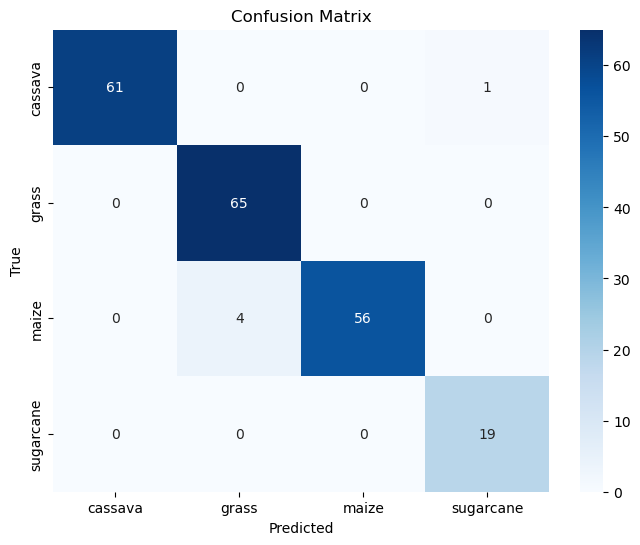

In [114]:
import matplotlib.pyplot as plt
import seaborn as sns

# Generate confusion matrix
cm = confusion_matrix(y_test, predictions)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# GaussianNB

In [115]:
from sklearn.naive_bayes import GaussianNB
# Create an instance of Naive Bayes classifier
naive_bayes = GaussianNB()

# Train the classifier
naive_bayes.fit(X_train, y_train)
# Make predictions on the test set
predictions = naive_bayes.predict(X_test)


In [116]:
# Evaluate the Naive Bayes model on the test set
from sklearn.metrics import classification_report, confusion_matrix
accuracy = naive_bayes.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)


Accuracy: 0.9514563106796117
Classification Report:
              precision    recall  f1-score   support

     cassava       1.00      0.92      0.96        62
       grass       0.94      0.98      0.96        65
       maize       0.90      0.93      0.92        60
   sugarcane       1.00      1.00      1.00        19

    accuracy                           0.95       206
   macro avg       0.96      0.96      0.96       206
weighted avg       0.95      0.95      0.95       206



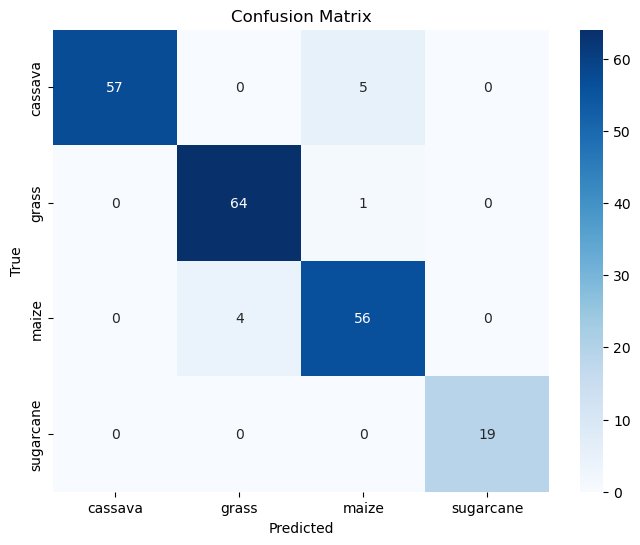

In [117]:
# Generate confusion matrix
cm = confusion_matrix(y_test, predictions)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# ORB Results


In [118]:
# Initialize empty lists to store descriptors and labels
descriptors_list = []
labels_list = []

# Extract ORB descriptors and labels for each category
for category in categories:
    category_path = os.path.join(directory, category)
    image_files = os.listdir(category_path)

    for image_file in image_files:
        image_path = os.path.join(category_path, image_file)
        image = cv2.imread(image_path)

        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Initialize the ORB detector
        orb = cv2.ORB_create()

        # Detect keypoints and compute descriptors
        keypoints, descriptors = orb.detectAndCompute(gray_image, None)

        # Check if descriptors were found
        if descriptors is not None:
            # Append descriptors to the list
            descriptors_list.append(descriptors)
            # Append labels corresponding to the descriptors
            labels_list.extend([category] * descriptors.shape[0])

In [119]:
# Concatenate descriptors and labels into numpy arrays
all_descriptors = np.concatenate(descriptors_list)
labels = np.array(labels_list)

# Split descriptors and labels into training and test sets
X_train, X_test, y_train, y_test = train_test_split(all_descriptors, labels, test_size=0.2, random_state=42)

# GaussianNB

In [126]:
from sklearn.naive_bayes import GaussianNB
# Create an instance of Naive Bayes classifier
naive_bayes = GaussianNB()

# Train the classifier
naive_bayes.fit(X_train, y_train)
# Make predictions on the test set
predictions = naive_bayes.predict(X_test)

In [127]:
# Evaluate the Naive Bayes model on the test set
from sklearn.metrics import classification_report, confusion_matrix
accuracy = naive_bayes.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)

Accuracy: 0.3959533073929961
Classification Report:
              precision    recall  f1-score   support

     cassava       0.40      0.64      0.49     31321
       grass       0.41      0.51      0.45     29783
       maize       0.35      0.18      0.24     29242
   sugarcane       0.22      0.00      0.00     12454

    accuracy                           0.40    102800
   macro avg       0.34      0.33      0.30    102800
weighted avg       0.37      0.40      0.35    102800



In [130]:
from sklearn.model_selection import GridSearchCV

# Define the hyperparameters and their possible values
param_grid = {'var_smoothing': [1e-9, 1e-8, 1e-7, 1e-6, 1e-5]}

# Create an instance of the Gaussian Naive Bayes classifier
naive_bayes = GaussianNB()

# Perform grid search cross-validation
grid_search = GridSearchCV(naive_bayes, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters
best_params = grid_search.best_params_

# Create a new classifier with the best hyperparameters
best_naive_bayes = GaussianNB(var_smoothing=best_params['var_smoothing'])

# Train the classifier with the best hyperparameters
best_naive_bayes.fit(X_train, y_train)

# Make predictions on the test set
predictions1 = best_naive_bayes.predict(X_test)


In [132]:
# Generate the classification report
from sklearn.metrics import classification_report
report = classification_report(y_test, predictions1)

print(report)

              precision    recall  f1-score   support

     cassava       0.40      0.64      0.49     31321
       grass       0.41      0.51      0.45     29783
       maize       0.35      0.18      0.24     29242
   sugarcane       0.22      0.00      0.00     12454

    accuracy                           0.40    102800
   macro avg       0.34      0.33      0.30    102800
weighted avg       0.37      0.40      0.35    102800



# KNN Classifer

In [133]:
# Create an instance of KNN classifier
knn = KNeighborsClassifier(n_neighbors=5)

# Train the classifier
knn.fit(X_train, y_train)

KNeighborsClassifier()

In [134]:
# Make predictions on the test set
predictions = knn.predict(X_test)
# Evaluate the KNN model
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)
C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdim

Accuracy: 0.5205836575875487


In [135]:
from sklearn.metrics import classification_report, confusion_matrix

# Evaluate the KNN model on the test set
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)


C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


Accuracy: 0.5205836575875487
Classification Report:
              precision    recall  f1-score   support

     cassava       0.49      0.68      0.57     31321
       grass       0.57      0.60      0.59     29783
       maize       0.53      0.37      0.43     29242
   sugarcane       0.48      0.29      0.36     12454

    accuracy                           0.52    102800
   macro avg       0.52      0.48      0.49    102800
weighted avg       0.52      0.52      0.51    102800



# Color Moments

In [137]:
from sklearn.model_selection import train_test_split
# Loop through the categories and images
for category in categories:
    category_path = os.path.join(directory, category)
    image_files = os.listdir(category_path)

    for image_file in image_files:
        image_path = os.path.join(category_path, image_file)
        image = cv2.imread(image_path)

        # Convert the image to grayscale
        gray_image = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Compute color moments
        color_moments = cv2.moments(gray_image).values()
        features.append(list(color_moments))
        labels.append(category)

# Convert features and labels to numpy arrays
features = np.array(features)
labels = np.array(labels)

# Split the data into training and test sets
X_train, X_test, y_train, y_test = train_test_split(features, labels, test_size=0.2, random_state=42)

# Print the shape of the training and test sets
print("Training set shape:", X_train.shape)
print("Test set shape:", X_test.shape)


Training set shape: (822, 24)
Test set shape: (206, 24)


# Color Moments - GaussianNB

In [138]:
from sklearn.naive_bayes import GaussianNB
# Create an instance of Naive Bayes classifier
naive_bayes = GaussianNB()

# Train the classifier
naive_bayes.fit(X_train, y_train)
# Make predictions on the test set
predictions = naive_bayes.predict(X_test)

In [139]:
# Evaluate the Naive Bayes model on the test set
from sklearn.metrics import classification_report, confusion_matrix
accuracy = naive_bayes.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)

Accuracy: 0.6213592233009708
Classification Report:
              precision    recall  f1-score   support

     cassava       0.67      0.63      0.65        62
       grass       0.65      0.98      0.79        65
       maize       0.44      0.32      0.37        60
   sugarcane       0.86      0.32      0.46        19

    accuracy                           0.62       206
   macro avg       0.66      0.56      0.57       206
weighted avg       0.62      0.62      0.59       206



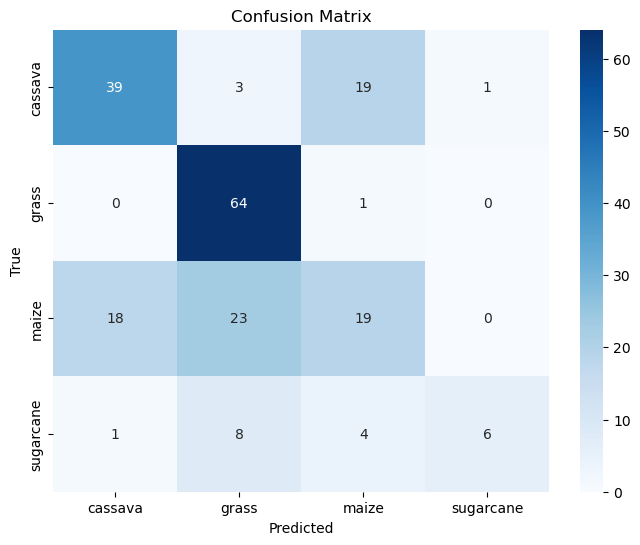

In [140]:
# Generate confusion matrix
cm = confusion_matrix(y_test, predictions)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()

# Color Moments - KNN

In [147]:
# Create an instance of KNN classifier
knn = KNeighborsClassifier(n_neighbors=3)

# Train the classifier
knn.fit(X_train, y_train)

KNeighborsClassifier(n_neighbors=3)

In [148]:
from sklearn.metrics import classification_report, confusion_matrix

# Evaluate the KNN model on the test set
accuracy = knn.score(X_test, y_test)
print("Accuracy:", accuracy)

# Generate classification report
classification_report = classification_report(y_test, predictions)
print("Classification Report:")
print(classification_report)

Accuracy: 0.7135922330097088
Classification Report:
              precision    recall  f1-score   support

     cassava       0.67      0.63      0.65        62
       grass       0.65      0.98      0.79        65
       maize       0.44      0.32      0.37        60
   sugarcane       0.86      0.32      0.46        19

    accuracy                           0.62       206
   macro avg       0.66      0.56      0.57       206
weighted avg       0.62      0.62      0.59       206



C:\ProgramData\Anaconda3\lib\site-packages\sklearn\neighbors\_classification.py:228: FutureWarning: Unlike other reduction functions (e.g. `skew`, `kurtosis`), the default behavior of `mode` typically preserves the axis it acts along. In SciPy 1.11.0, this behavior will change: the default value of `keepdims` will become False, the `axis` over which the statistic is taken will be eliminated, and the value None will no longer be accepted. Set `keepdims` to True or False to avoid this warning.
  mode, _ = stats.mode(_y[neigh_ind, k], axis=1)


# Color Moments - KNN with Hyperparameter Tunning

In [152]:
from sklearn.neighbors import KNeighborsClassifier
from sklearn.model_selection import GridSearchCV
from sklearn.metrics import classification_report

# Create an instance of the KNN classifier
knn = KNeighborsClassifier()

# Define the hyperparameter grid
param_grid = {
    'n_neighbors': [3, 5, 7],  # Number of neighbors
    'weights': ['uniform', 'distance'],  # Weighting scheme
    'p': [1, 2]  # Distance metric: 1 for Manhattan distance, 2 for Euclidean distance
}

# Perform grid search cross-validation
grid_search = GridSearchCV(knn, param_grid, cv=5)
grid_search.fit(X_train, y_train)

# Get the best hyperparameters and model
best_params = grid_search.best_params_
best_model = grid_search.best_estimator_

# Make predictions on the test set using the best model
predictions = best_model.predict(X_test)

# Generate the classification report
report = classification_report(y_test, predictions)

# Print the best hyperparameters and the classification report
print("Best Hyperparameters:", best_params)
print("Classification Report:")
print(report)

import warnings
warnings.filterwarnings('ignore')



Best Hyperparameters: {'n_neighbors': 3, 'p': 1, 'weights': 'distance'}
Classification Report:
              precision    recall  f1-score   support

     cassava       0.85      0.92      0.88        62
       grass       0.79      0.86      0.82        65
       maize       0.72      0.65      0.68        60
   sugarcane       0.71      0.53      0.61        19

    accuracy                           0.79       206
   macro avg       0.77      0.74      0.75       206
weighted avg       0.78      0.79      0.78       206



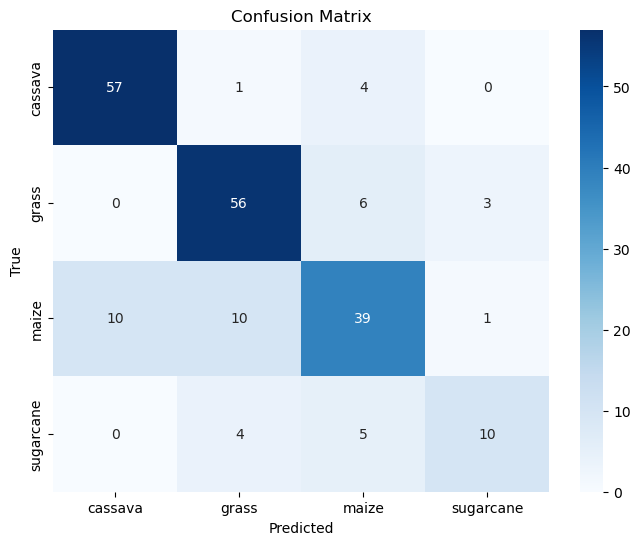

In [153]:
# Generate confusion matrix
cm = confusion_matrix(y_test, predictions)

# Create a heatmap for the confusion matrix
plt.figure(figsize=(8, 6))
sns.heatmap(cm, annot=True, cmap='Blues', fmt='d', xticklabels=categories, yticklabels=categories)
plt.xlabel('Predicted')
plt.ylabel('True')
plt.title('Confusion Matrix')
plt.show()


# Deep Learning Model - CNN 

In [154]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
from PIL import Image
import seaborn as sns
import cv2
import random
import os
import imageio
import plotly.graph_objects as go
import plotly.express as px
import plotly.figure_factory as ff
from plotly.subplots import make_subplots
from collections import Counter

from sklearn.preprocessing import StandardScaler
from sklearn.model_selection import train_test_split
from sklearn.neighbors import LocalOutlierFactor
from sklearn.metrics import accuracy_score, recall_score, precision_score, classification_report, confusion_matrix
from sklearn.model_selection import RandomizedSearchCV, cross_val_score, RepeatedStratifiedKFold
from imblearn.over_sampling import SMOTE

import tensorflow as tf
import keras
from keras.models import Sequential
from keras.layers import Dense, Dropout, Activation, Flatten
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D, BatchNormalization
from keras.applications import resnet
from keras.applications import EfficientNetB0, EfficientNetB1, EfficientNetB2, EfficientNetB3, EfficientNetB4, EfficientNetB5, EfficientNetB6, EfficientNetB7
from keras.applications.resnet import ResNet50
from keras.preprocessing.image import ImageDataGenerator

# Preparing Data for CNN 


In [155]:

data = []
img_size = 256

for i in categories:
    path = os.path.join(directory, i)
    class_num = categories.index(i)
    for file in os.listdir(path):
        filepath = os.path.join(path, file)
        img = cv2.imread(filepath, 0)
        # preprocess here
        img = cv2.resize(img, (img_size, img_size))
        data.append([img, class_num])

random.shuffle(data)

X, y = [], []
for feature, label in data:
    X.append(feature)
    y.append(label)

print('X length:', len(X))
print('y counts:', Counter(y))

# normalize
X = np.array(X).reshape(-1, img_size, img_size, 1)
X = X / 255.0
y = np.array(y)

X length: 1028
y counts: Counter({0: 314, 1: 298, 2: 292, 3: 124})


In [156]:
X_train, X_valid, y_train, y_valid = train_test_split(X, y, random_state=10, stratify=y)

print(len(X_train), X_train.shape)
print(len(X_valid), X_valid.shape)

771 (771, 256, 256, 1)
257 (257, 256, 256, 1)


In [157]:
# Split the data into train and test/validation sets
X_train, X_test_valid, y_train, y_test_valid = train_test_split(X, y, test_size=0.2, random_state=10, stratify=y)

# Further split the test/validation set into test and validation sets
X_test, X_valid, y_test, y_valid = train_test_split(X_test_valid, y_test_valid, test_size=0.5, random_state=10, stratify=y_test_valid)

# Print the shapes of the train, test, and validation sets
print("Train set:", len(X_train), X_train.shape)
print("Test set:", len(X_test), X_test.shape)
print("Validation set:", len(X_valid), X_valid.shape)

Train set: 822 (822, 256, 256, 1)
Test set: 103 (103, 256, 256, 1)
Validation set: 103 (103, 256, 256, 1)


In [175]:
train_size = X_train.shape[0]
test_size = X_test.shape[0]
valid_size = X_valid.shape[0]

print("Train set size:", train_size)
print("Test set size:", test_size)
print("Validation set size:", valid_size)

Train set size: 822
Test set size: 103
Validation set size: 103


# Applying the CNN Model

In [159]:
model = Sequential()

model.add(Conv2D(64, (3, 3), input_shape=X_train.shape[1:]))
model.add(Activation('relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Conv2D(64, (3, 3), activation='relu'))
model.add(MaxPooling2D(pool_size=(2, 2)))

model.add(Flatten())
model.add(Dense(16))
model.add(Dense(4, activation='softmax'))  #since they are 4 classes 

# Print a summary of the model architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      640       
                                                                 
 activation (Activation)     (None, 254, 254, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 246016)            0

In [160]:
# Compile the model
model.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
history = model.fit(X_train, y_train, batch_size=8, epochs=8, validation_data=(X_test, y_test))

Epoch 1/8
103/103 [==============================] - 26s 227ms/step - loss: 1.6021 - accuracy: 0.5207 - val_loss: 0.6335 - val_accuracy: 0.7864
Epoch 2/8
103/103 [==============================] - 26s 256ms/step - loss: 0.3379 - accuracy: 0.8990 - val_loss: 0.4767 - val_accuracy: 0.8252
Epoch 3/8
103/103 [==============================] - 26s 250ms/step - loss: 0.0654 - accuracy: 0.9805 - val_loss: 0.3957 - val_accuracy: 0.9029
Epoch 4/8
103/103 [==============================] - 28s 274ms/step - loss: 0.0116 - accuracy: 0.9988 - val_loss: 0.4465 - val_accuracy: 0.8447
Epoch 5/8
103/103 [==============================] - 26s 254ms/step - loss: 0.0044 - accuracy: 1.0000 - val_loss: 0.4636 - val_accuracy: 0.8738
Epoch 6/8
103/103 [==============================] - 26s 249ms/step - loss: 9.2834e-04 - accuracy: 1.0000 - val_loss: 0.4245 - val_accuracy: 0.8738
Epoch 7/8
103/103 [==============================] - 26s 253ms/step - loss: 5.9117e-04 - accuracy: 1.0000 - val_loss: 0.4135 - val_a

# Model Evaluation 

In [161]:
y_pred = model.predict(X_valid, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_valid, y_pred_bool))

4/4 [==============================] - 1s 146ms/step
              precision    recall  f1-score   support

           0       0.88      0.91      0.89        32
           1       0.94      1.00      0.97        30
           2       0.89      0.83      0.86        29
           3       1.00      0.92      0.96        12

    accuracy                           0.91       103
   macro avg       0.93      0.91      0.92       103
weighted avg       0.91      0.91      0.91       103



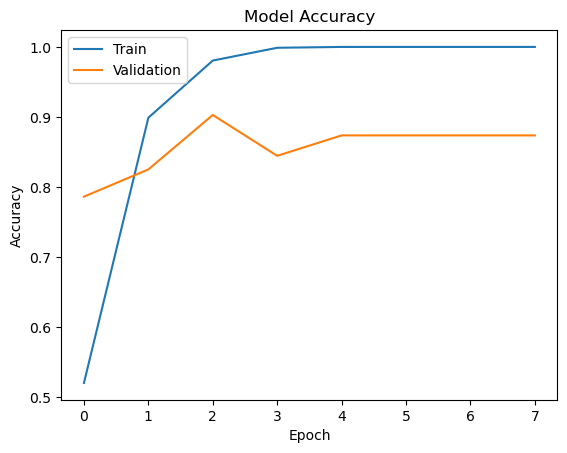

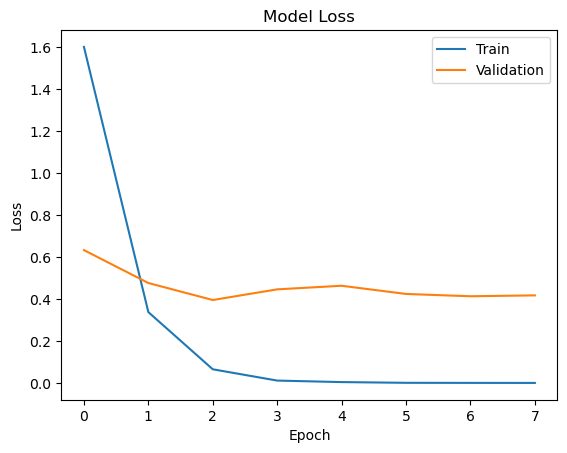

In [162]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

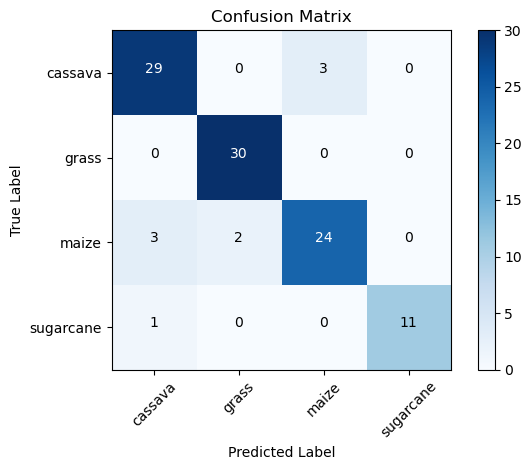

In [163]:
# Compute confusion matrix
from sklearn.metrics import accuracy_score, recall_score, precision_score, classification_report, confusion_matrix
cm = confusion_matrix(y_valid, y_pred_bool)

# Define class labels
class_labels = categories

# Plot confusion matrix
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add labels to each cell
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

# Class Weight Approach

In [164]:
model1 = Sequential()

model1.add(Conv2D(64, (3, 3), input_shape=X_train.shape[1:]))
model1.add(Activation('relu'))
model1.add(MaxPooling2D(pool_size=(2, 2)))

model1.add(Conv2D(64, (3, 3), activation='relu'))
model1.add(MaxPooling2D(pool_size=(2, 2)))

model1.add(Flatten())
model1.add(Dense(16))
model1.add(Dense(4, activation='softmax'))  #since they are 4 classes 

# Print a summary of the model architecture
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 254, 254, 64)      640       
                                                                 
 activation (Activation)     (None, 254, 254, 64)      0         
                                                                 
 max_pooling2d (MaxPooling2D  (None, 127, 127, 64)     0         
 )                                                               
                                                                 
 conv2d_1 (Conv2D)           (None, 125, 125, 64)      36928     
                                                                 
 max_pooling2d_1 (MaxPooling  (None, 62, 62, 64)       0         
 2D)                                                             
                                                                 
 flatten (Flatten)           (None, 246016)            0

In [165]:
model1.compile(loss='sparse_categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
new_weights = {
    0: X_train.shape[0]/(4*Counter(y_train)[0]),
    1: X_train.shape[0]/(4*Counter(y_train)[1]),
    2: X_train.shape[0]/(4*Counter(y_train)[2]),
    3: X_train.shape[0]/(4*Counter(y_train)[3]),
    
}

# new_weights[0] = 0.5
# new_weights[1] = 20

new_weights

{0: 0.8187250996015937,
 1: 0.8634453781512605,
 2: 0.8782051282051282,
 3: 2.0757575757575757}

In [166]:
history = model1.fit(X_train, y_train, batch_size=8, epochs=20, validation_data=(X_test, y_test), class_weight=new_weights)

Epoch 1/20
103/103 [==============================] - 24s 227ms/step - loss: 1.2723 - accuracy: 0.4891 - val_loss: 0.9156 - val_accuracy: 0.6990
Epoch 2/20
103/103 [==============================] - 28s 274ms/step - loss: 0.3732 - accuracy: 0.8747 - val_loss: 0.4751 - val_accuracy: 0.8447
Epoch 3/20
103/103 [==============================] - 28s 270ms/step - loss: 0.0465 - accuracy: 0.9903 - val_loss: 0.6501 - val_accuracy: 0.8350
Epoch 4/20
103/103 [==============================] - 26s 250ms/step - loss: 0.0039 - accuracy: 1.0000 - val_loss: 0.5104 - val_accuracy: 0.8447
Epoch 5/20
103/103 [==============================] - 26s 251ms/step - loss: 0.0010 - accuracy: 1.0000 - val_loss: 0.4824 - val_accuracy: 0.8738
Epoch 6/20
103/103 [==============================] - 27s 262ms/step - loss: 5.3636e-04 - accuracy: 1.0000 - val_loss: 0.4960 - val_accuracy: 0.8738
Epoch 7/20
103/103 [==============================] - 28s 270ms/step - loss: 3.8544e-04 - accuracy: 1.0000 - val_loss: 0.4864 

In [167]:
y_pred = model1.predict(X_valid, verbose=1)
y_pred_bool = np.argmax(y_pred, axis=1)

print(classification_report(y_valid, y_pred_bool))

4/4 [==============================] - 1s 149ms/step
              precision    recall  f1-score   support

           0       0.84      0.84      0.84        32
           1       0.86      1.00      0.92        30
           2       0.87      0.69      0.77        29
           3       0.92      1.00      0.96        12

    accuracy                           0.86       103
   macro avg       0.87      0.88      0.87       103
weighted avg       0.86      0.86      0.86       103



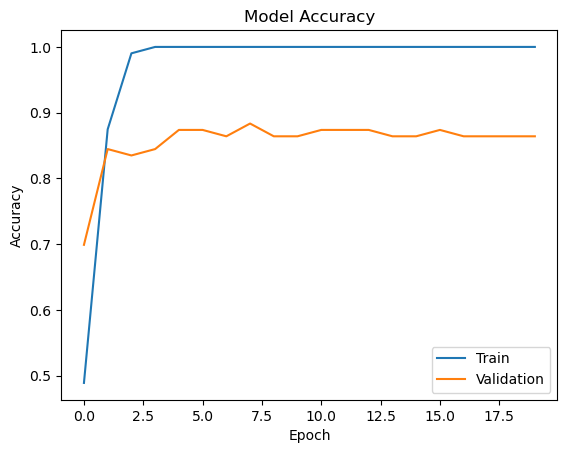

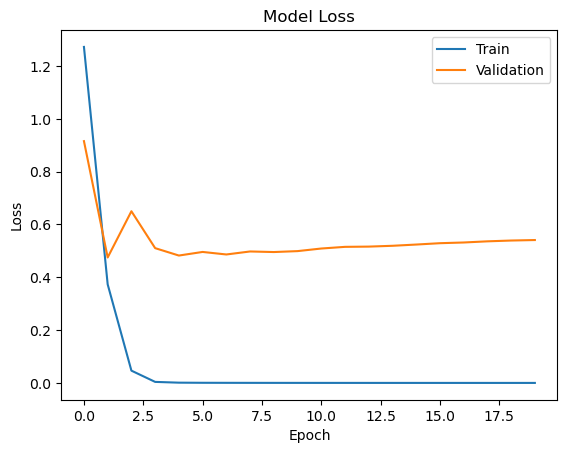

In [168]:
plt.plot(history.history['accuracy'], label='Train')
plt.plot(history.history['val_accuracy'], label='Validation')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend()
plt.show()

plt.plot(history.history['loss'], label='Train')
plt.plot(history.history['val_loss'], label='Validation')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend()
plt.show()

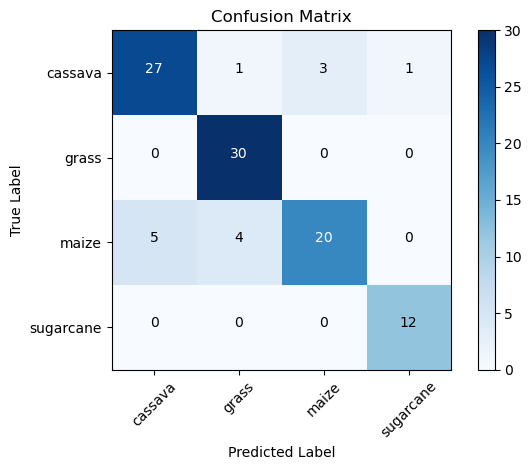

In [169]:
# Compute confusion matrix
cm = confusion_matrix(y_valid, y_pred_bool)

# Define class labels
class_labels = categories

# Plot confusion matrix
plt.imshow(cm, interpolation='nearest', cmap=plt.cm.Blues)
plt.title('Confusion Matrix')
plt.colorbar()
tick_marks = np.arange(len(class_labels))
plt.xticks(tick_marks, class_labels, rotation=45)
plt.yticks(tick_marks, class_labels)
plt.xlabel('Predicted Label')
plt.ylabel('True Label')

# Add labels to each cell
thresh = cm.max() / 2
for i in range(cm.shape[0]):
    for j in range(cm.shape[1]):
        plt.text(j, i, format(cm[i, j], 'd'),
                 horizontalalignment="center",
                 color="white" if cm[i, j] > thresh else "black")

plt.tight_layout()
plt.show()

In [179]:
git init


SyntaxError: invalid syntax (3277417328.py, line 1)